In [ ]:
!pip install rdflib networkx scikit-learn matplotlib
!pip install rdflib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 562.4/562.4 kB 15.0 MB/s eta 0:00:00


In [ ]:
from rdflib import URIRef, BNode, Literal
from rdflib import Namespace
from rdflib.namespace import CSVW, DC, DCAT, DCTERMS, DOAP, FOAF, ODRL2, ORG, OWL
from rdflib import Graph, URIRef, Literal, BNode
from rdflib.namespace import FOAF, RDF

Le code extrait et affiche les assertions pertinentes d'un graphe RDF, en excluant celles avec des prédicats commençant par "has" ou "is".

In [2]:
from rdflib import Graph, RDF, URIRef, Namespace

# Load the RDF data
graph = Graph()

graph.parse("teaching_akg.ttl", format="ttl")

# Define namespace and type for entities (adjust as needed)
TAO = Namespace("http://sonfack.com/2024/01/tao#")  # Replace with your actual namespace

# Extract and print relevant assertions
relevant_assertions = []

for subj, pred, obj in graph:
    # Exclude subjects and predicates starting with "has" or "is"
    if not str(pred).startswith("http://sonfack.com/2024/01/tao#has") and not str(pred).startswith("http://sonfack.com/2024/01/tao#is"):
        relevant_assertions.append((subj, pred, obj))

# Print relevant assertions
for subj, pred, obj in relevant_assertions:
    print(f"Subject: {subj.split('#')[-1]}\nPredicate: {pred.split('#')[-1]}\nObject: {obj.split('#')[-1]}\n" )



Subject: http://sonfack.com/2023/12/tao/classroom-c1a5b39b-992c-49fb-9c7e-a1ffaa92e884
Predicate: http://sonfack.com/2023/12/cao/hasName
Object: CR002

Subject: http://sonfack.com/2023/12/tao/digital-8df1b194-5e61-489b-ab31-366843c55775
Predicate: http://sonfack.com/2023/12/cao/hasName
Object: Learn Python - Full Course for Beginners

Subject: http://sonfack.com/2023/12/tao/isUsedFor
Predicate: comment
Object: A resource is used for an activity

Subject: http://sonfack.com/2023/12/tao/seproject-d3e90a3c-f550-45eb-b00e-59a3c6120318
Predicate: http://sonfack.com/2023/12/cao/hasName
Object: CSC 1005

Subject: http://sonfack.com/2023/12/tao/lecturer-c83b7873-f908-484d-a044-2802814f87d1
Predicate: http://sonfack.com/2023/12/cao/hasName
Object: DB course teacher

Subject: http://sonfack.com/2023/12/tao/AdministrativeStaff
Predicate: label
Object: Administrative staff

Subject: http://sonfack.com/2023/12/tao/Building
Predicate: comment
Object: A geographical located building

Subject: http://

Les fonctions extraient toutes les activités d'un graphe RDF et récupèrent les informations liées à un nœud spécifique dans le graphe.

In [4]:
from rdflib import Namespace, Graph, URIRef
from rdflib.namespace import RDF
import networkx as nx
import matplotlib.pyplot as plt

akg_file = "teaching_akg.ttl"  # Corrigez l'extension ici

g = Graph()
g.parse(akg_file)
G = nx.DiGraph()
akg_namespace = Namespace("http://sonfack.com/2023/12/tao/")
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")


def read_all_activities(akg: Graph, as_str=True) -> list:
    """This function returns all activities of an activity knowledge graph
    - akg: an activity knowledge graph as parsed by RDFLib
    - as_str: (boolean) tells if the activities are simple str default = True
    """
    activities_list = [str(activity) if as_str else activity for activity in akg.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)]
    return activities_list


def read_akg_node(node_uri: str, akg:Graph, as_str=True) -> dict:
    """This function returns all elements directly linked to a akg node
    - activity_uri (string): the given activity uri in graph akg
    - akg (Graph): an activity knowledge graph as parsed by RDFLib
    """
    activity_info = {}
    activity_uri_ref = f"{akg_namespace}{node_uri}"
    print(activity_uri_ref)
    for act_predicate, act_object in akg.predicate_objects(subject=URIRef(activity_uri_ref)):
        pred = act_predicate
        obj = act_object
        if as_str:
            pred = str(act_predicate)
            obj = str(act_object)
        if pred in activity_info:
            existing_objects = activity_info[pred] + [obj]
            activity_info[pred] = existing_objects
        else:
            activity_info[pred] = [obj]
    return activity_info

print(read_all_activities(g, False))

[rdflib.term.URIRef('http://sonfack.com/2023/12/tao/dbcourse-b63a9944-19f6-4f41-bcbd-9333ede86272'), rdflib.term.URIRef('http://sonfack.com/2023/12/tao/dbtutorial-78aca3f8-53fd-4f47-9406-414b493efe19'), rdflib.term.URIRef('http://sonfack.com/2023/12/tao/pycourse-3f993bf5-1c2f-4f58-b85a-7b6b92bcf64b'), rdflib.term.URIRef('http://sonfack.com/2023/12/tao/pypractical-f18f0361-3f12-4b3d-9459-ce2a019b4668'), rdflib.term.URIRef('http://sonfack.com/2023/12/tao/uicourse-eaf2d283-4eb8-4024-a2c5-539984984fdd'), rdflib.term.URIRef('http://sonfack.com/2023/12/tao/pmcourse-adee0f07-9e90-412b-95d4-b45d7a7476bb'), rdflib.term.URIRef('http://sonfack.com/2023/12/tao/secourse-511f491d-ea2b-428f-900e-604ea778dab5'), rdflib.term.URIRef('http://sonfack.com/2023/12/tao/setutorial-adbef907-11e0-40c1-8dd2-37eb02899ea9'), rdflib.term.URIRef('http://sonfack.com/2023/12/tao/sepractical-88ca540f-fd64-4a3c-92fd-590a12f1f46b'), rdflib.term.URIRef('http://sonfack.com/2023/12/tao/seproject-d3e90a3c-f550-45eb-b00e-59a3

La fonction `visualize_activity` trace et affiche un graphe NetworkX avec des nœuds, des arêtes et des labels d'arêtes en utilisant `matplotlib`.

In [6]:
def add_activity_to_nxgraph(G, activity_uri, activity_info):
    #print("ajout de l'activité", activity_uri)
    #print("affichage des informations", activity_info)
    activity_g = nx.DiGraph()

    for pred, obj_list in activity_info.items():
        pred_label = pred.split('/')[-1]
        if '#' in pred_label:
            pred_label = pred_label.split('#')[1]

        for obj in obj_list:
            obj_label = obj.split('/')[-1]
            node_info = read_akg_node(obj_label, g)

            if node_info:
                # Assurez-vous que vous récupérez une chaîne et non une liste
                obj_label = node_info.get('http://sonfack.com/2023/12/tao/hasName', [None])[0]
                if obj_label is None:
                    continue  # Passer à l'itération suivante si obj_label est None


            G.add_node(activity_uri)
            G.add_node(obj_label)
            G.add_edge(activity_uri, obj_label, label=pred_label)
            activity_g.add_node(activity_uri)
            activity_g.add_node(obj_label)
            activity_g.add_edge(activity_uri, obj_label, label=pred_label)

    visualize_activity(activity_g)


In [10]:
def visualize_activity(G):
  # Visualize the graph
  plt.figure(figsize=(12, 12))

  # Generate positions for nodes using a layout algorithm
  pos = nx.spring_layout(G, seed=42)

  # Draw the nodes and edges
  nx.draw(G, pos, with_labels=True, node_size=300, node_color="blue", font_size=5, font_weight="bold", edge_color="black")

  # Draw edge labels
  edge_labels = nx.get_edge_attributes(G, 'label')
  nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='green', font_size=8)

  # Show plot
  plt.title("Graphe de Connaissances des Activités")
  plt.show()


http://sonfack.com/2023/12/tao/CSC 1002 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/DataBase Course does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This course introduces the database concept to level 1 student does not look like a valid URI, trying to serialize this will break.


['http://sonfack.com/2023/12/tao/dbcourse-b63a9944-19f6-4f41-bcbd-9333ede86272', 'http://sonfack.com/2023/12/tao/dbtutorial-78aca3f8-53fd-4f47-9406-414b493efe19', 'http://sonfack.com/2023/12/tao/pycourse-3f993bf5-1c2f-4f58-b85a-7b6b92bcf64b', 'http://sonfack.com/2023/12/tao/pypractical-f18f0361-3f12-4b3d-9459-ce2a019b4668', 'http://sonfack.com/2023/12/tao/uicourse-eaf2d283-4eb8-4024-a2c5-539984984fdd', 'http://sonfack.com/2023/12/tao/pmcourse-adee0f07-9e90-412b-95d4-b45d7a7476bb', 'http://sonfack.com/2023/12/tao/secourse-511f491d-ea2b-428f-900e-604ea778dab5', 'http://sonfack.com/2023/12/tao/setutorial-adbef907-11e0-40c1-8dd2-37eb02899ea9', 'http://sonfack.com/2023/12/tao/sepractical-88ca540f-fd64-4a3c-92fd-590a12f1f46b', 'http://sonfack.com/2023/12/tao/seproject-d3e90a3c-f550-45eb-b00e-59a3c6120318']
http://sonfack.com/2023/12/tao/dbcourse-b63a9944-19f6-4f41-bcbd-9333ede86272
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfac

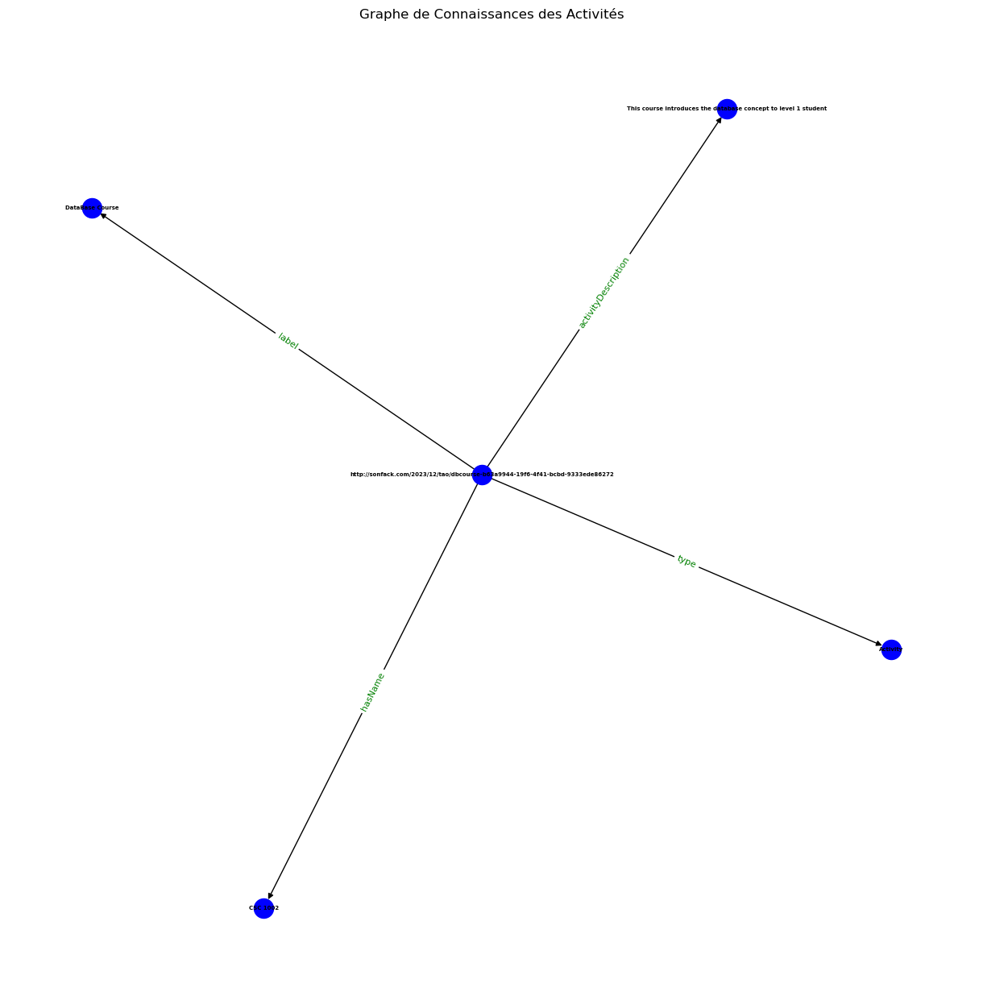

http://sonfack.com/2023/12/tao/CSC 1022 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/DataBase Tutorial does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This tutorial answers database question to level 1 student does not look like a valid URI, trying to serialize this will break.


http://sonfack.com/2023/12/tao/dbtutorial-78aca3f8-53fd-4f47-9406-414b493efe19
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/cao/hasName': ['CSC 1022'], 'http://www.w3.org/2000/01/rdf-schema#label': ['DataBase Tutorial'], 'http://sonfack.com/2023/12/cao/hasBeginTime': ['http://sonfack.com/2023/12/tao/10AM-f5ee7bc0-fb61-4d4e-9a32-565a5a7df03a'], 'http://sonfack.com/2023/12/cao/activityDescription': ['This tutorial answers database question to level 1 student'], 'http://sonfack.com/2023/12/cao/hasDuration': ['120'], 'http://sonfack.com/2023/12/cao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-59c2099d-746e-4872-bbc1-ea0891430f47'], 'http://sonfack.com/2023/12/tao/hasLocation': ['http://sonfack.com/2023/12/tao/computerroom-4ecbe47c-8f8e-4835-93ac-16d2392e30a2', 'http://sonfack.com/2023/12/tao/classroom-c1a5b39b-992c-49fb-9c7e-a1ffaa92e884'], 'http://sonfack.com/2023/12/cao/isComposedOf': ['http://so

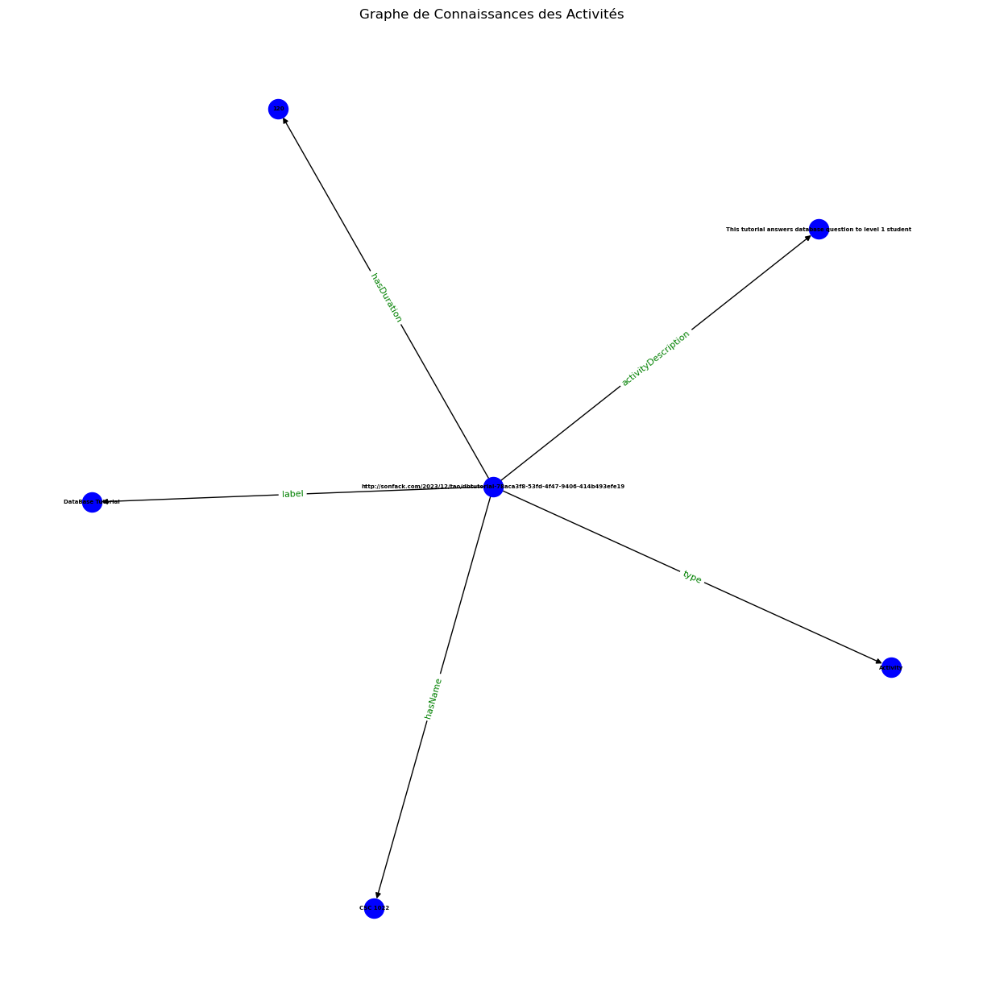

http://sonfack.com/2023/12/tao/CSC 1001 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/Python Course does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This course introduces the python programming to level 1 student does not look like a valid URI, trying to serialize this will break.


http://sonfack.com/2023/12/tao/pycourse-3f993bf5-1c2f-4f58-b85a-7b6b92bcf64b
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/cao/hasName': ['CSC 1001'], 'http://www.w3.org/2000/01/rdf-schema#label': ['Python Course'], 'http://sonfack.com/2023/12/cao/activityDescription': ['This course introduces the python programming to level 1 student'], 'http://sonfack.com/2023/12/cao/hasTime': ['http://sonfack.com/2023/12/tao/8AM-10AM-0ea7a574-e6be-4dc7-abe1-85a6b8ce2e3d'], 'http://sonfack.com/2023/12/cao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-969f073e-1e01-4ad0-a0f0-fb806ba5a50e'], 'http://sonfack.com/2023/12/cao/hasLocation': ['http://sonfack.com/2023/12/tao/computerroom-5a2454c8-c664-401c-86b7-425e75dddc39', 'http://sonfack.com/2023/12/tao/tutorialroom-351e99f6-c93b-4377-b987-511652d2eefe'], 'http://sonfack.com/2023/12/tao/isFollowedBy': ['http://sonfack.com/2023/12/tao/pypractical-f18f0361-3f12-4b3d-

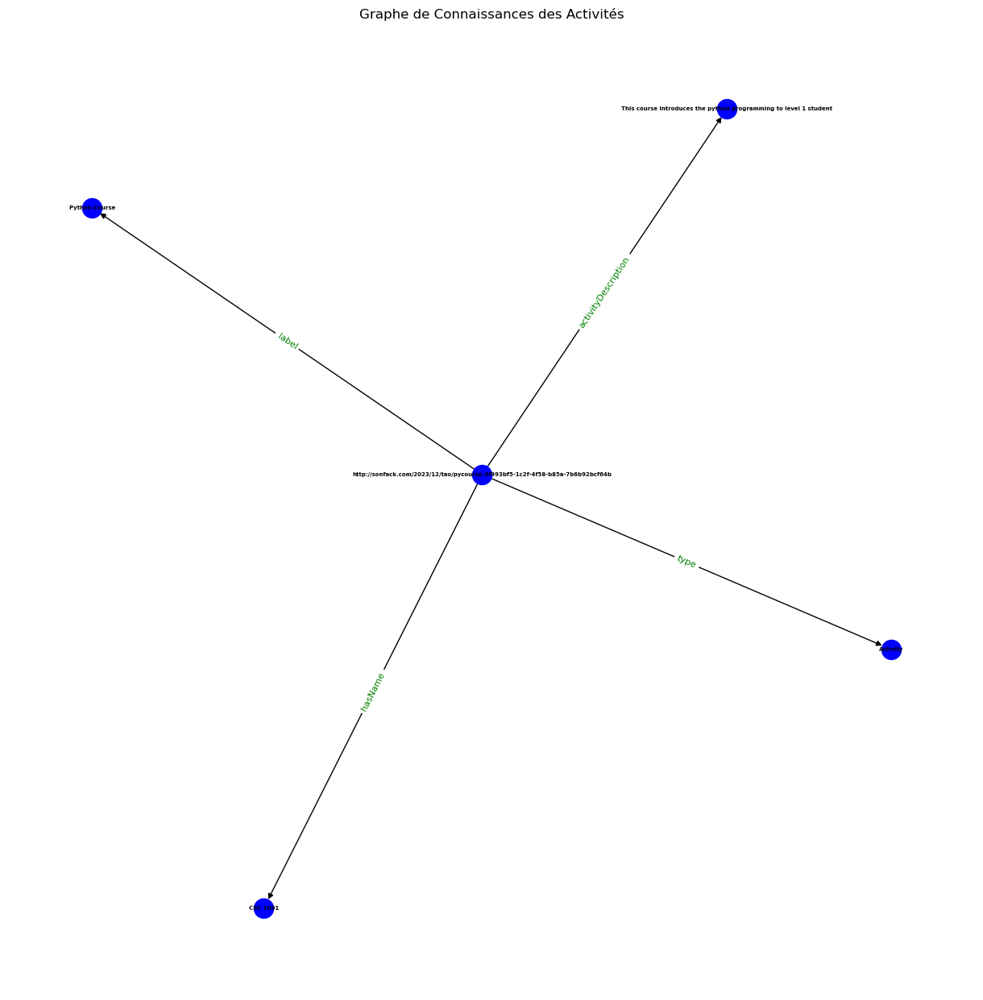

http://sonfack.com/2023/12/tao/CSC 1011 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/Python Practical does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This course is for monitoring python programming practicals for level 1 student does not look like a valid URI, trying to serialize this will break.


http://sonfack.com/2023/12/tao/pypractical-f18f0361-3f12-4b3d-9459-ce2a019b4668
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/cao/hasName': ['CSC 1011'], 'http://www.w3.org/2000/01/rdf-schema#label': ['Python Practical'], 'http://sonfack.com/2023/12/cao/activityDescription': ['This course is for monitoring python programming practicals for level 1 student'], 'http://sonfack.com/2023/12/cao/hasRule': ['http://sonfack.com/2023/12/tao/rule-cdc19603-45e5-4c06-8d5a-47624147f67e'], 'http://sonfack.com/2023/12/cao/hasTime': ['http://sonfack.com/2023/12/tao/8AM-10AM-1470781d-1128-4f43-ab61-4088953f071a'], 'http://sonfack.com/2023/12/cao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-969f073e-1e01-4ad0-a0f0-fb806ba5a50e'], 'http://sonfack.com/2023/12/cao/hasLocation': ['http://sonfack.com/2023/12/tao/computerroom-5a2454c8-c664-401c-86b7-425e75dddc39', 'http://sonfack.com/2023/12/tao/tutorialroom-351e99f6-c

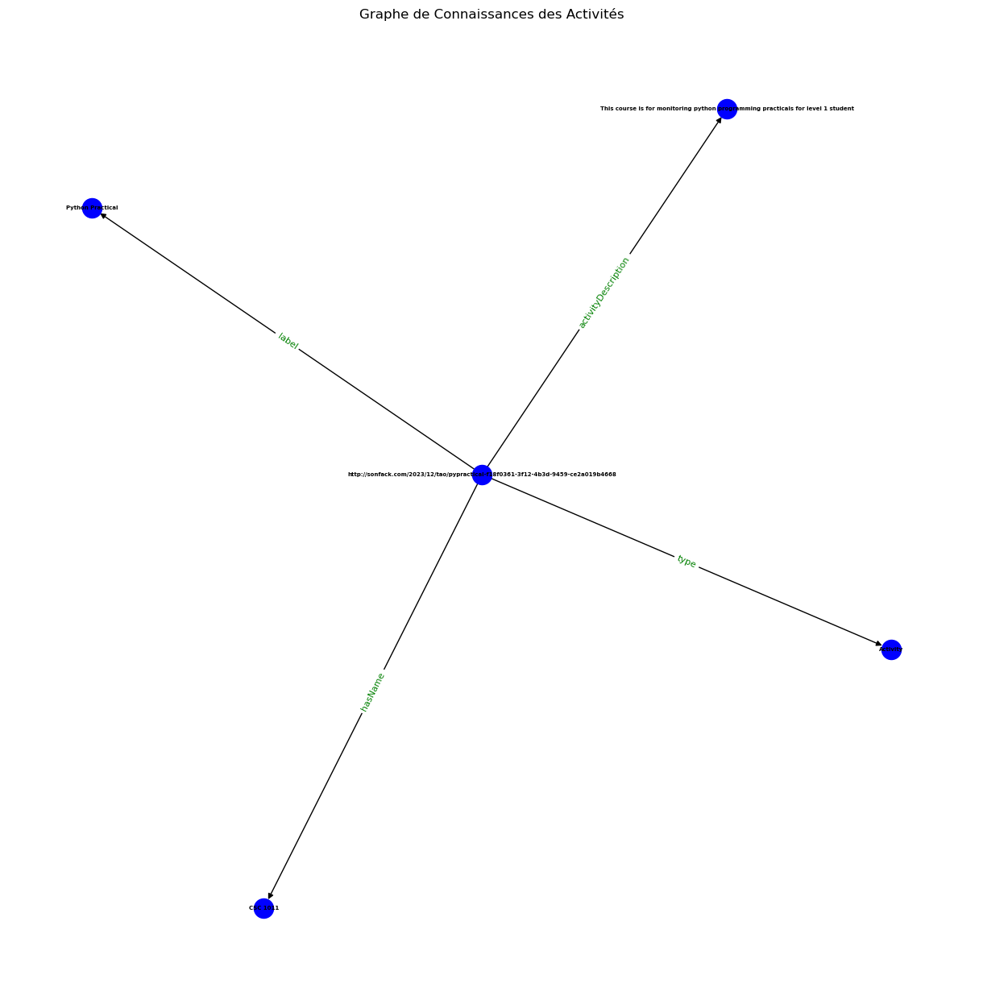

http://sonfack.com/2023/12/tao/CSC 1006 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/User Interface Course does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This course introduces the user interface design principles to level 1 student does not look like a valid URI, trying to serialize this will break.


http://sonfack.com/2023/12/tao/uicourse-eaf2d283-4eb8-4024-a2c5-539984984fdd
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/cao/hasName': ['CSC 1006'], 'http://www.w3.org/2000/01/rdf-schema#label': ['User Interface Course'], 'http://sonfack.com/2023/12/cao/activityDescription': ['This course introduces the user interface design principles to level 1 student'], 'http://sonfack.com/2023/12/cao/hasTime': ['http://sonfack.com/2023/12/tao/10AM-12AM-6ab82d7d-72dc-40f2-a209-8bc6b4bb04e7'], 'http://sonfack.com/2023/12/cao/hasObjectiveive': ['http://sonfack.com/2023/12/tao/objective-9a59e20a-60f0-4798-8895-50f6b79621c5'], 'http://sonfack.com/2023/12/cao/hasLocation': ['http://sonfack.com/2023/12/tao/computerroom-9cd6c49c-e52f-48ef-9d23-d868af4802c4', 'http://sonfack.com/2023/12/tao/classroom-9b1749fc-8ce7-42ce-89d6-4e7ff8b826c7'], 'http://sonfack.com/2023/12/cao/isComposedOf': ['http://sonfack.com/2023/12/tao/lecturin

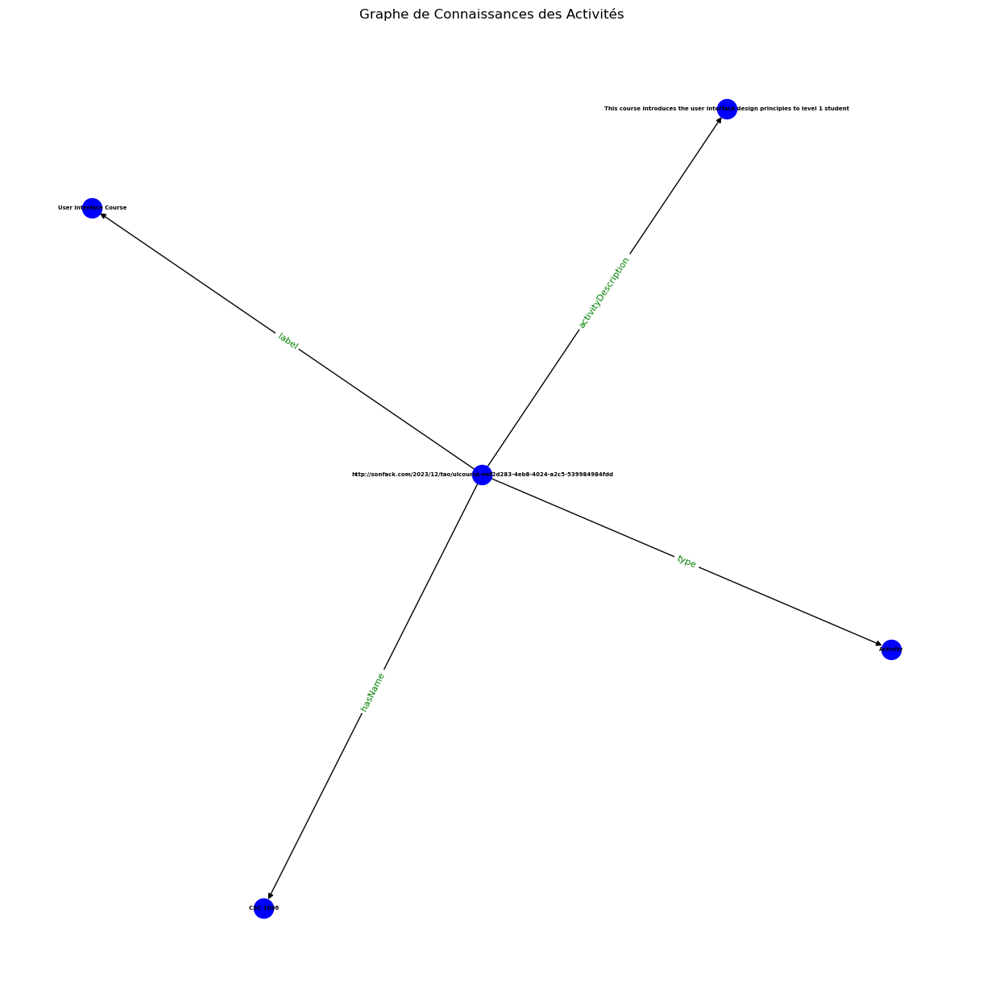

http://sonfack.com/2023/12/tao/PM 1001 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/Project Management Course does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This course introduces project management concepts to level 1 student does not look like a valid URI, trying to serialize this will break.


http://sonfack.com/2023/12/tao/pmcourse-adee0f07-9e90-412b-95d4-b45d7a7476bb
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/cao/hasName': ['PM 1001'], 'http://www.w3.org/2000/01/rdf-schema#label': ['Project Management Course'], 'http://sonfack.com/2023/12/cao/activityDescription': ['This course introduces project management concepts to level 1 student'], 'http://sonfack.com/2023/12/cao/hasTime': ['http://sonfack.com/2023/12/tao/8AM-10AM-b139b467-7fbf-4298-9338-fa372b608e5e'], 'http://sonfack.com/2023/12/cao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-0b6e8fa9-d03d-4636-ab9c-b34578b4ea45'], 'http://sonfack.com/2023/12/cao/hasLocation': ['http://sonfack.com/2023/12/tao/classroom-3414ff41-3e7a-44de-a679-baac1ab873c2'], 'http://sonfack.com/2023/12/cao/isComposedOf': ['http://sonfack.com/2023/12/tao/lecturing-12b5c207-f470-4bf3-bb3d-e6b31c954954'], 'http://sonfack.com/2023/12/cao/isCarriedOutWith': [

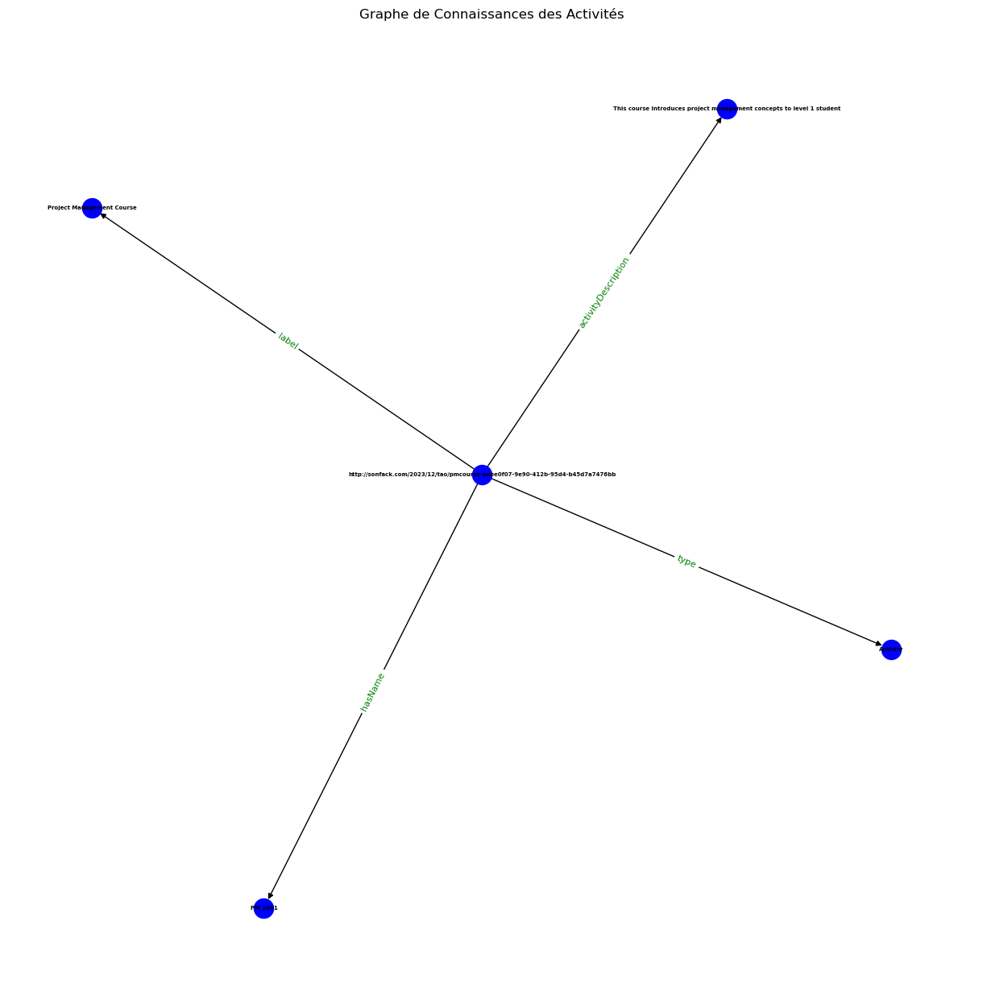

http://sonfack.com/2023/12/tao/CSC 1003 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/Software Engineering Course does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This course introduces software engineering to level 1 student does not look like a valid URI, trying to serialize this will break.


http://sonfack.com/2023/12/tao/secourse-511f491d-ea2b-428f-900e-604ea778dab5
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/cao/hasName': ['CSC 1003'], 'http://www.w3.org/2000/01/rdf-schema#label': ['Software Engineering Course'], 'http://sonfack.com/2023/12/cao/activityDescription': ['This course introduces software engineering to level 1 student'], 'http://sonfack.com/2023/12/cao/hasDuration': ['120'], 'http://sonfack.com/2023/12/cao/hasEndTime': ['http://sonfack.com/2023/12/tao/12AM-6ec5a9a1-54b9-4310-96f4-9ecbdbf8344f'], 'http://sonfack.com/2023/12/cao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-f4de69e1-e2ba-41a6-a268-803293e73080'], 'http://sonfack.com/2023/12/cao/hasLocation': ['http://sonfack.com/2023/12/tao/classroom-25eafa60-5f87-4e1f-9609-93bcdcfbb0c9'], 'http://sonfack.com/2023/12/tao/isFollowedBy': ['http://sonfack.com/2023/12/tao/setutorial-adbef907-11e0-40c1-8dd2-37eb02899ea9'], '

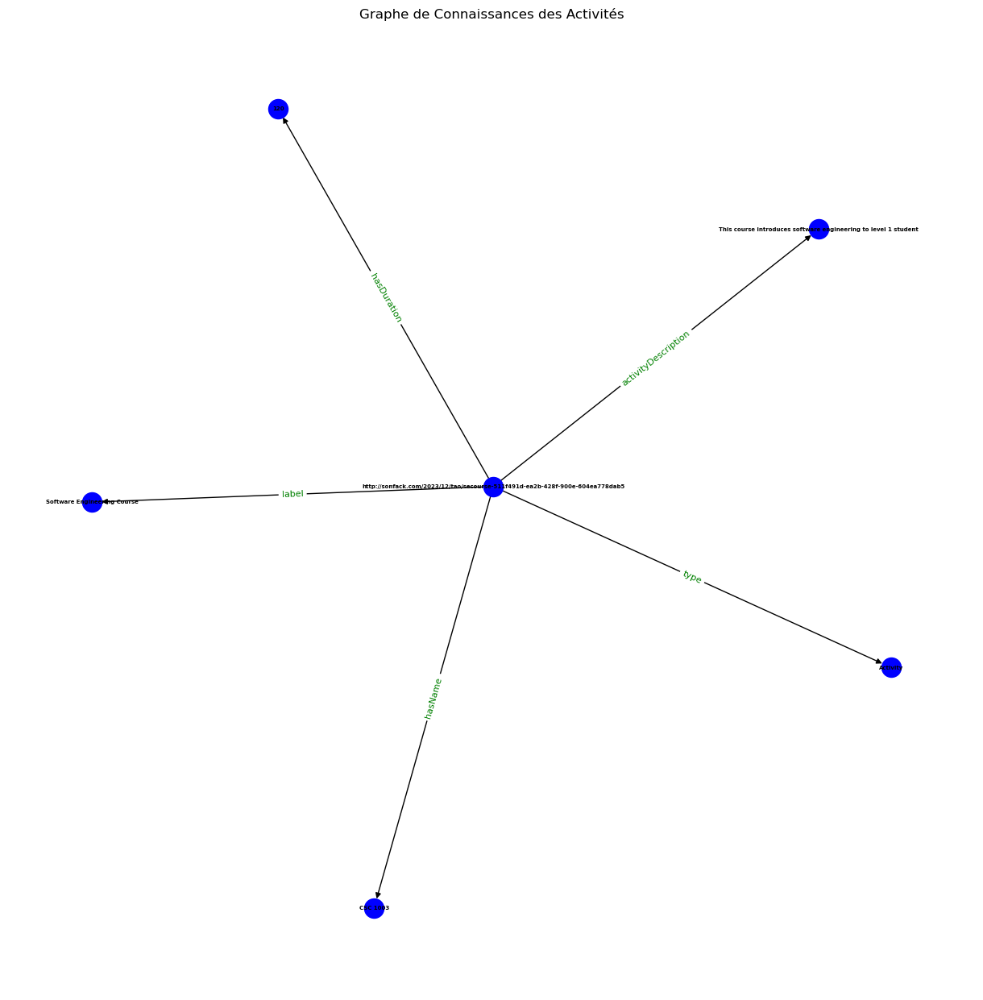

http://sonfack.com/2023/12/tao/CSC 1023 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/Software Engineering Tutorial does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This tutorial answers level 1 student questions on software engineering does not look like a valid URI, trying to serialize this will break.


http://sonfack.com/2023/12/tao/setutorial-adbef907-11e0-40c1-8dd2-37eb02899ea9
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/cao/hasName': ['CSC 1023'], 'http://www.w3.org/2000/01/rdf-schema#label': ['Software Engineering Tutorial'], 'http://sonfack.com/2023/12/cao/activityDescription': ['This tutorial answers level 1 student questions on software engineering'], 'http://sonfack.com/2023/12/cao/hasBeginTime': ['http://sonfack.com/2023/12/tao/10AM-0fbdca75-5c06-4a88-9181-ee1a035a7fec'], 'http://sonfack.com/2023/12/cao/hasDuration': ['120'], 'http://sonfack.com/2023/12/cao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-f4de69e1-e2ba-41a6-a268-803293e73080'], 'http://sonfack.com/2023/12/cao/hasLocation': ['http://sonfack.com/2023/12/tao/tutorialroom-351e99f6-c93b-4377-b987-511652d2eefe'], 'http://sonfack.com/2023/12/tao/isFollowedBy': ['http://sonfack.com/2023/12/tao/sepractical-88ca540f-fd64-4a3c-92f

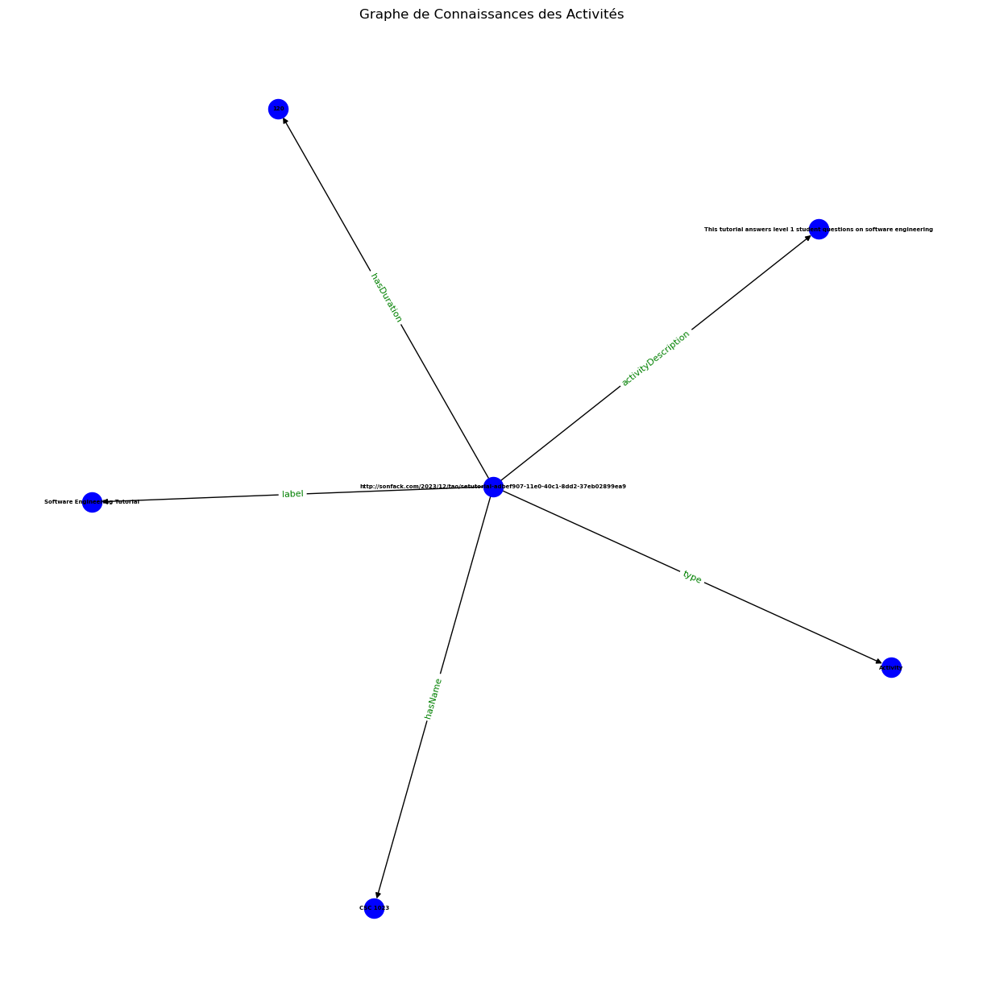

http://sonfack.com/2023/12/tao/CSC 1013 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/Software Engineering Practical does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This course monitor software engineering practical questions for level 1 student does not look like a valid URI, trying to serialize this will break.


http://sonfack.com/2023/12/tao/sepractical-88ca540f-fd64-4a3c-92fd-590a12f1f46b
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/cao/hasName': ['CSC 1013'], 'http://www.w3.org/2000/01/rdf-schema#label': ['Software Engineering Practical'], 'http://sonfack.com/2023/12/cao/activityDescription': ['This course monitor software engineering practical questions for level 1 student'], 'http://sonfack.com/2023/12/cao/hasRule': ['http://sonfack.com/2023/12/tao/rule-cdc19603-45e5-4c06-8d5a-47624147f67e'], 'http://sonfack.com/2023/12/cao/hasTime': ['http://sonfack.com/2023/12/tao/10AM-12AM-f4e589a5-aac9-42b7-b498-706732141ca1'], 'http://sonfack.com/2023/12/cao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-f4de69e1-e2ba-41a6-a268-803293e73080'], 'http://sonfack.com/2023/12/cao/hasLocation': ['http://sonfack.com/2023/12/tao/computerroom-5a2454c8-c664-401c-86b7-425e75dddc39'], 'http://sonfack.com/2023/12/tao/isFoll

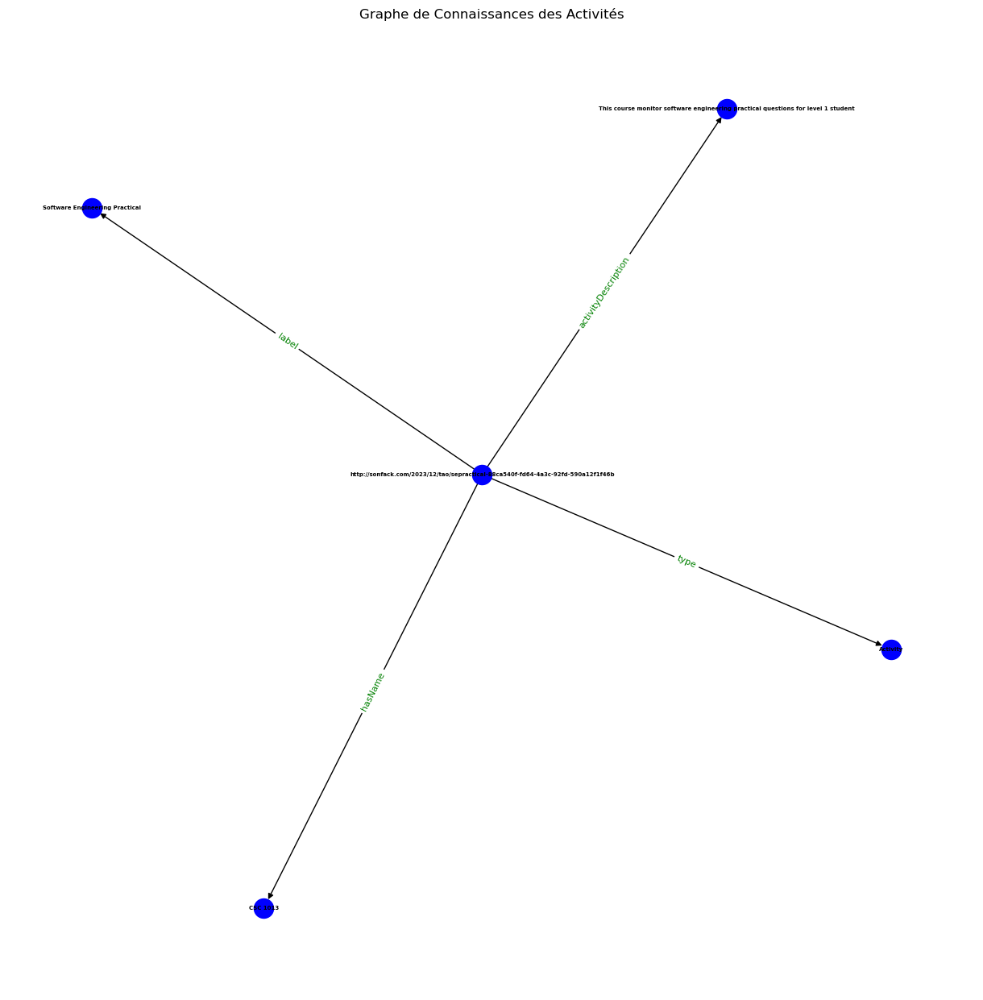

http://sonfack.com/2023/12/tao/Software Engineering Project does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This course is for follow up of software engineering projects of level 1 student does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/CSC 1005 does not look like a valid URI, trying to serialize this will break.


http://sonfack.com/2023/12/tao/seproject-d3e90a3c-f550-45eb-b00e-59a3c6120318
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://www.w3.org/2000/01/rdf-schema#label': ['Software Engineering Project'], 'http://sonfack.com/2023/12/cao/activityDescription': ['This course is for follow up of software engineering projects of level 1 student'], 'http://sonfack.com/2023/12/cao/hasName': ['CSC 1005'], 'http://sonfack.com/2023/12/cao/hasTime': ['http://sonfack.com/2023/12/tao/08AM-10AM-35e7d9ed-4694-48e0-a6b6-394bd4155a13'], 'http://sonfack.com/2023/12/cao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-284ef78c-99f5-45f0-935a-553678664616'], 'http://sonfack.com/2023/12/cao/hasLocation': ['http://sonfack.com/2023/12/tao/computerroom-5a2454c8-c664-401c-86b7-425e75dddc39'], 'http://sonfack.com/2023/12/cao/isBeneficialTo': ['http://sonfack.com/2023/12/tao/bsc-410688e8-e5d3-4e9c-9ca4-c28bf92827af'], 'http://sonfack.com/2023/12/cao/isCa

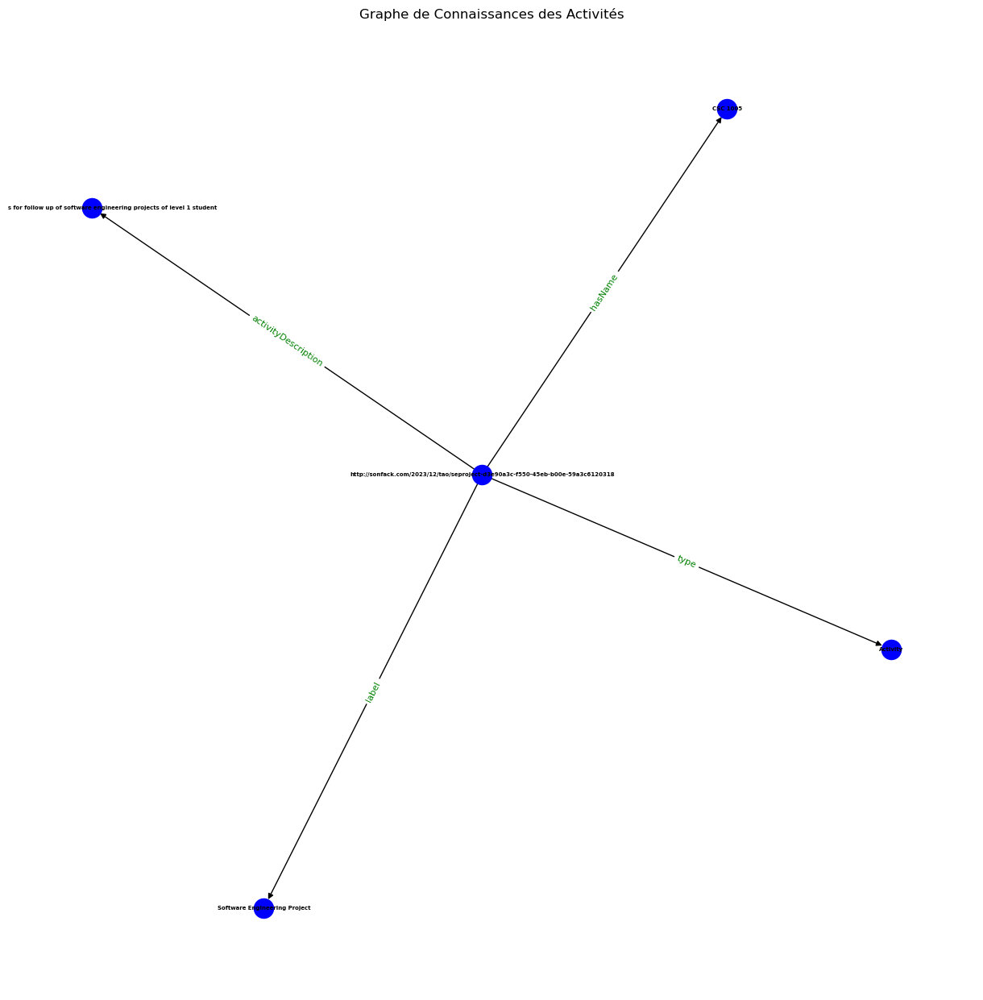

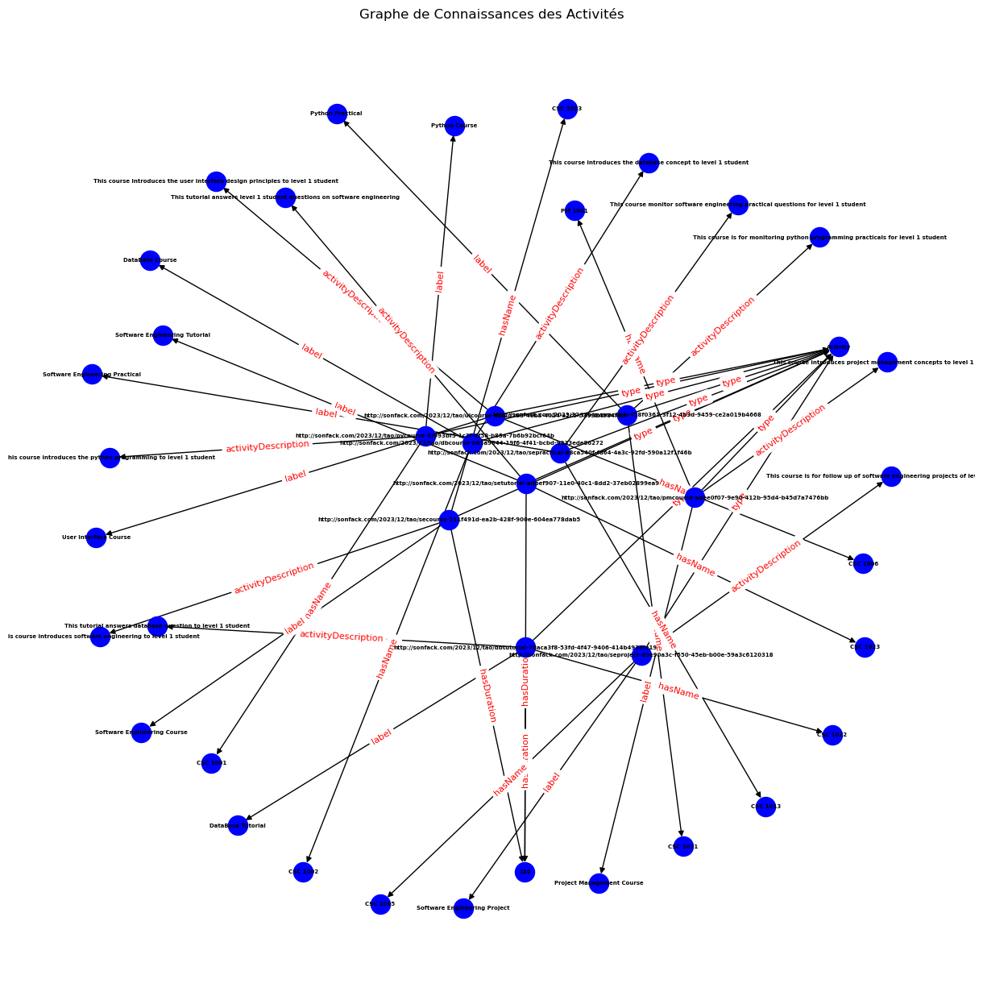

In [12]:
liste_activity = read_all_activities(g, as_str=True)
print(liste_activity)
for activity in liste_activity:
  subj = activity.split('/')[-1]
  info_activity = read_akg_node(subj, g, as_str=True)
  print(info_activity)
  add_activity_to_nxgraph(G,activity,info_activity)


# Visualize the graph
plt.figure(figsize=(12, 12))

# Generate positions for nodes using a layout algorithm
pos = nx.spring_layout(G, seed=42)

# Draw the nodes and edges
nx.draw(G, pos, with_labels=True, node_size=300, node_color="blue", font_size=5, font_weight="bold", edge_color="black")

# Draw edge labels
edge_labels = nx.get_edge_attributes(G, 'label')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red', font_size=8)

# Show plot
plt.title("Graphe de Connaissances des Activités")
plt.show()


Le code lit des activités à partir d'un graphe, les ajoute à un graphe NetworkX, puis visualise ce graphe avec des nœuds, des arêtes et des labels.

In [13]:
def add_activity_to_nxgraph(G, activity_uri, activity_info):
    #print("ajout de l'activité", activity_uri)
    #print("affichage des informations", activity_info)
    activity_g = nx.DiGraph()

    for pred, obj_list in activity_info.items():
        pred_label = pred.split('/')[-1]
        if '#' in pred_label:
            pred_label = pred_label.split('#')[1]

        for obj in obj_list:
            obj_label = obj.split('/')[-1]
            node_info = read_akg_node(obj_label, g)

            if node_info:
                # Assurez-vous que vous récupérez une chaîne et non une liste
                obj_label = node_info.get('http://sonfack.com/2023/12/tao/hasName', [None])[0]
                if obj_label is None:
                    continue  # Passer à l'itération suivante si obj_label est None


            G.add_node(activity_uri)
            G.add_node(obj_label)
            G.add_edge(activity_uri, obj_label, label=pred_label)
            activity_g.add_node(activity_uri)
            activity_g.add_node(obj_label)
            activity_g.add_edge(activity_uri, obj_label, label=pred_label)

    visualize_activity(activity_g)

Le code crée un graphe dirigé à partir de données RDF, en ajoutant des noeuds et des arêtes pour les assertions pertinentes, puis visualise ce graphe avec des étiquettes pour les relations.

Subject: book-ddec-dcc-ac-dd-bcbadb
Predicate: type
Object: HardDocument

Subject: Moral
Predicate: subClassOf
Object: http://sonfack.com/2023/12/cao/Subject



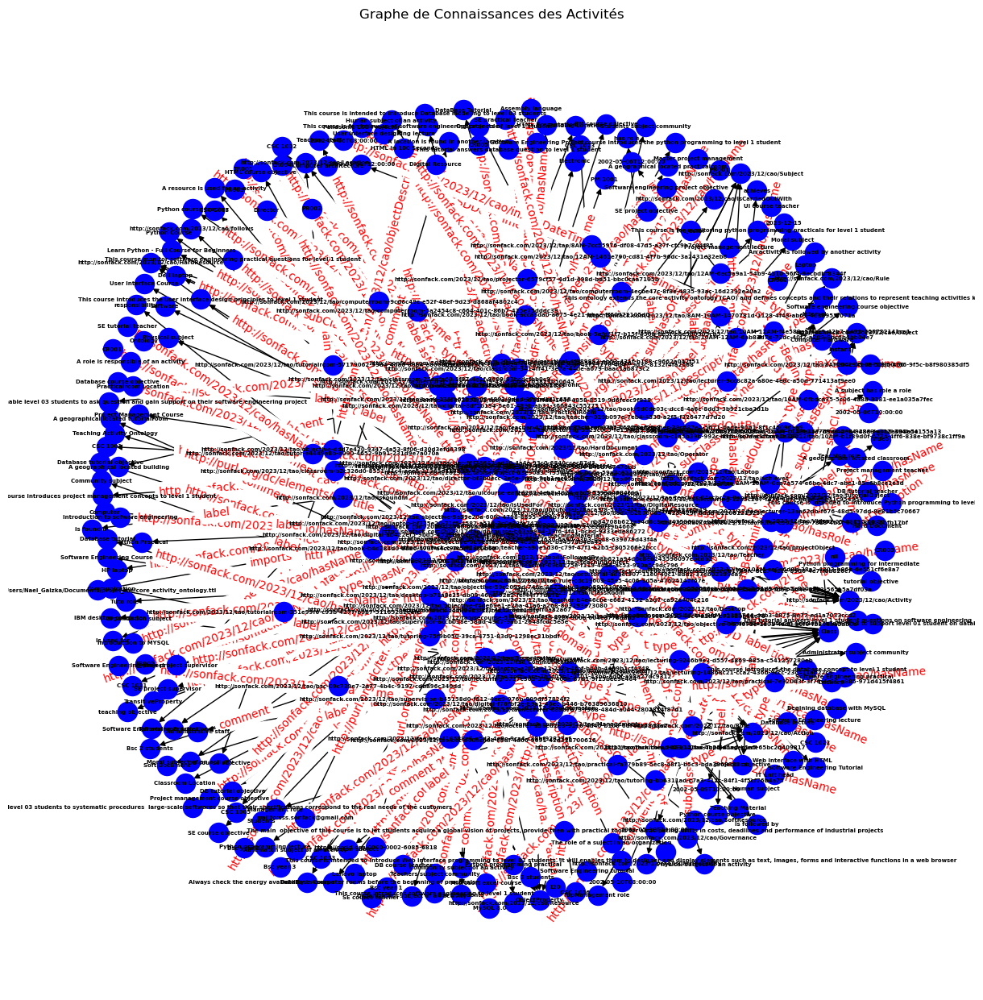

In [16]:
from rdflib import Graph, Namespace
import networkx as nx
import matplotlib.pyplot as plt
import re

# Load the RDF data
graph = Graph()
graph.parse("teaching_akg.ttl", format="ttl")

# Define namespace and type for entities (adjust as needed)
TAO = Namespace("http://sonfack.com/2024/01/tao#")  # Replace with your actual namespace


# Liste de vos informations RDF (exemple)
data = [
    {"subject": "http://sonfack.com/2023/12/tao/book-9d0de03c-dcc8-4a6c-8dd3-3b921cba2d1b", "predicate": "type", "object": "http://sonfack.com/2023/12/tao/HardDocument"},
    {"subject": "http://sonfack.com/2023/12/tao/Moral", "predicate": "subClassOf", "object": "http://sonfack.com/2023/12/cao/Subject"},
    # ... ajoutez d'autres données ici
]


# Initialize NetworkX graph
G = nx.DiGraph()  # Using directed graph to capture the direction of relationships

# Extract and add relevant assertions to the graph
for subj, pred, obj in graph:
    if not str(pred).startswith("http://sonfack.com/2024/01/tao#has#") and not str(pred).startswith("http://sonfack.com/2024/01/tao#is#"):
        subj_label = subj.split('#')[-1]
        pred_label = pred.split('#')[-1]
        obj_label = obj.split('#')[-1]
        G.add_node(subj_label)  # Add subject node
        G.add_node(obj_label)   # Add object node
        G.add_edge(subj_label, obj_label, label=pred_label)  # Add edge with predicate as label

        # Print the extracted information
        # print(f"Subject: {subj_label}\nPredicate: {pred_label}\nObject: {obj_label}\n")


        # Fonction pour extraire la partie du nom après le namespace et retirer les chiffres
def extract_name_without_numbers(uri, namespace):
    match = re.match(f"{re.escape(namespace)}(.+)", uri)
    if match:
        name_with_numbers = match.group(1)
        # Retirer les chiffres
        name_without_numbers = re.sub(r'\d+', '', name_with_numbers)
        return name_without_numbers.strip('-')  # Retirer les tirets restants
    return uri

# Namespace à utiliser pour extraire les noms
namespace = "http://sonfack.com/2023/12/tao/"

# Traitement des données
for item in data:
    subject_name = extract_name_without_numbers(item['subject'], namespace)
    predicate = item['predicate']
    object_name = extract_name_without_numbers(item['object'], namespace)
    print(f"Subject: {subject_name}\nPredicate: {predicate}\nObject: {object_name}\n")


      # Positionnement des nœuds pour la visualisation
pos = nx.spring_layout(G)

# Visualize the graph
plt.figure(figsize=(12, 12))

# Generate positions for nodes using a layout algorithm
pos = nx.spring_layout(G, seed=42)

# Draw the nodes and edges
nx.draw(G, pos, with_labels=True, node_size=300, node_color="blue", font_size=5, font_weight="bold", edge_color="black")

# Draw edge labels
edge_labels = nx.get_edge_attributes(G, 'label')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red', font_size=10)

# Show plot
plt.title("Graphe de Connaissances des Activités")
plt.show()


In [22]:
!pip install python-louvain

In [23]:
import community.community_louvain as community_louvain
import networkx as nx
import matplotlib.pyplot as plt

In [26]:
# Convertir le graphe en non dirigé
G_undirected = G.to_undirected()

# Appliquer l'algorithme de Louvain
partitions = community_louvain.best_partition(G_undirected)

# Afficher le nombre de communautés détectées
print(f"Nombre de communautés détectées: {len(set(partitions.values()))}")


Nombre de communautés détectées: 15


http://sonfack.com/2023/12/tao/object1
http://sonfack.com/2023/12/tao/object2
http://sonfack.com/2023/12/tao/object3


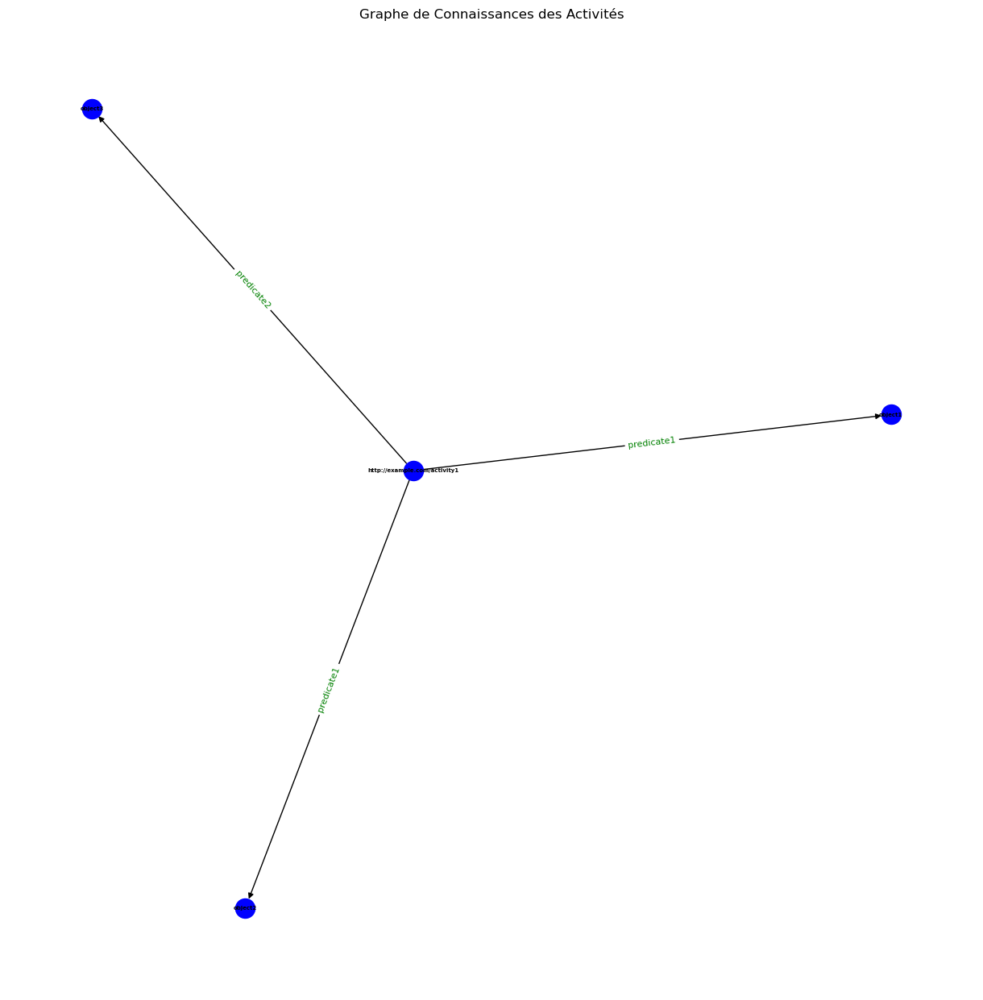

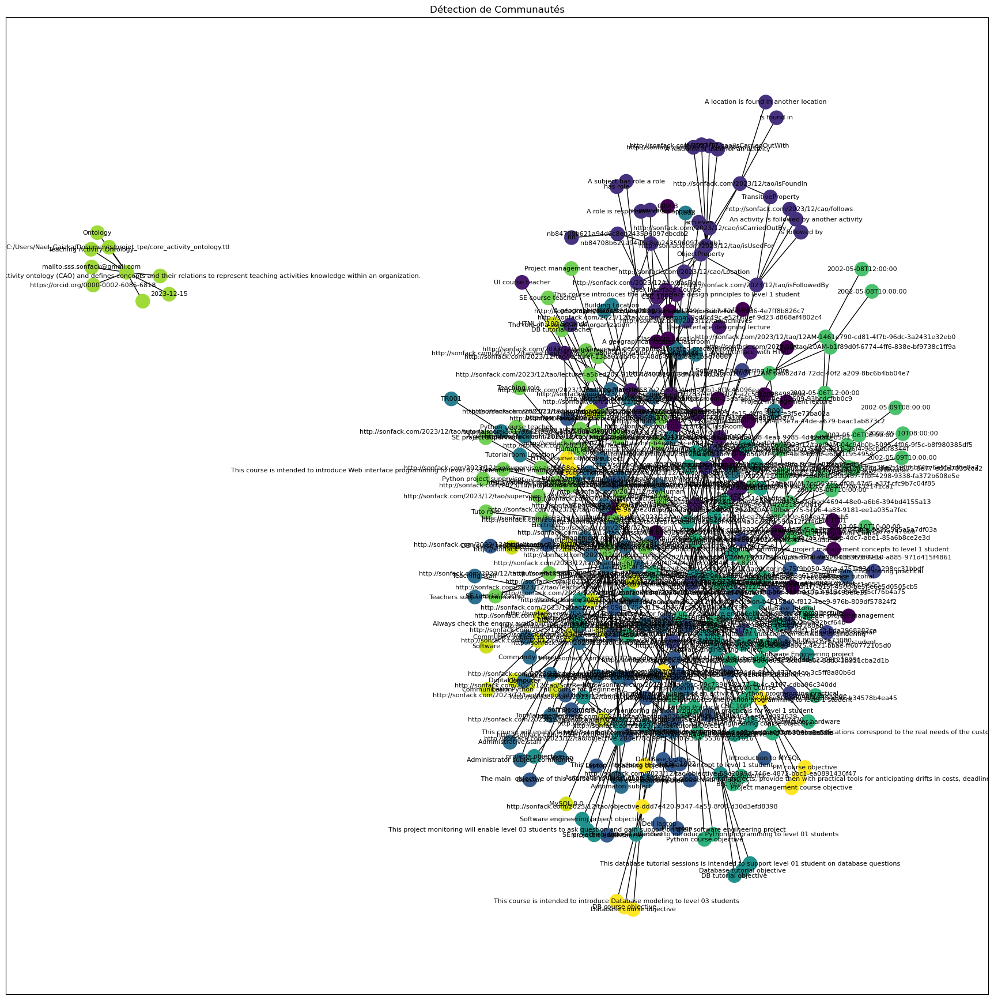

In [28]:

# Visualisation des communautés
# Exemples d'activité et d'informations à ajouter (à ajuster selon vos données)
activity_uri = "http://example.com/activity1"
activity_info = {
    "http://example.com/predicate1": ["http://example.com/object1", "http://example.com/object2"],
    "http://example.com/predicate2": ["http://example.com/object3"]
}

# Appeler la fonction pour ajouter l'activité au graphe
add_activity_to_nxgraph(G, activity_uri, activity_info)
plt.figure(figsize=(22, 22))
pos = nx.spring_layout(G_undirected, seed=42)
cmap = plt.get_cmap('viridis')
nx.draw_networkx_nodes(G_undirected, pos, node_size=300, node_color=list(partitions.values()), cmap=cmap, alpha=1)
nx.draw_networkx_edges(G_undirected, pos, edge_color="black", alpha=1)
nx.draw_networkx_labels(G_undirected, pos, font_size=8)
plt.title("Détection de Communautés")
plt.show()


In [ ]:
!pip install python-louvain

In [34]:
!pip install rdflib networkx matplotlib


In [35]:
!pip install louvain
!pip install igraph

  Using cached louvain-0.8.2.tar.gz (4.2 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Running setup.py clean for louvain
Failed to build louvain


  error: subprocess-exited-with-error
  
  python setup.py bdist_wheel did not run successfully.
  exit code: 1
  
  [54 lines of output]
  D:\anacondao\Lib\site-packages\setuptools\__init__.py:94: _DeprecatedInstaller: setuptools.installer and fetch_build_eggs are deprecated.
  !!
  
          ********************************************************************************
          Requirements should be satisfied by a PEP 517 installer.
          If you are using pip, you can try `pip install --use-pep517`.
          ********************************************************************************
  
  !!
    dist.fetch_build_eggs(dist.setup_requires)
  D:\anacondao\Lib\site-packages\setuptools\_distutils\dist.py:261: UserWarning: Unknown distribution option: 'test_suite'
    warnings.warn(msg)
  [11/25/24 21:53:36] WARNING  toml section missing       pyproject_reading.py:42
                               'pyproject.toml does not
                               contain a
             

In [ ]:
import community
print(community.__file__)


/usr/local/lib/python3.10/dist-packages/community/__init__.py


In [37]:
import community as community_louvain
import networkx as nx
import matplotlib.pyplot as plt
import igraph as ig
import louvain

ModuleNotFoundError: No module named 'louvain'

In [ ]:
!pip install python-louvain


http://sonfack.com/2023/12/tao/CSC 1002 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/DataBase Course does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This course introduces the database concept to level 1 student does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/CSC 1022 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/DataBase Tutorial does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This tutorial answers database question to level 1 student does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/CSC 1001 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/Python Course does not look like a valid URI, trying to serialize this will break.
htt

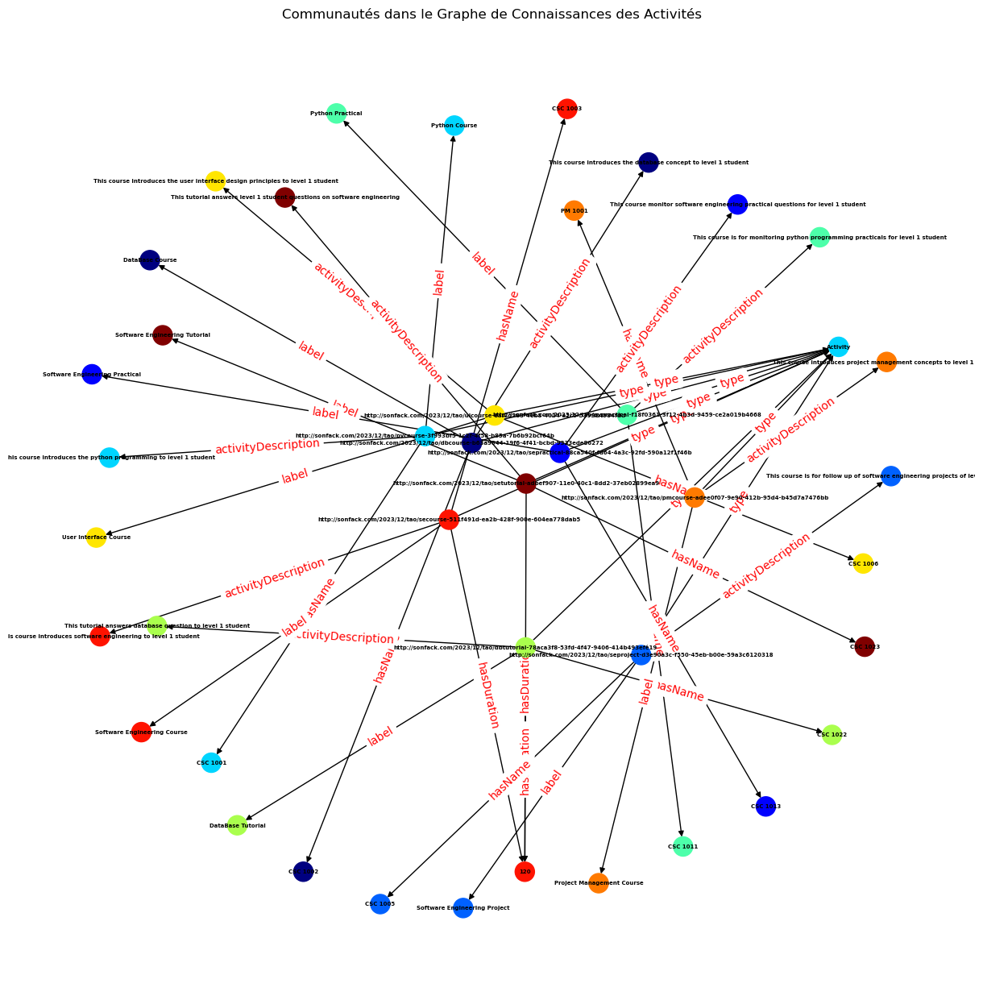

In [40]:
from rdflib import Graph, RDF, URIRef, Namespace
import networkx as nx
import matplotlib.pyplot as plt
import community.community_louvain as community_louvain  # Correct import

# Charger les données RDF
graph = Graph()
graph.parse("teaching_akg.ttl", format="ttl")

# Définir les espaces de noms
TAO = Namespace("http://sonfack.com/2024/01/tao#")  # Remplacez par votre espace de nom réel
akg_namespace = Namespace("http://sonfack.com/2023/12/tao/")
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")

def read_all_activities(akg: Graph, as_str=True) -> list:
    """Retourne toutes les activités d'un graphe de connaissances."""
    activities_list = [str(activity) if as_str else activity for activity in akg.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)]
    return activities_list

def read_akg_node(node_uri: str, akg: Graph, as_str=True) -> dict:
    """Retourne tous les éléments directement liés à un nœud du graphe."""
    activity_info = {}
    activity_uri_ref = f"{akg_namespace}{node_uri}"
    for act_predicate, act_object in akg.predicate_objects(subject=URIRef(activity_uri_ref)):
        pred = act_predicate
        obj = act_object
        if as_str:
            pred = str(act_predicate)
            obj = str(act_object)
        if pred in activity_info:
            existing_objects = activity_info[pred] + [obj]
            activity_info[pred] = existing_objects
        else:
            activity_info[pred] = [obj]
    return activity_info

def add_activity_to_nxgraph(G, activity_uri, activity_info):
    """Ajoute les activités et leurs relations au graphe NetworkX."""
    for pred, obj_list in activity_info.items():
        pred_label = pred.split('/')[-1]
        if '#' in pred_label:
            pred_label = pred_label.split('#')[1]

        for obj in obj_list:
            obj_label = obj.split('/')[-1]
            node_info = read_akg_node(obj_label, graph)

            if node_info:
                # Assurez-vous que vous récupérez une chaîne et non une liste
                obj_label = node_info.get('http://sonfack.com/2023/12/tao/hasName', [None])[0]
                if obj_label is None:
                    continue

            G.add_node(activity_uri)
            G.add_node(obj_label)
            G.add_edge(activity_uri, obj_label, label=pred_label)

def visualize_activity(G):
    """Visualiser le graphe de connaissances."""
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(G, seed=42)
    nx.draw(G, pos, with_labels=True, node_size=300, node_color="blue", font_size=5, font_weight="bold", edge_color="black")
    edge_labels = nx.get_edge_attributes(G, 'label')
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='green', font_size=8)
    plt.title("Graphe de Connaissances des Activités")
    plt.show()

# Charger le fichier RDF dans un graphe NetworkX
G = nx.DiGraph()

# Lire toutes les activités
liste_activity = read_all_activities(graph, as_str=True)

# Ajouter chaque activité au graphe
for activity in liste_activity:
    subj = activity.split('/')[-1]
    info_activity = read_akg_node(subj, graph, as_str=True)
    add_activity_to_nxgraph(G, activity, info_activity)

# Détection des communautés
partition = community_louvain.best_partition(G.to_undirected())

# Visualiser les communautés
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42)
colors = [partition[node] for node in G.nodes()]
nx.draw(G, pos, node_color=colors, with_labels=True, node_size=300, cmap=plt.cm.jet, font_size=5, font_weight="bold", edge_color="black")
edge_labels = nx.get_edge_attributes(G, 'label')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red', font_size=10)
plt.title("Communautés dans le Graphe de Connaissances des Activités")
plt.show()


vérification du nombres de noeuds et d'arêtes

In [42]:
from rdflib import Graph

# Charger les données RDF depuis le fichier
graph = Graph()
graph.parse("teaching_akg.ttl", format="ttl")

import networkx as nx

# Initialiser un graphe orienté
G = nx.DiGraph()
# Exemples d'activité et d'informations à ajouter (à ajuster selon vos données)
activity_uri = "http://example.com/activity1"
activity_info = {
    "http://example.com/predicate1": ["http://example.com/object1", "http://example.com/object2"],
    "http://example.com/predicate2": ["http://example.com/object3"]
}


# Parcourez le graphe RDF et ajoutez les nœuds et arêtes dans G
for subj, pred, obj in graph:
    if not str(pred).startswith("http://sonfack.com/2024/01/tao#has") and not str(pred).startswith("http://sonfack.com/2024/01/tao#is"):
        subj_label = subj.split('#')[-1]
        pred_label = pred.split('#')[-1]
        obj_label = obj.split('#')[-1]
        G.add_node(subj_label)  # Ajouter un nœud pour le sujet
        G.add_node(obj_label)   # Ajouter un nœud pour l'objet
        G.add_edge(subj_label, obj_label, label=pred_label)  # Ajouter une arête avec le prédicat comme étiquette

print(f"Nombre de nœuds : {G.number_of_nodes()}")
print(f"Nombre d'arêtes : {G.number_of_edges()}")


Nombre de nœuds : 342
Nombre d'arêtes : 506


In [44]:
!pip install python-louvain

import community as community_louvain  # Ou utilisez l'importation directe du module si nécessaire


http://sonfack.com/2023/12/tao/CSC 1002 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/DataBase Course does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This course introduces the database concept to level 1 student does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/CSC 1022 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/DataBase Tutorial does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This tutorial answers database question to level 1 student does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/CSC 1001 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/Python Course does not look like a valid URI, trying to serialize this will break.
htt

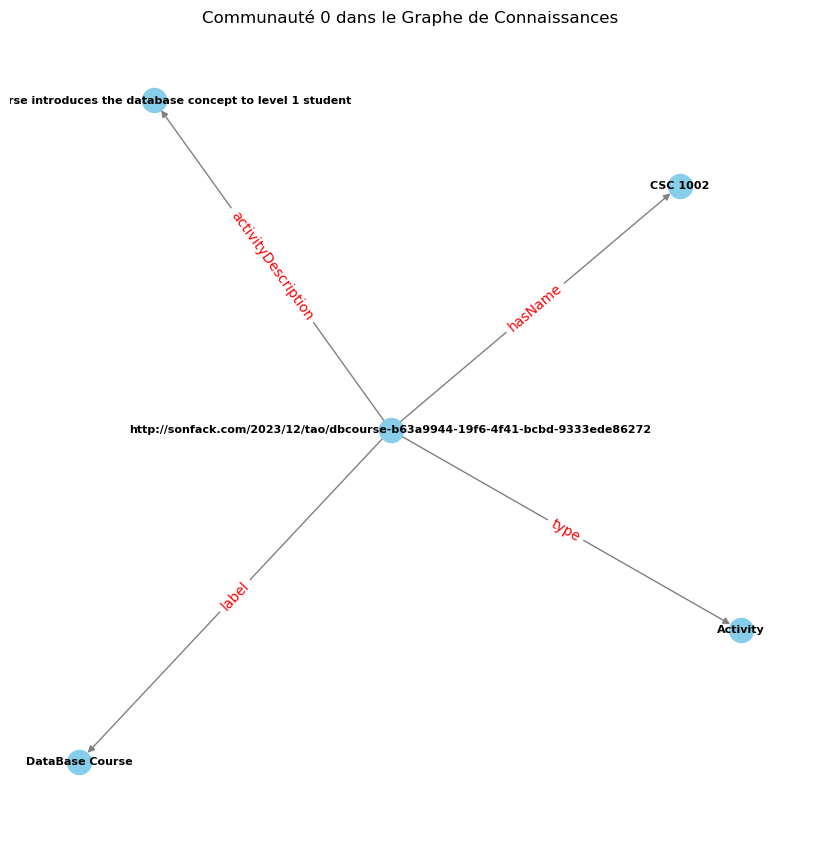

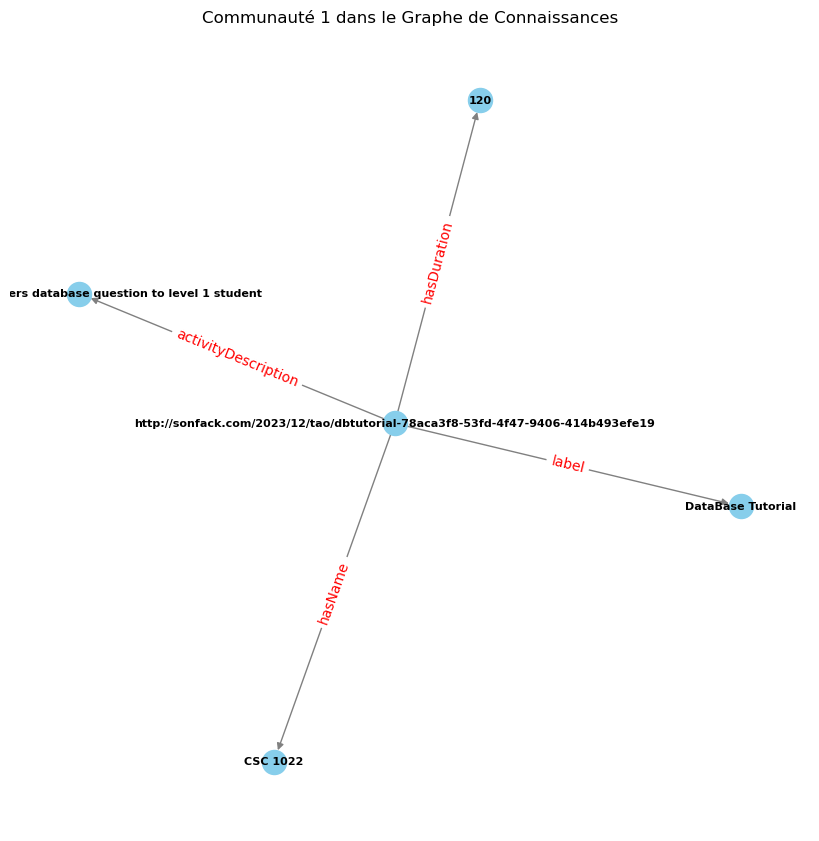

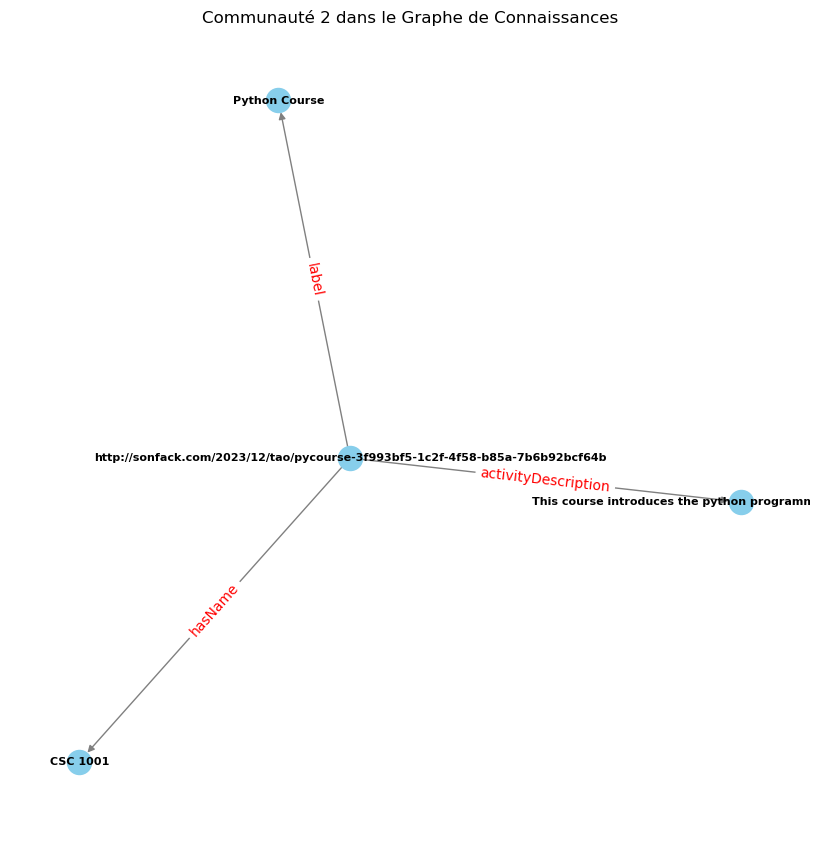

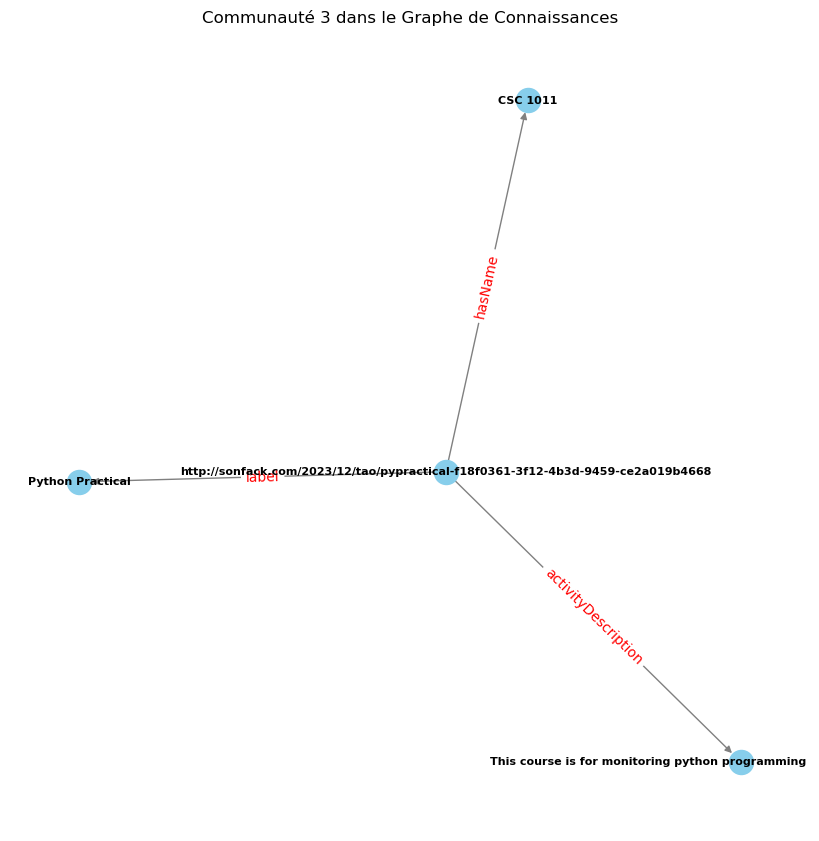

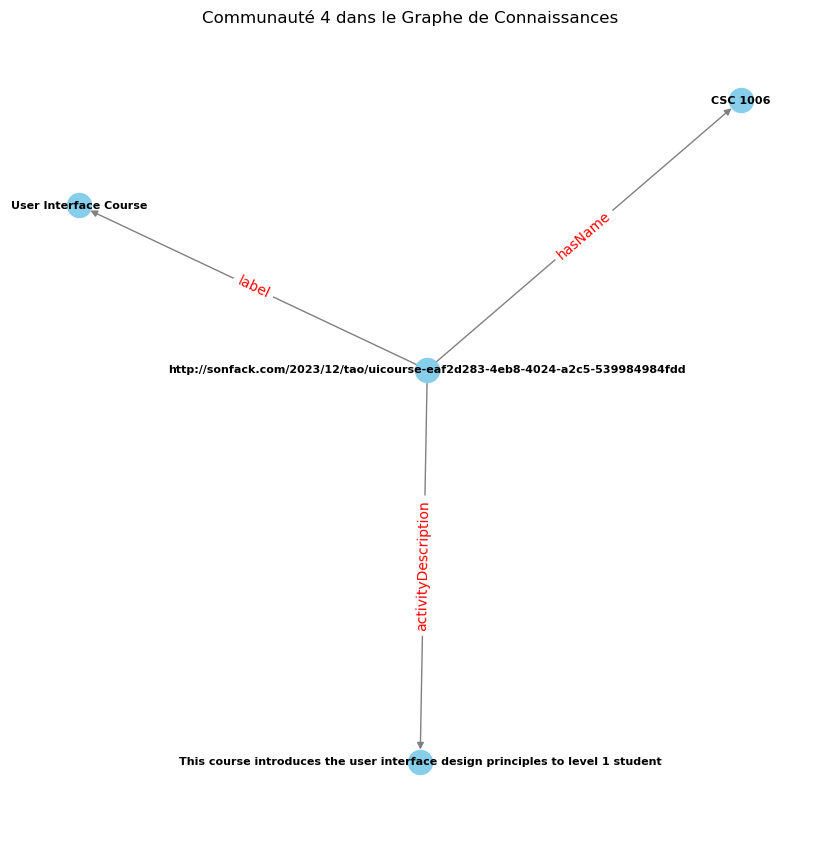

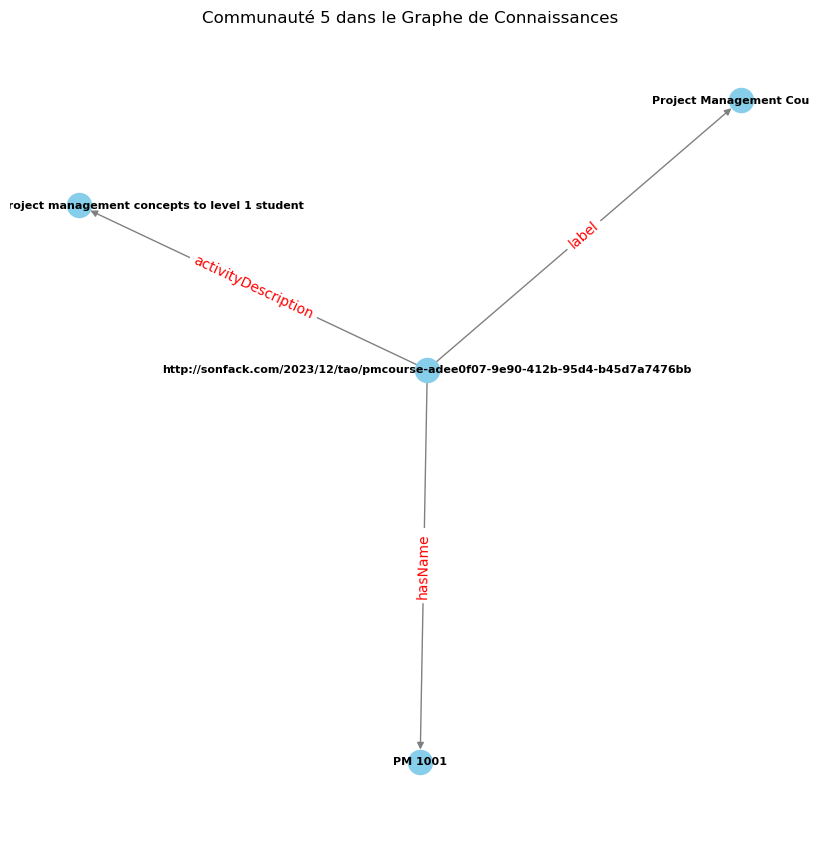

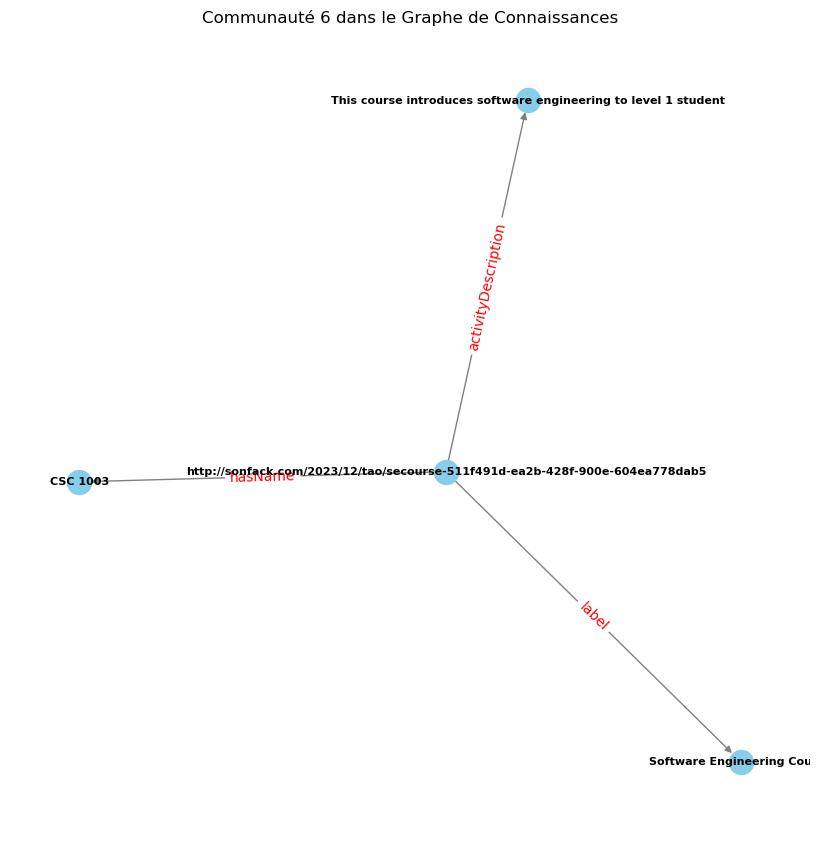

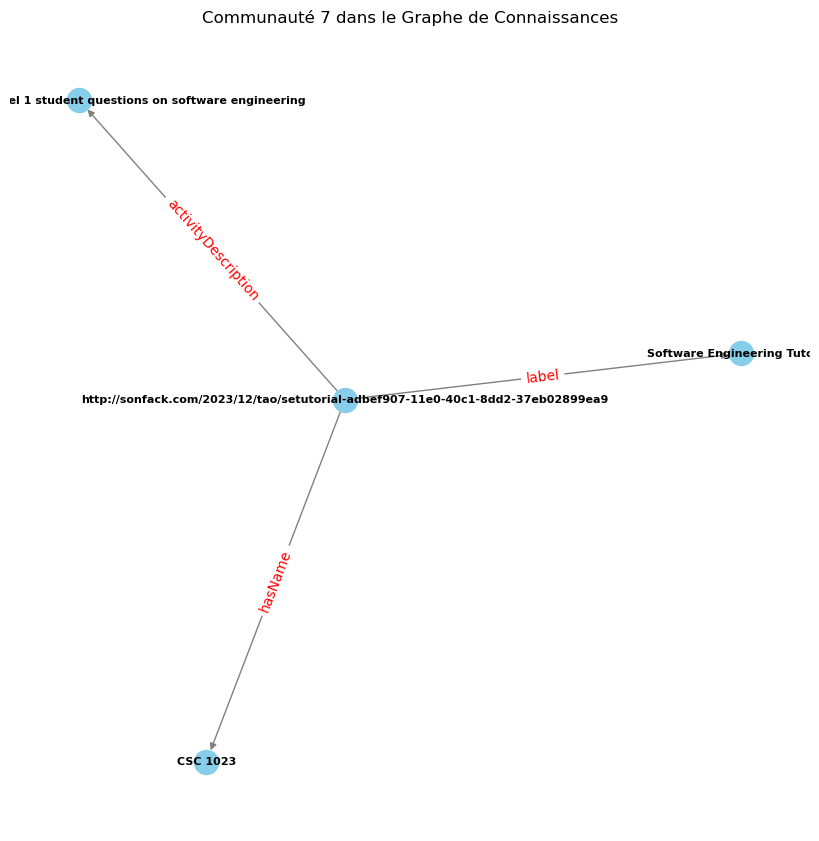

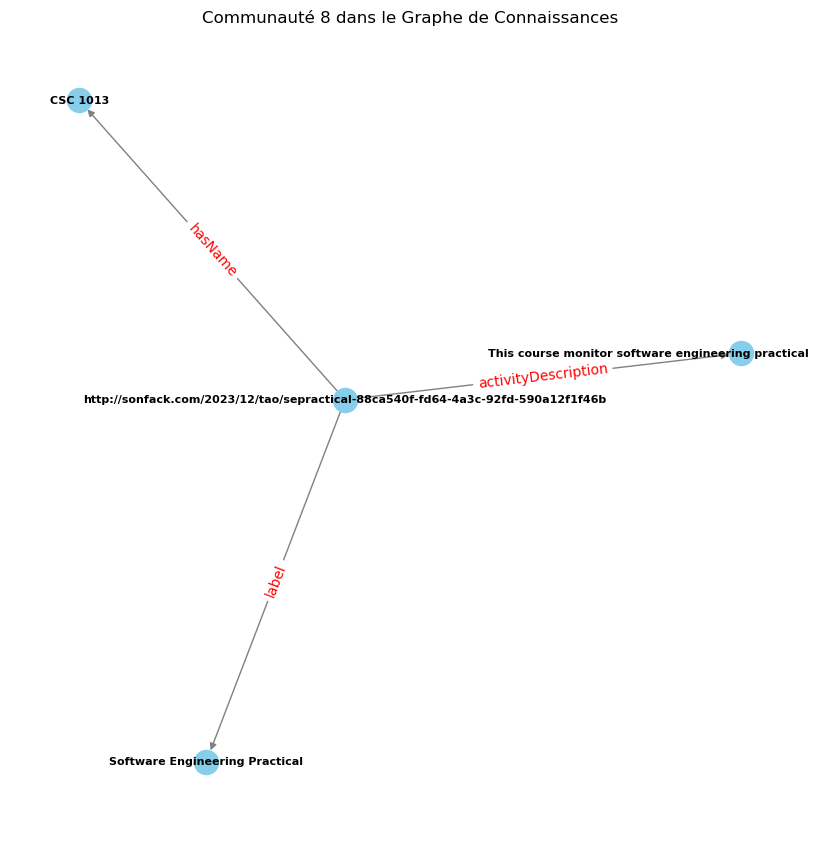

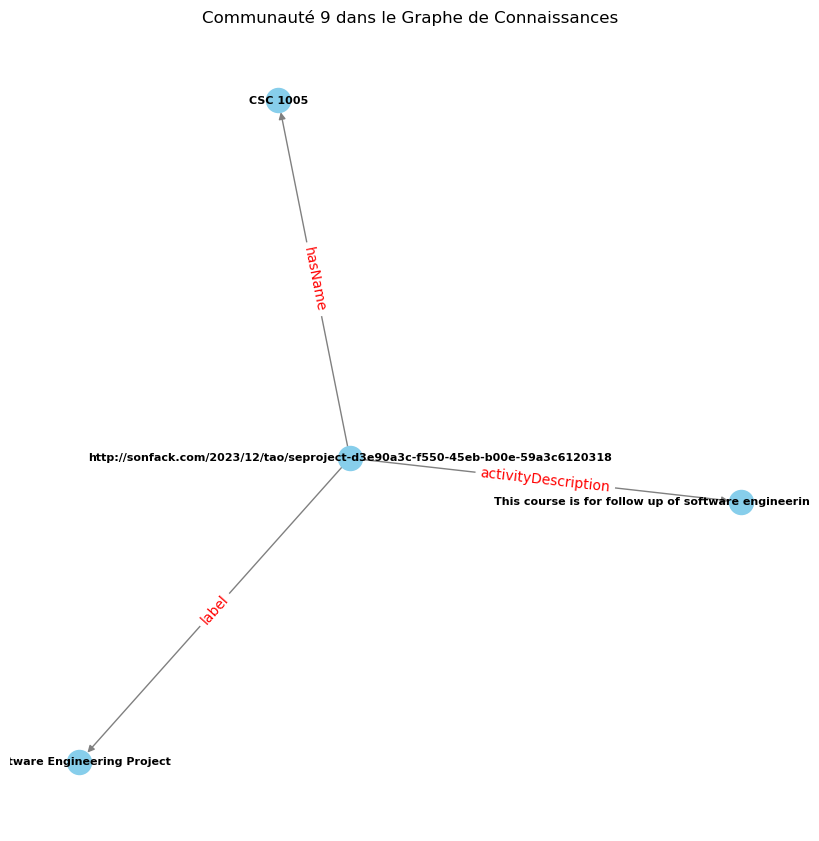

In [46]:
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms import community

def visualize_individual_communities(G, partition):
    """Visualiser chaque communauté du graphe de connaissances séparément."""
    communities = {}
    for node, community_id in partition.items():
        if community_id not in communities:
            communities[community_id] = []
        communities[community_id].append(node)

    for community_id, nodes in communities.items():
        subgraph = G.subgraph(nodes)
        plt.figure(figsize=(8, 8))
        pos = nx.spring_layout(subgraph, seed=42)
        nx.draw(subgraph, pos, with_labels=True, node_size=300, node_color="skyblue", font_size=8, font_weight="bold", edge_color="gray")
        edge_labels = nx.get_edge_attributes(subgraph, 'label')
        nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels, font_color='red', font_size=10)
        plt.title(f"Communauté {community_id} dans le Graphe de Connaissances")
        plt.show()

# Charger le fichier RDF dans un graphe NetworkX
G = nx.DiGraph()

# Lire toutes les activités
liste_activity = read_all_activities(graph, as_str=True)

# Ajouter chaque activité au graphe
for activity in liste_activity:
    subj = activity.split('/')[-1]
    info_activity = read_akg_node(subj, graph, as_str=True)
    add_activity_to_nxgraph(G, activity, info_activity)

# Détection des communautés avec networkx
partition = community.greedy_modularity_communities(G.to_undirected())

# Convertir le résultat en un format compatible avec visualize_individual_communities
partition_dict = {}
for i, comm in enumerate(partition):
    for node in comm:
        partition_dict[node] = i

# Visualiser chaque communauté séparément
visualize_individual_communities(G, partition_dict)


http://sonfack.com/2023/12/tao/CSC 1002 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/DataBase Course does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This course introduces the database concept to level 1 student does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/CSC 1022 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/DataBase Tutorial does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/This tutorial answers database question to level 1 student does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/CSC 1001 does not look like a valid URI, trying to serialize this will break.
http://sonfack.com/2023/12/tao/Python Course does not look like a valid URI, trying to serialize this will break.
htt

Nombre de communautés détectées : 7


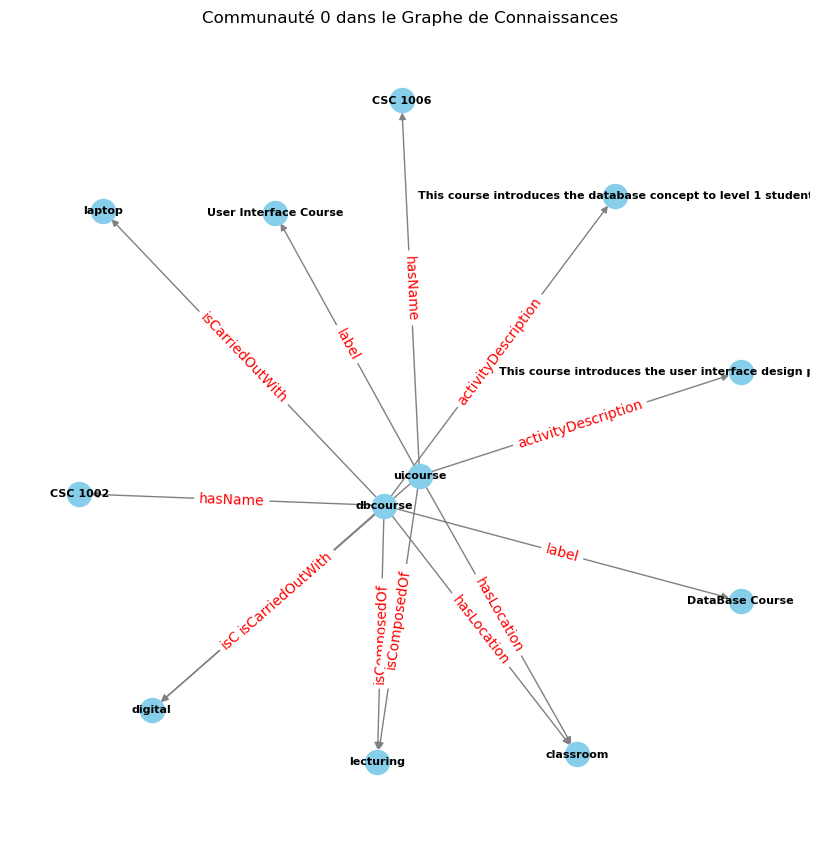

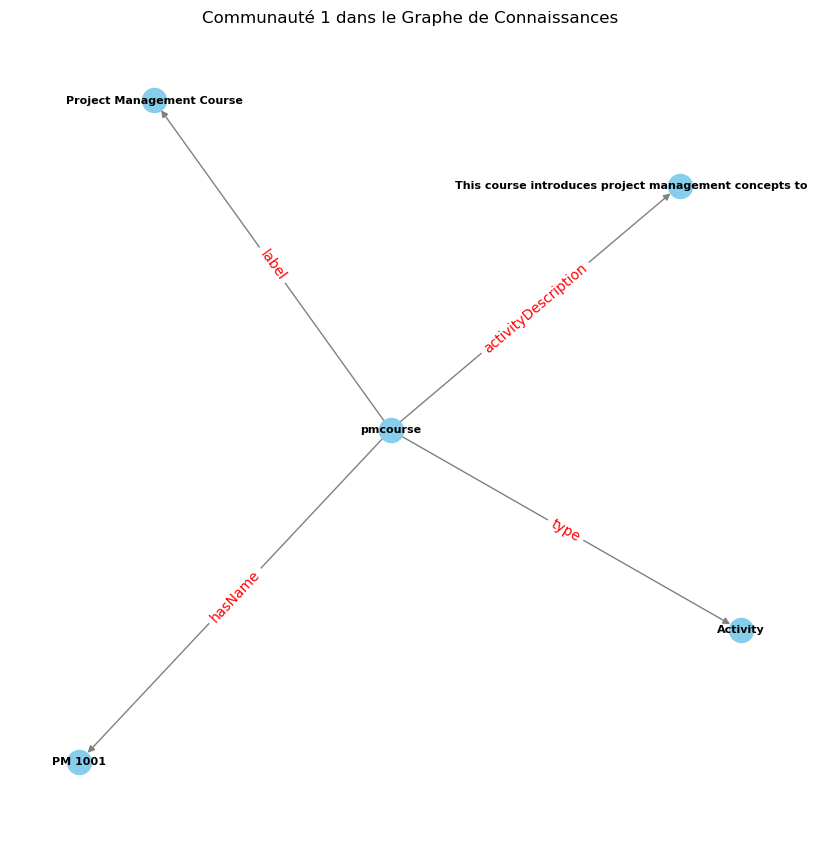

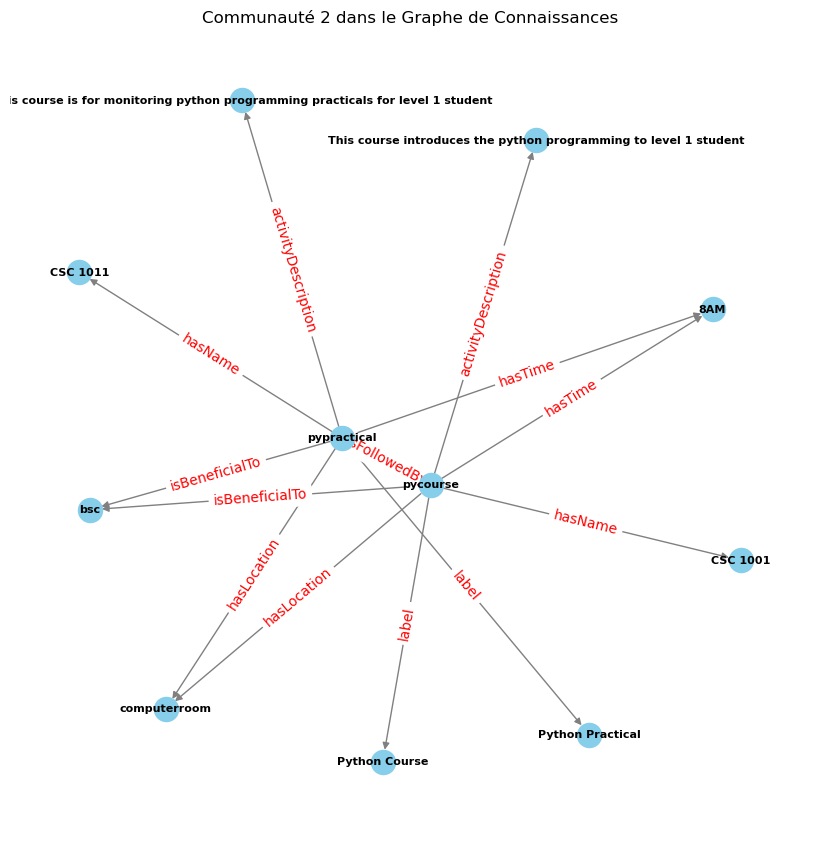

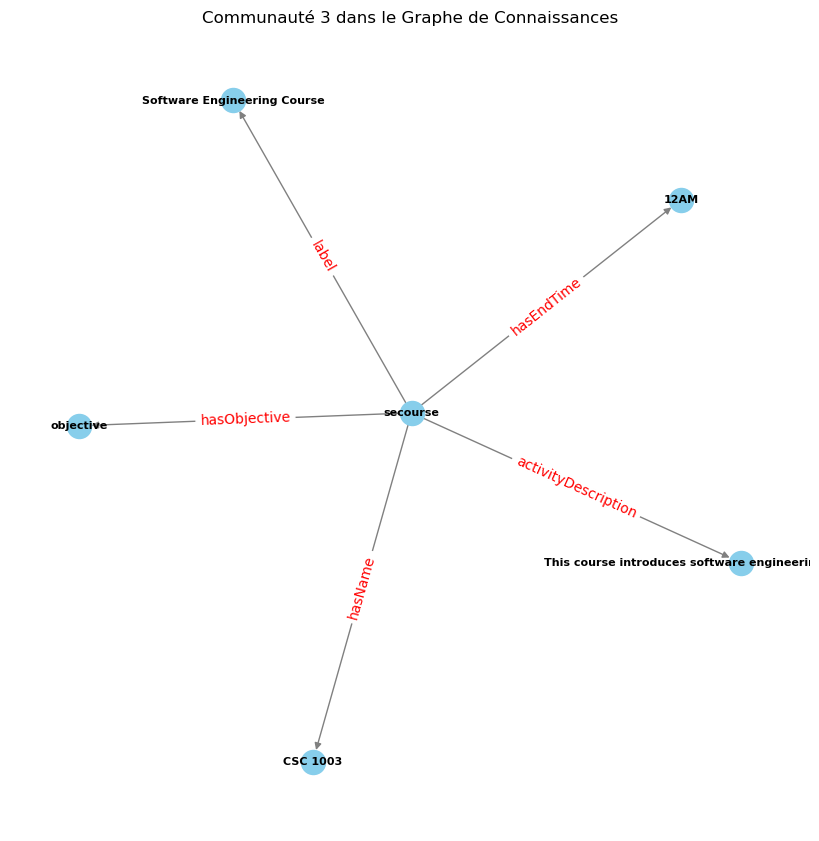

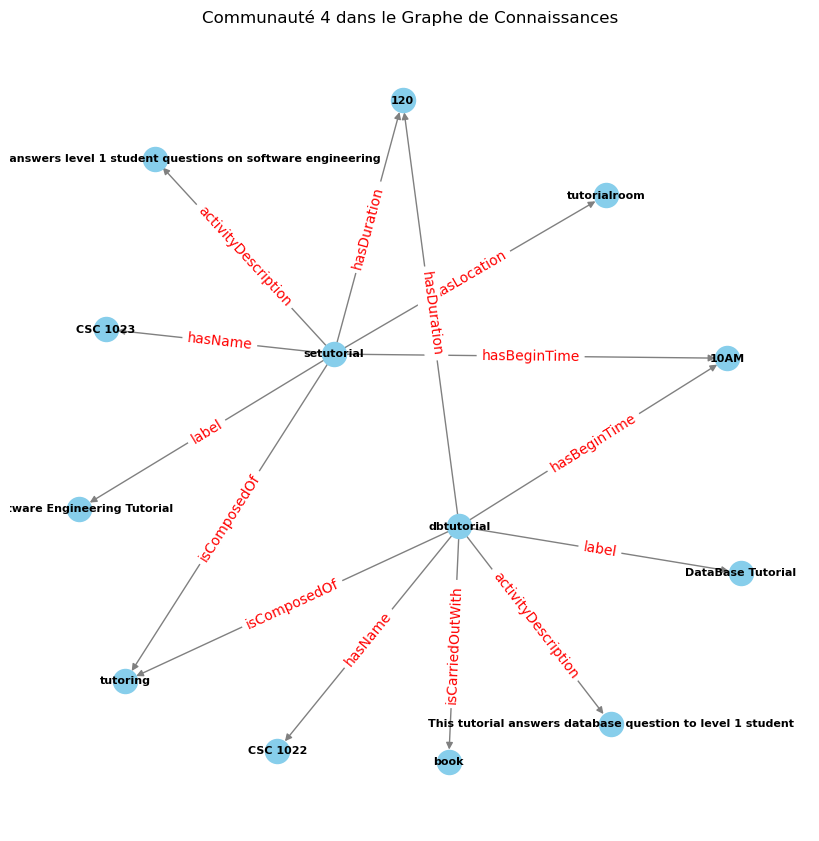

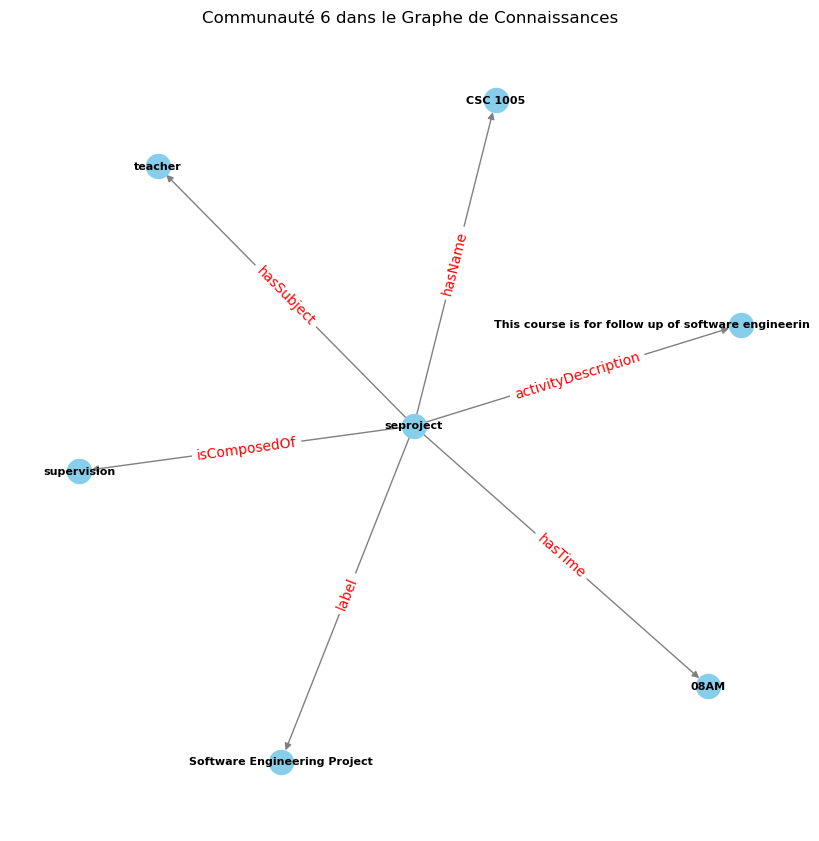

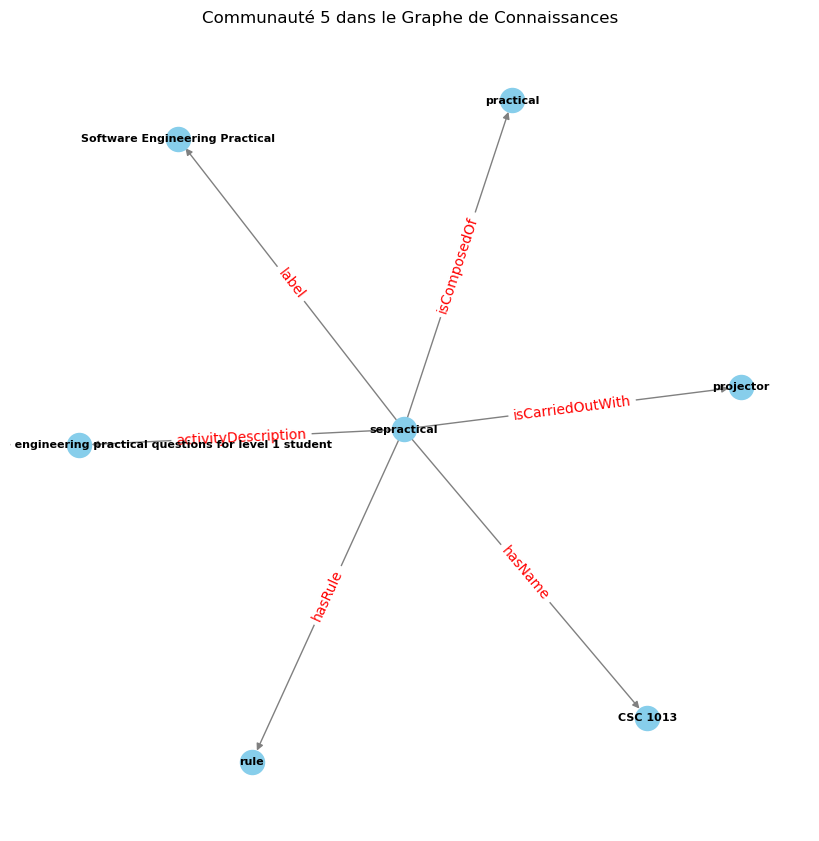

In [48]:
from rdflib import Graph, RDF, URIRef, Namespace
import networkx as nx
import matplotlib.pyplot as plt
import community.community_louvain as community_louvain  # Correct import

# Charger les données RDF
graph = Graph()
graph.parse("teaching_akg.ttl", format="ttl")

# Définir les espaces de noms
TAO = Namespace("http://sonfack.com/2024/01/tao#")  # Remplacez par votre espace de nom réel
akg_namespace = Namespace("http://sonfack.com/2023/12/tao/")
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")

def read_all_activities(akg: Graph, as_str=True) -> list:
    """Retourne toutes les activités d'un graphe de connaissances."""
    activities_list = [str(activity) if as_str else activity for activity in akg.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)]
    return activities_list

def read_akg_node(node_uri: str, akg: Graph, as_str=True) -> dict:
    """Retourne tous les éléments directement liés à un nœud du graphe."""
    activity_info = {}
    activity_uri_ref = f"{akg_namespace}{node_uri}"
    for act_predicate, act_object in akg.predicate_objects(subject=URIRef(activity_uri_ref)):
        pred = act_predicate
        obj = act_object
        if as_str:
            pred = str(act_predicate)
            obj = str(act_object)
        if pred in activity_info:
            existing_objects = activity_info[pred] + [obj]
            activity_info[pred] = existing_objects
        else:
            activity_info[pred] = [obj]
    return activity_info

def get_clean_name(uri):
    """Nettoie l'URI pour ne garder que la partie nom sans l'URI et sans l'ID éventuel."""
    return uri.split('/')[-1].split('-')[0]

def add_activity_to_nxgraph(G, activity_uri, activity_info):
    """Ajoute les activités et leurs relations au graphe NetworkX."""
    # Essayer de récupérer le nom (hasName)
    has_name = activity_info.get('http://sonfack.com/2023/12/tao/hasName', [None])[0]
    if has_name:
        central_node = get_clean_name(has_name)  # Utiliser le nom nettoyé
    else:
        central_node = get_clean_name(activity_uri)  # Utiliser l'URI nettoyée si hasName n'existe pas

    for pred, obj_list in activity_info.items():
        pred_label = pred.split('/')[-1]
        if '#' in pred_label:
            pred_label = pred_label.split('#')[1]

        for obj in obj_list:
            obj_label = get_clean_name(obj)  # Nettoyer également les objets
            node_info = read_akg_node(obj_label, graph)

            if node_info:
                obj_label = node_info.get('http://sonfack.com/2023/12/tao/hasName', [None])[0]
                if obj_label is None:
                    continue
                obj_label = get_clean_name(obj_label)

            G.add_node(central_node)
            G.add_node(obj_label)
            G.add_edge(central_node, obj_label, label=pred_label)

def visualize_individual_communities(G, partition):
    """Visualiser chaque communauté du graphe de connaissances séparément."""
    communities = {}
    for node, community_id in partition.items():
        if community_id not in communities:
            communities[community_id] = []
        communities[community_id].append(node)

    # Afficher le nombre de communautés détectées
    num_communities = len(communities)
    print(f"Nombre de communautés détectées : {num_communities}")

    for community_id, nodes in communities.items():
        subgraph = G.subgraph(nodes)
        plt.figure(figsize=(8, 8))
        pos = nx.spring_layout(subgraph, seed=42)

        # Utiliser des labels pour les nœuds
        node_labels = {node: node for node in subgraph.nodes()}
        nx.draw(subgraph, pos, labels=node_labels, with_labels=True, node_size=300, node_color="skyblue", font_size=8, font_weight="bold", edge_color="gray")

        # Ajouter des étiquettes pour les arêtes
        edge_labels = nx.get_edge_attributes(subgraph, 'label')
        nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels, font_color='red', font_size=10)

        # Afficher le titre
        plt.title(f"Communauté {community_id} dans le Graphe de Connaissances")
        plt.show()

# Charger le fichier RDF dans un graphe NetworkX
G = nx.DiGraph()

# Lire toutes les activités
liste_activity = read_all_activities(graph, as_str=True)

# Ajouter chaque activité au graphe
for activity in liste_activity:
    subj = activity.split('/')[-1]
    info_activity = read_akg_node(subj, graph, as_str=True)
    add_activity_to_nxgraph(G, activity, info_activity)

# Détection des communautés
partition = community_louvain.best_partition(G.to_undirected())

# Visualiser chaque communauté séparément et afficher le nombre de communautés
visualize_individual_communities(G, partition)


/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:457: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


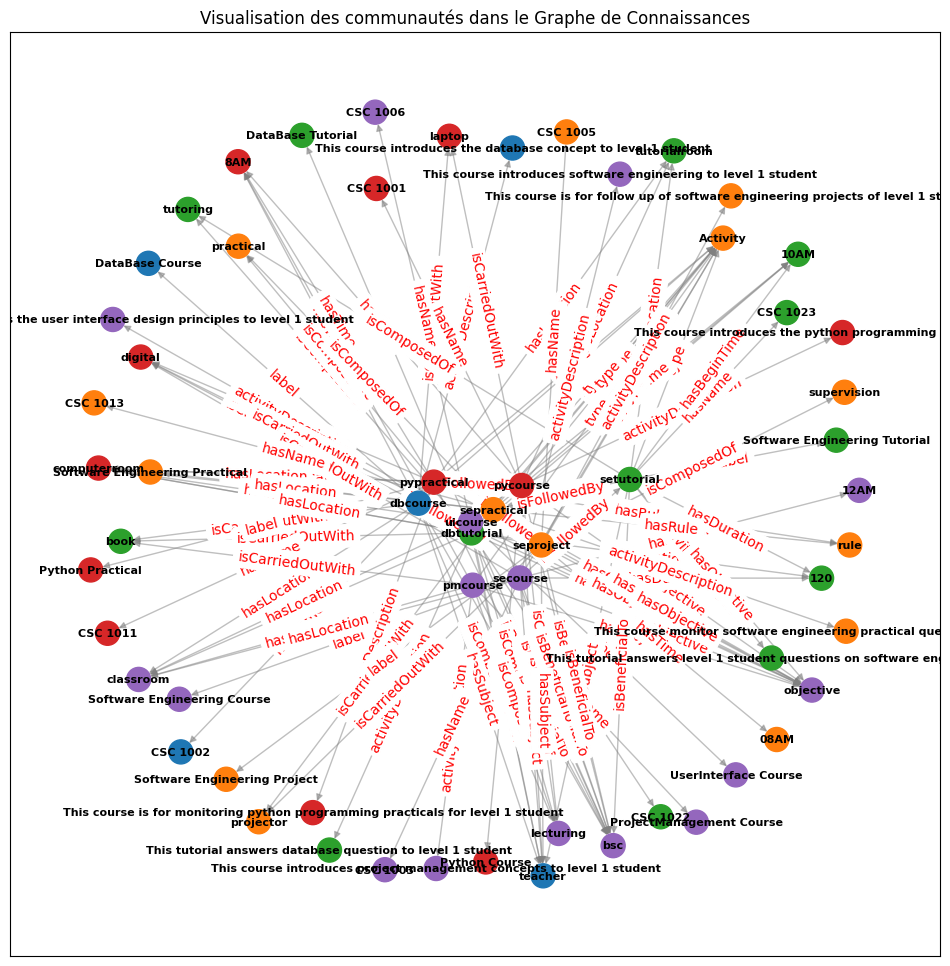

In [ ]:
def visualize_graph_with_communities(G, partition):
    """Visualiser tout le graphe avec les communautés détectées."""
    plt.figure(figsize=(12, 12))

    # Utiliser une palette de couleurs pour les différentes communautés
    community_colors = [f"C{community_id % 10}" for community_id in partition.values()]

    # Positionner les nœuds
    pos = nx.spring_layout(G, seed=42)  # Utiliser le même layout pour avoir une cohérence visuelle

    # Dessiner les nœuds avec les couleurs de la communauté
    nx.draw_networkx_nodes(G, pos, node_color=community_colors, node_size=300, cmap=plt.cm.Set1)

    # Dessiner les arêtes
    nx.draw_networkx_edges(G, pos, edge_color="gray", alpha=0.5)

    # Afficher les labels des nœuds
    node_labels = {node: node for node in G.nodes()}
    nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8, font_weight="bold", font_color="black")

    # Afficher les labels des arêtes
    edge_labels = nx.get_edge_attributes(G, 'label')
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red', font_size=10)

    plt.title("Visualisation des communautés dans le Graphe de Connaissances")
    plt.show()

# Visualiser le graphe entier avec les communautés et les relations entre elles
visualize_graph_with_communities(G, partition)


D:\anacondao\Lib\site-packages\networkx\drawing\nx_pylab.py:450: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


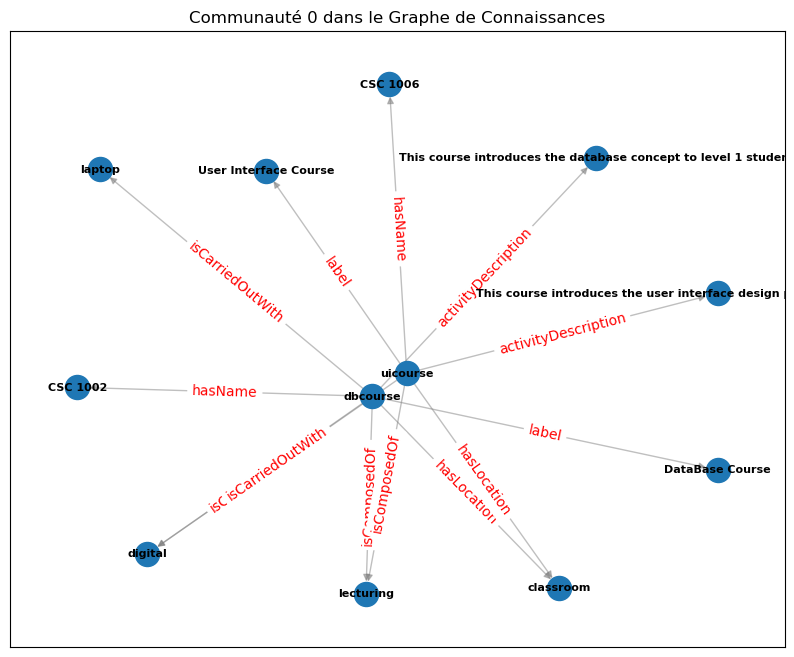

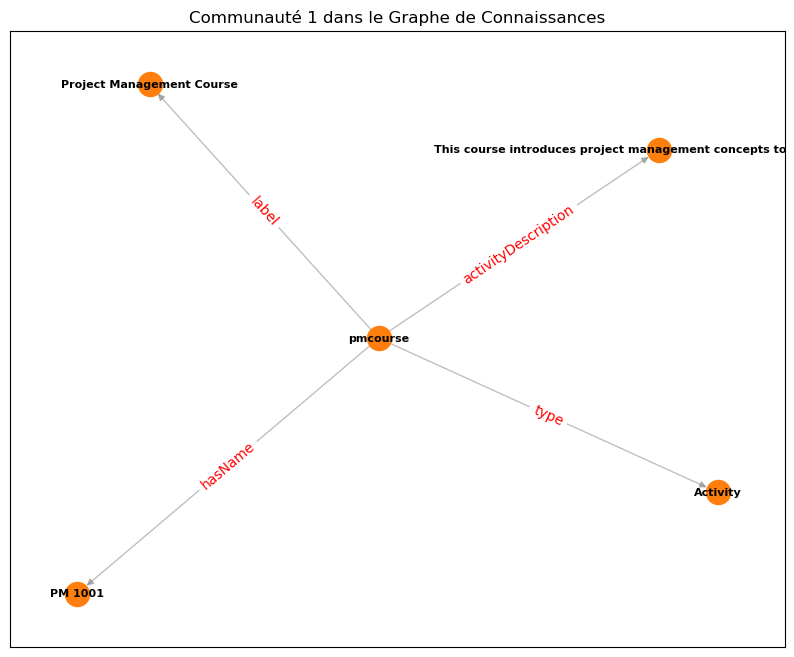

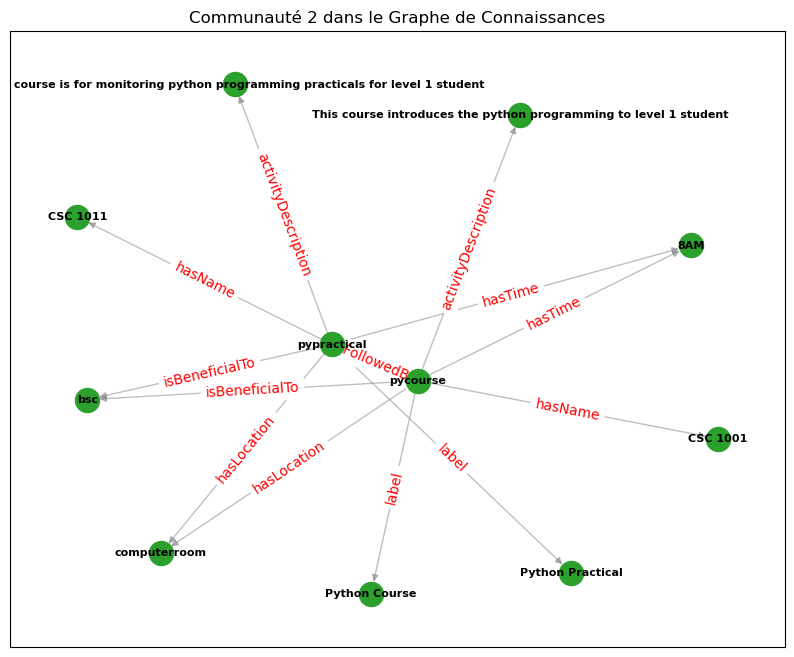

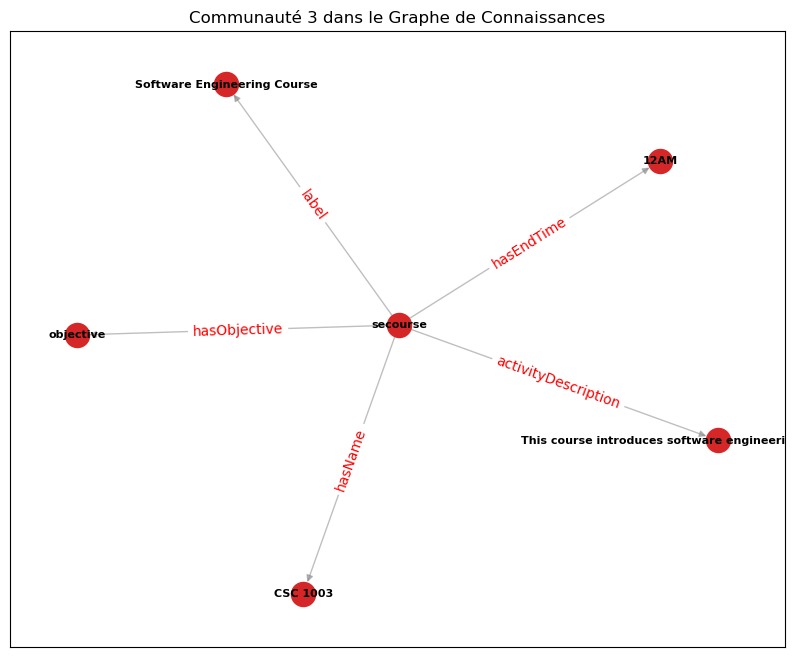

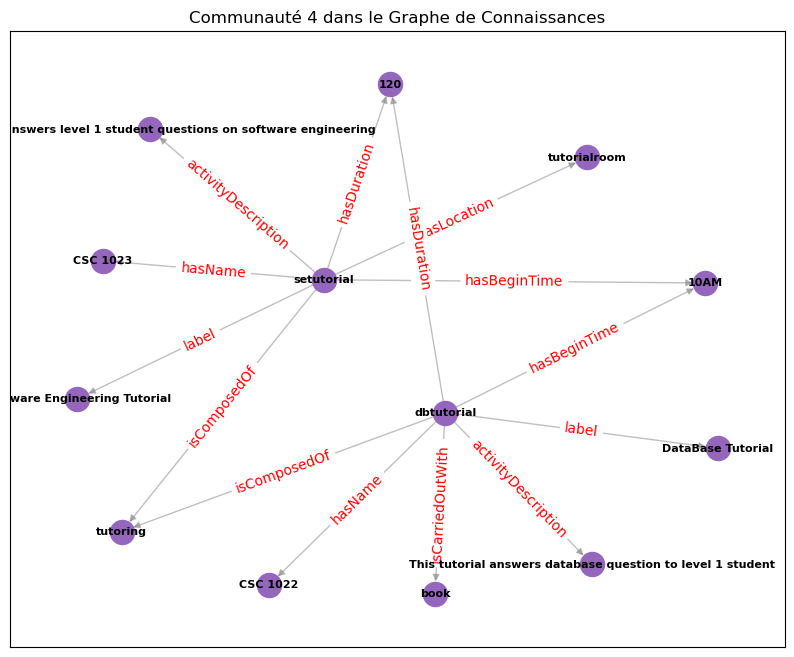

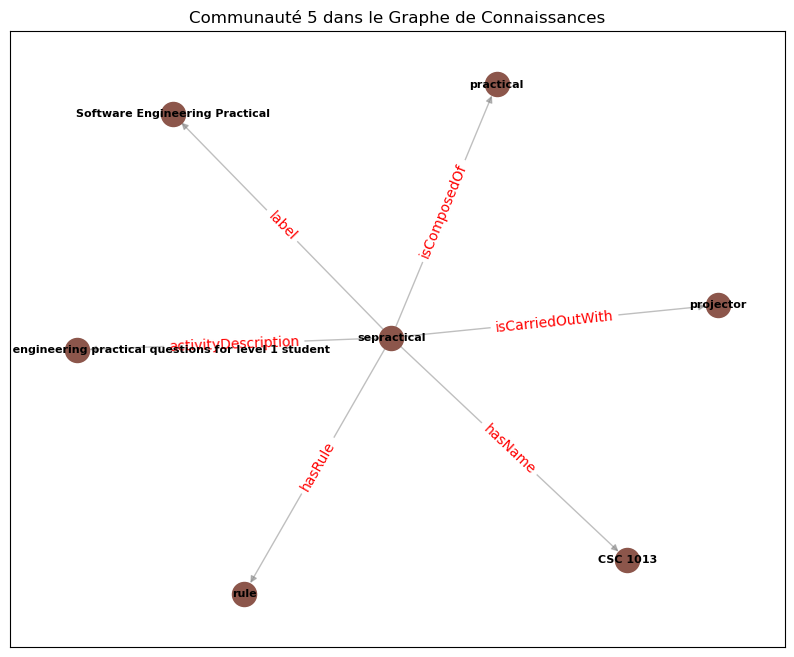

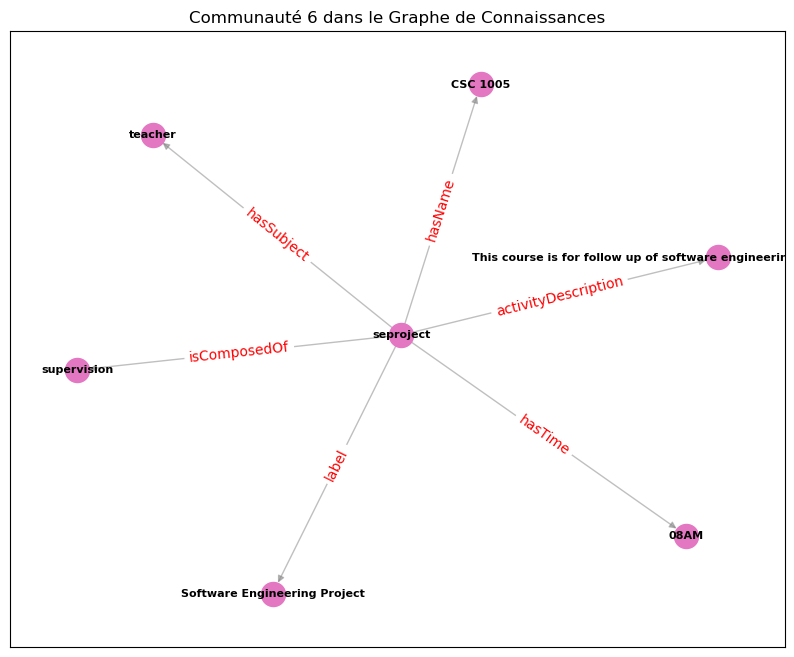

In [50]:
import matplotlib.pyplot as plt
import networkx as nx

def visualize_communities_separately(G, partition):
    """Visualiser chaque communauté séparément avec une couleur distincte."""

    # Obtenir les communautés uniques
    communities = set(partition.values())

    for community_id in communities:
        # Créer un sous-graphe pour la communauté actuelle
        subgraph_nodes = [node for node, comm in partition.items() if comm == community_id]
        H = G.subgraph(subgraph_nodes)

        # Positionner les nœuds
        pos = nx.spring_layout(H, seed=42)

        plt.figure(figsize=(10, 8))

        # Dessiner les nœuds avec une couleur spécifique à la communauté
        nx.draw_networkx_nodes(H, pos, node_color=f"C{community_id % 10}", node_size=300, cmap=plt.cm.Set1)

        # Dessiner les arêtes
        nx.draw_networkx_edges(H, pos, edge_color="gray", alpha=0.5)

        # Afficher les labels des nœuds
        node_labels = {node: node for node in H.nodes()}
        nx.draw_networkx_labels(H, pos, labels=node_labels, font_size=8, font_weight="bold", font_color="black")

        # Afficher les labels des arêtes
        edge_labels = nx.get_edge_attributes(H, 'label')
        nx.draw_networkx_edge_labels(H, pos, edge_labels=edge_labels, font_color='red', font_size=10)

        plt.title(f"Communauté {community_id} dans le Graphe de Connaissances")
        plt.show()

# Visualiser chaque communauté séparément
visualize_communities_separately(G, partition)


In [ ]:
# Charger le fichier RDF dans un graphe NetworkX
G = nx.DiGraph()

# Lire toutes les activités
liste_activity = read_all_activities(graph, as_str=True)

# Afficher le nombre total d'activités extraites
print(f"Nombre total d'activités extraites : {len(liste_activity)}")

# Ajouter chaque activité au graphe
for activity in liste_activity:
    subj = activity.split('/')[-1]
    info_activity = read_akg_node(subj, graph, as_str=True)
    add_activity_to_nxgraph(G, activity, info_activity)

# Détection des communautés
partition = community_louvain.best_partition(G.to_undirected())

# Afficher le nombre total de communautés détectées
num_communities = len(set(partition.values()))
print(f"Nombre total de communautés détectées : {num_communities}")




Nombre total d'activités extraites : 10
Nombre total de communautés détectées : 6


lister les activités

In [54]:
from rdflib import Graph, RDF, Namespace

# Assurez-vous d'avoir défini les namespaces appropriés
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")

def get_all_activities(akg: Graph) -> list:
    """Retourne une liste de toutes les activités dans le graphe RDF."""
    activities = [str(activity) for activity in akg.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)]
    return activities


activities = get_all_activities(graph)
print("Liste de toutes les activités :")
for activity in all_activities:
    subj = activity.split('/')[-1]
    info_activity = read_akg_node(subj, graph, as_str=True)
    add_activity_to_nxgraph(G, activity, info_activity)
    print(activity)


Liste de toutes les activités :


NameError: name 'all_activities' is not defined

In [ ]:
from rdflib import Graph, RDF, Namespace
import re

# Assurez-vous d'avoir défini les namespaces appropriés
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")

def get_all_activities(akg: Graph) -> list:
    """Retourne une liste de toutes les activités dans le graphe RDF."""
    activities = [str(activity) for activity in akg.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)]
    return activities

def extract_name_without_identifiers(uri: str, namespace: str) -> str:
    """Extrait le nom de l'activité sans les identifiants de l'URI après le namespace."""
    match = re.match(f"{re.escape(namespace)}(.+?)(?:[-_].*)?$", uri)
    if match:
        name_without_identifiers = match.group(1).replace('-', ' ').replace('_', ' ').title()
        return name_without_identifiers
    return uri

# Exemple d'utilisation
graph = Graph()  # Assurez-vous de charger ou initialiser le graphe RDF correctement
graph.parse("/content/drive/MyDrive/teaching_akg.ttl", format="ttl")

# Récupérer et afficher les noms des activités
all_activities = get_all_activities(graph)
print("Liste de toutes les activités :")
for activity in all_activities:
    activity_name = extract_name_without_identifiers(activity, "http://sonfack.com/2023/12/tao/")
    print(activity_name)


Liste de toutes les activités :
Dbcourse
Dbtutorial
Pycourse
Pypractical
Uicourse
Pmcourse
Secourse
Setutorial
Sepractical
Seproject


détailles sur l'activités

In [56]:
from rdflib import Graph, RDF, Namespace
import re

# Assurez-vous d'avoir défini les namespaces appropriés
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")

def get_all_activities(akg: Graph) -> list:
    """Retourne une liste de toutes les activités dans le graphe RDF."""
    activities = [str(activity) for activity in akg.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)]
    return activities

def extract_name_without_identifiers(uri: str, namespace: str) -> str:
    """Extrait le nom de l'activité sans les identifiants de l'URI après le namespace."""
    match = re.match(f"{re.escape(namespace)}(.+?)(?:[-_].*)?$", uri)
    if match:
        name_without_identifiers = match.group(1).replace('-', ' ').replace('_', ' ').title()
        return name_without_identifiers
    return uri

def get_activity_details(graph: Graph, activity_uri: str) -> dict:
    """Retourne les détails d'une activité spécifique en fonction de son URI complète."""
    details = {}
    for subj, pred, obj in graph:
        if str(subj) == activity_uri or str(obj) == activity_uri:
            subj_label = extract_name_without_identifiers(str(subj), "http://sonfack.com/2023/12/tao/")
            pred_label = pred.split('#')[-1]  # Extrait la partie du prédicat après le '#'
            obj_label = extract_name_without_identifiers(str(obj), "http://sonfack.com/2023/12/tao/")

            if subj_label not in details:
                details[subj_label] = []

            # Ajouter les détails comme tuple (prédicat, objet)
            details[subj_label].append((pred_label, obj_label))
    return details




filtrage

In [58]:


# Récupérer et afficher les noms des activités
all_activities = get_all_activities(graph)
print("Liste de toutes les activités :")
for activity in all_activities:
    activity_name = extract_name_without_identifiers(activity, "http://sonfack.com/2023/12/tao/")
    print(f"Nom de l'activité: {activity_name}")

    # Obtenir les détails de l'activité
    activity_details = get_activity_details(graph, activity)

    # Afficher les détails de l'activité
    print("Détails de l'activité :")
    for subj, details in activity_details.items():
        print(f"  Activité: {subj}")
        for pred, obj in details:
            print(f"    {pred}: {obj}")
    print("\n")

Liste de toutes les activités :


In [ ]:
def filter_activities_by_property(akg: Graph, property_uri: str, value: str) -> list:
    """Retourne les activités qui ont une certaine propriété avec une certaine valeur."""
    activities = []
    for activity in akg.subjects(predicate=URIRef(property_uri), object=value):
        activities.append(str(activity))
    return activities

# Exemple d'utilisation
property_uri = "http://sonfack.com/2023/12/tao/hasName"  # URI de la propriété à filtrer
value = "SomeActivityName"  # Valeur à filtrer
filtered_activities = filter_activities_by_property(graph, property_uri, value)
print(f"Activités avec {property_uri} = {value} :")
for activity in filtered_activities:
    print(activity)


Activités avec http://sonfack.com/2023/12/tao/hasName = SomeActivityName :


In [60]:
# Imports nécessaires
from rdflib import Namespace, Graph, URIRef
from rdflib.namespace import RDF
import networkx as nx
import matplotlib.pyplot as plt
from community import community_louvain
import re

# Charger le fichier RDF et initialiser le graphe NetworkX
from google.colab import drive
drive.mount('/content/drive')

akg_file = "teaching_akg.ttl"  # Chemin du fichier TTL dans Google Drive

# Charger le fichier RDF et initialiser le graphe NetworkX
g = Graph()
g.parse(akg_file)
G = nx.Graph()

# Définir les namespaces
akg_namespace = Namespace("http://sonfack.com/2023/12/tao/")
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")

# Fonction pour extraire et nettoyer les noms des URI
def extract_name(uri):
    name = re.sub(r'http://sonfack\.com/2023/12/(tao|cao)/', '', uri)
    name = re.sub(r'-\w+$', '', name)
    return name

# Fonction pour lire toutes les activités
def read_all_activities(akg: Graph) -> list:
    return [activity for activity in akg.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)]

# Fonction pour obtenir les détails d'une activité spécifique
def get_activity_details(activity_uri: URIRef, akg: Graph) -> dict:
    details = {}
    for pred, obj in akg.predicate_objects(subject=activity_uri):
        if str(obj) == str(cao_namespace.Activity):  # Ignorer le type 'Activity'
            continue
        pred_label = extract_name(str(pred))
        obj_label = extract_name(str(obj))
        details.setdefault(pred_label, []).append(obj_label)
    return details

# Fonction pour ajouter les activités et leurs relations au graphe NetworkX
def add_activity_to_graph(G, activity_uri, akg, excluded_activity=None):
    details = get_activity_details(activity_uri, akg)
    activity_name = extract_name(str(activity_uri))

    for pred, objs in details.items():
        for obj in objs:
            obj_name = extract_name(str(obj))
            if obj_name != excluded_activity:
                G.add_node(activity_name, type="activité", color="orange")
                G.add_node(obj_name, type="ressource", color="blue")
                G.add_edge(activity_name, obj_name, label=pred)

# Fonction pour appliquer l'algorithme de Louvain et obtenir des partitions
def apply_louvain_clustering(G):
    partition = community_louvain.best_partition(G)
    return partition

# Visualisation du graphe de connaissances avec les communautés détectées
def visualize_louvain_graph(G, partition):
    pos = nx.spring_layout(G, seed=42, k=1.5, scale=2)  # Augmentation de la force d'espacement
    plt.figure(figsize=(14, 12))
    node_colors = ["orange" if G.nodes[node].get("type") == "activité" else "blue" for node in G]
    node_sizes = [1200 if G.nodes[node].get("type") == "activité" else 600 for node in G]
    nx.draw(G, pos, with_labels=True, labels={node: extract_name(node)[:15] + '...' for node in G.nodes()},
            node_size=node_sizes, node_color=node_colors, font_size=9)  # Limiter la longueur des labels
    edge_labels = nx.get_edge_attributes(G, 'label')
    simplified_edge_labels = {key: extract_name(label)[:10] + '...' for key, label in edge_labels.items()}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=simplified_edge_labels, font_color="red")
    plt.legend(handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='Activité', markersize=15, markerfacecolor='orange'),
        plt.Line2D([0], [0], marker='o', color='w', label='Ressource', markersize=15, markerfacecolor='blue')
    ], loc='upper right')
    plt.title("Graphe de connaissances avec détection des communautés (Algorithme de Louvain)")
    plt.show()

# Paramètres et visualisation
all_activities = read_all_activities(g)

# Visualisation des communautés
for activity_uri in all_activities:
    add_activity_to_graph(G, activity_uri, g)
partition = apply_louvain_clustering(G)
visualize_louvain_graph(G, partition)


ModuleNotFoundError: No module named 'google.colab'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Visualisation de la communauté 0 avec 11 nœuds


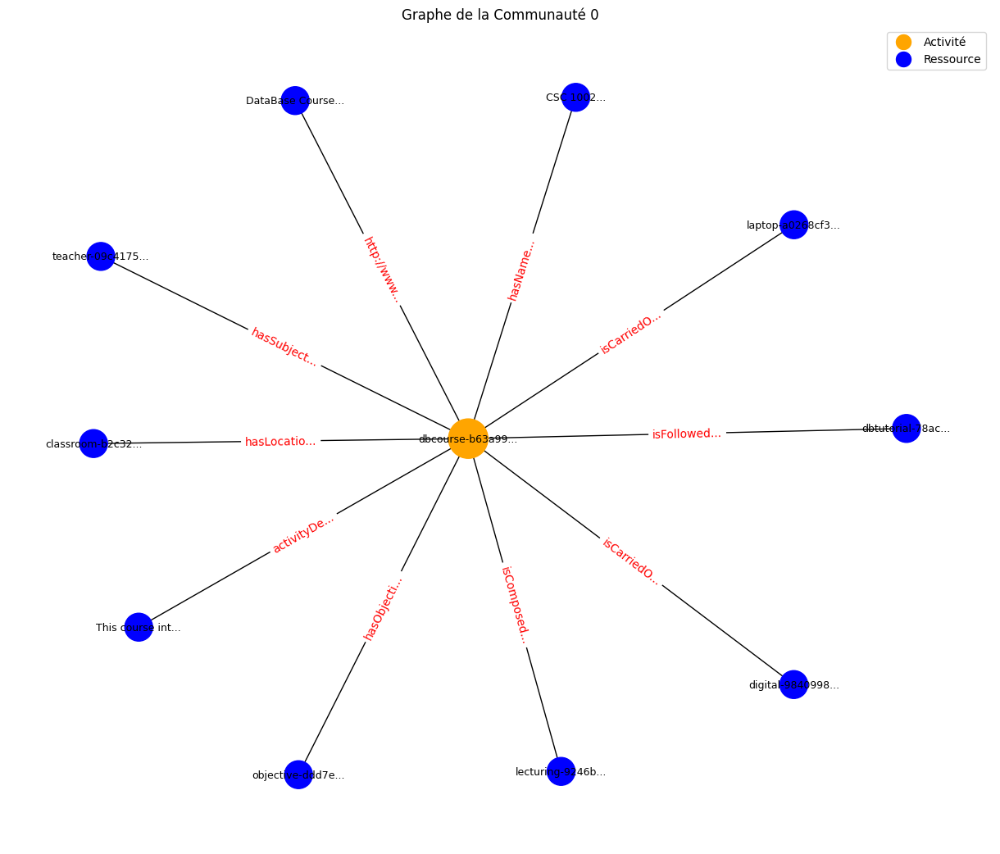

Visualisation de la communauté 1 avec 19 nœuds


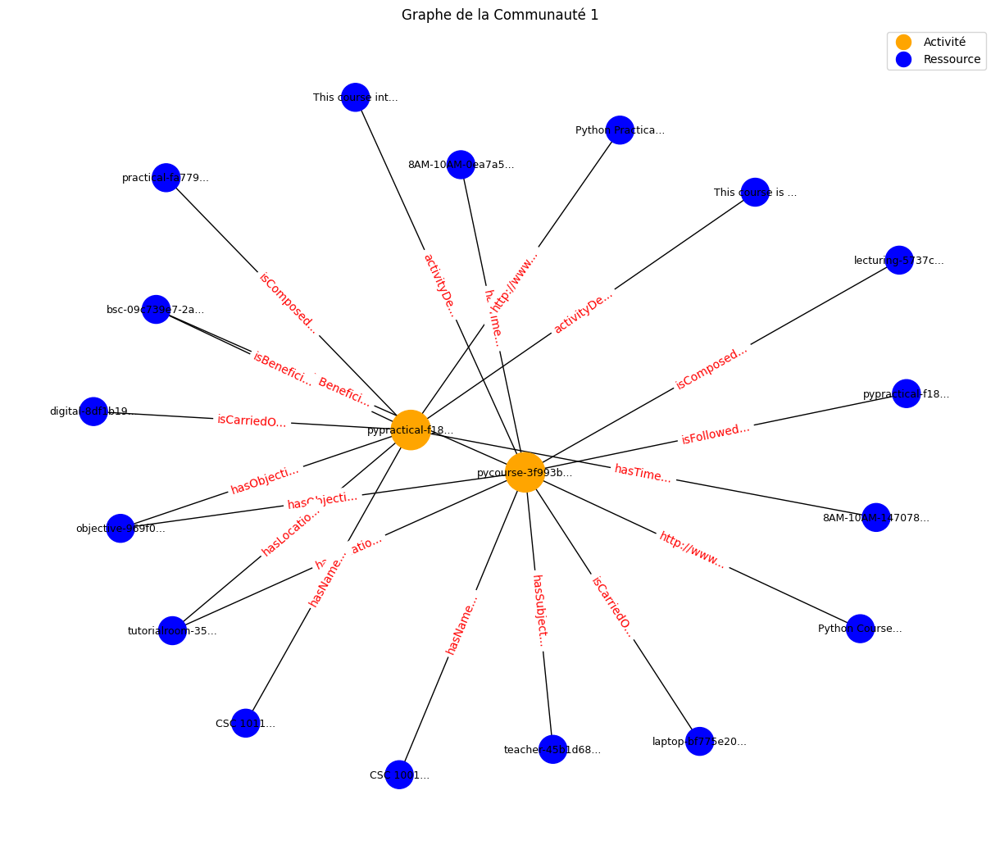

Visualisation de la communauté 2 avec 11 nœuds


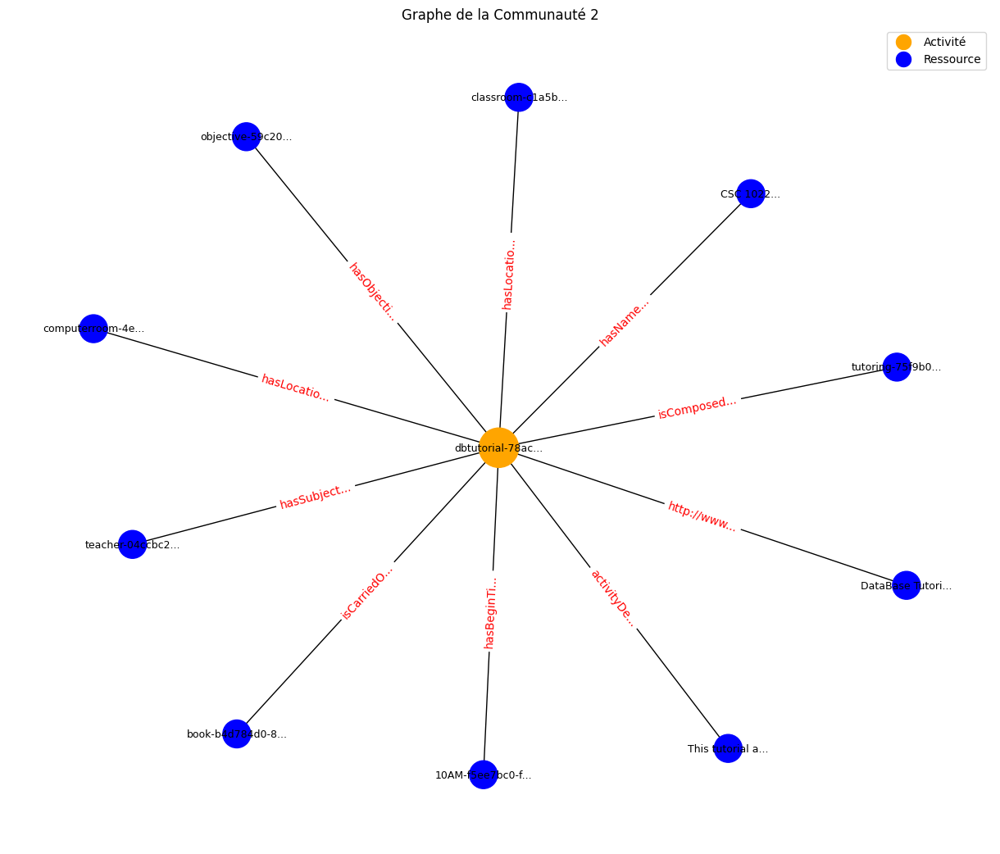

Visualisation de la communauté 3 avec 9 nœuds


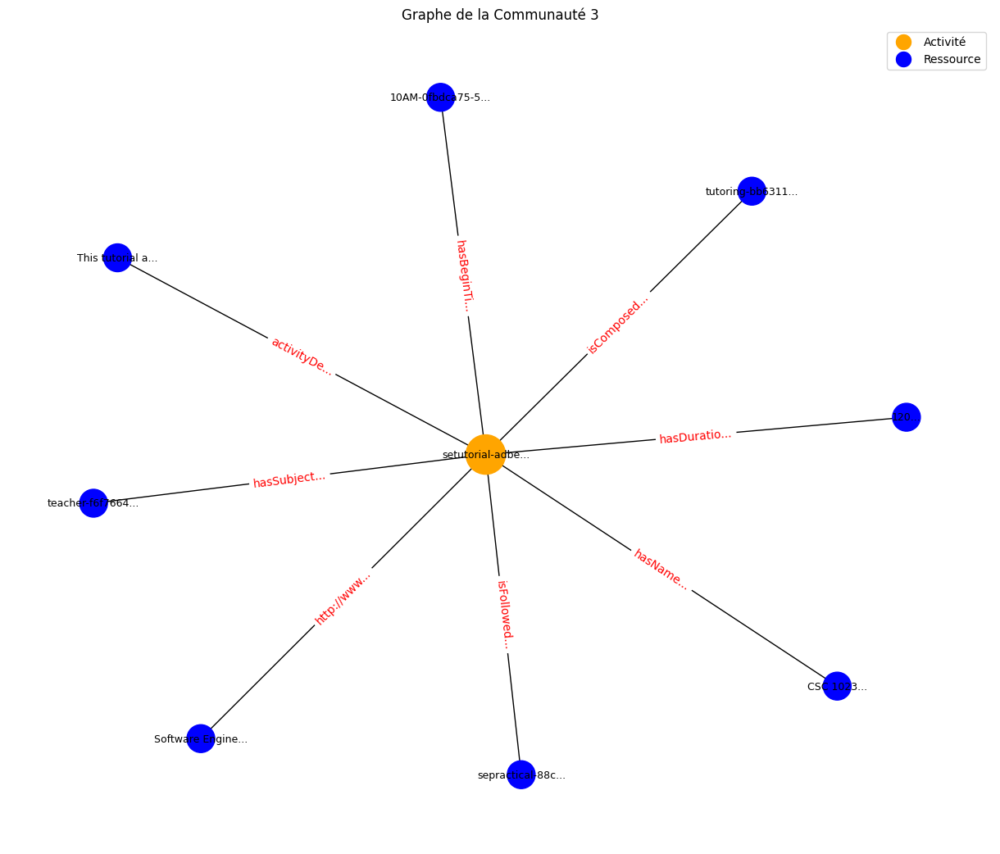

Visualisation de la communauté 5 avec 18 nœuds


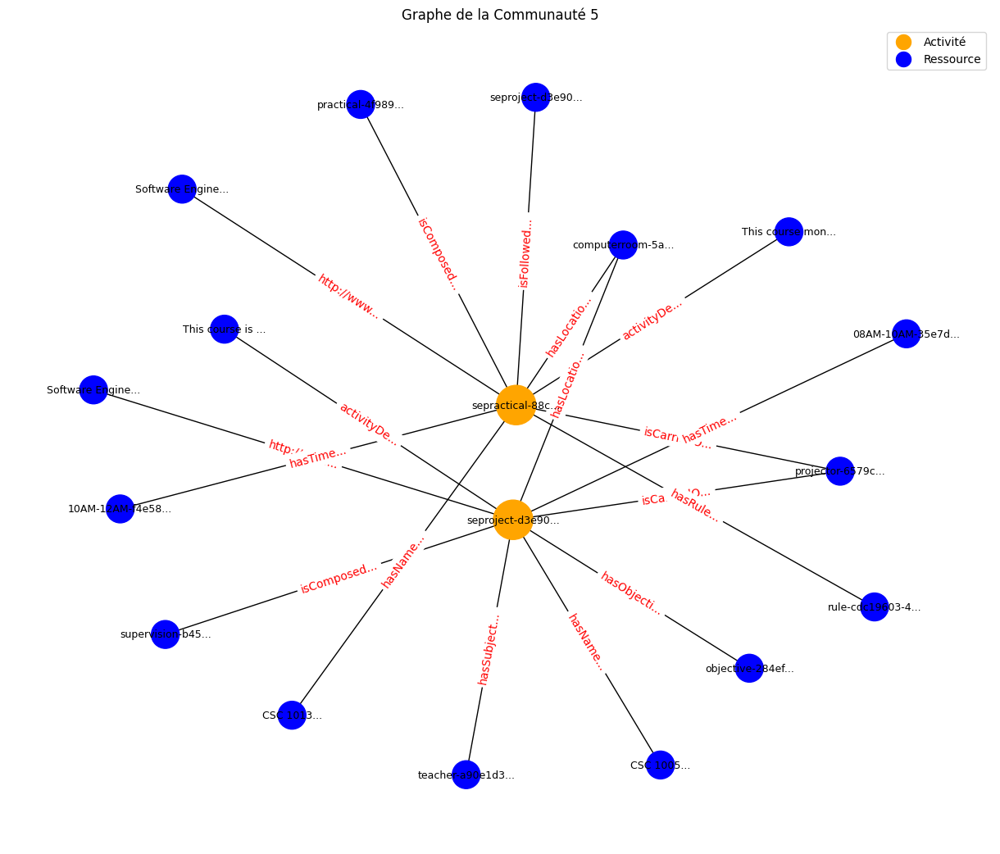

Visualisation de la communauté 7 avec 12 nœuds


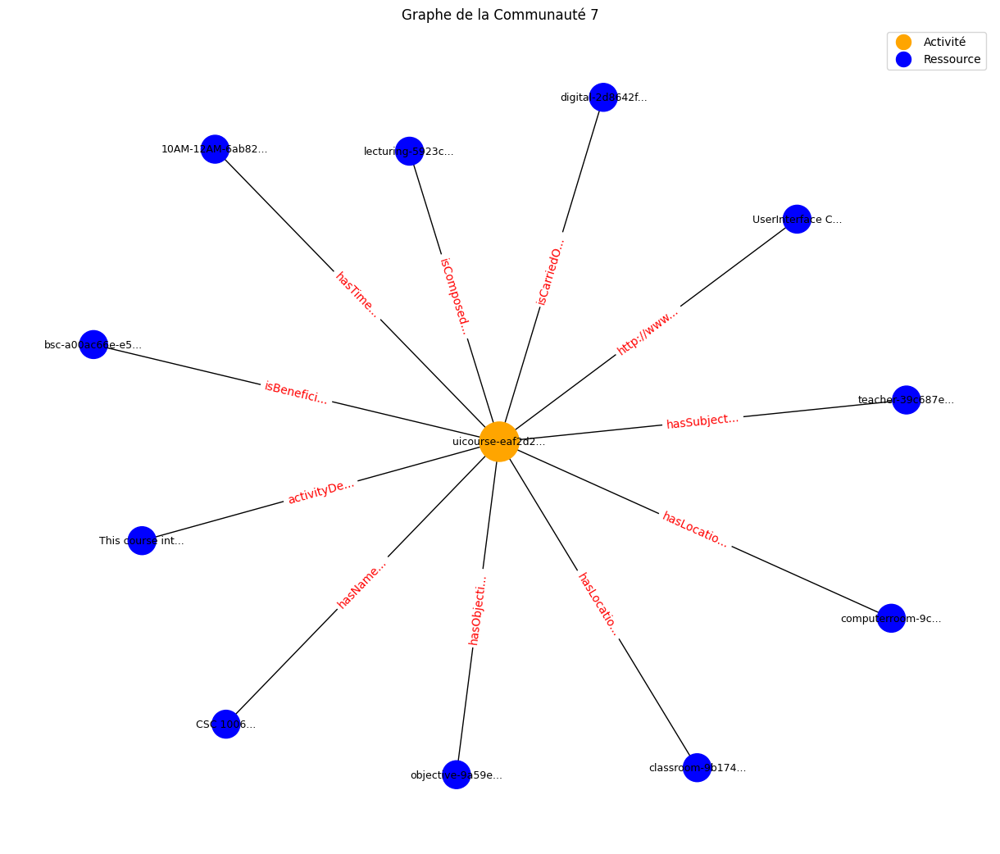

Visualisation de la communauté 4 avec 9 nœuds


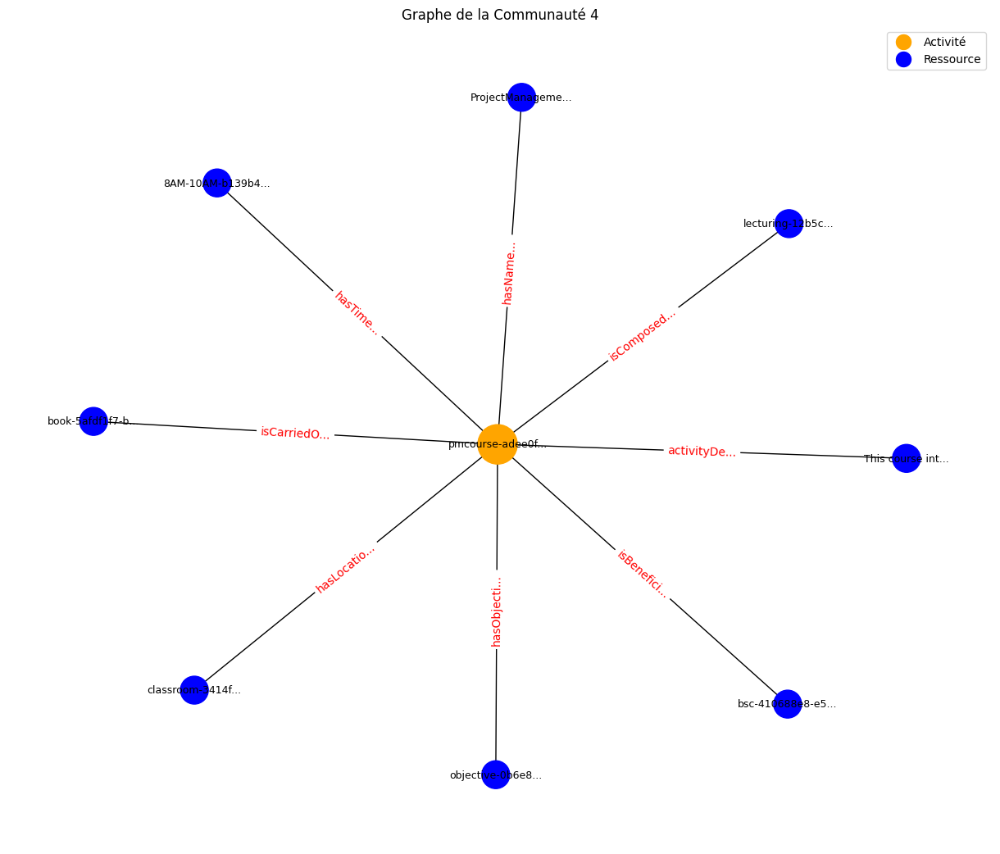

Visualisation de la communauté 6 avec 11 nœuds


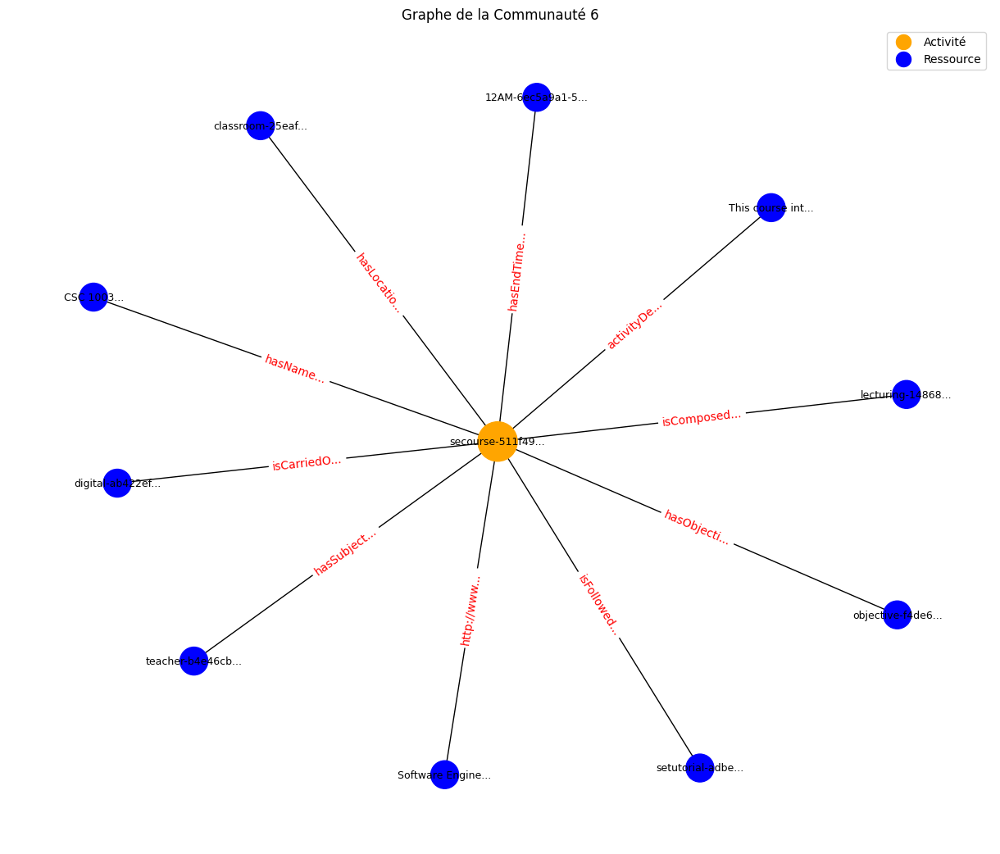

In [ ]:
# Imports nécessaires
from rdflib import Namespace, Graph, URIRef
from rdflib.namespace import RDF
import networkx as nx
import matplotlib.pyplot as plt
from community import community_louvain
import re

# Charger le fichier RDF et initialiser le graphe NetworkX
from google.colab import drive
drive.mount('/content/drive')

akg_file = "/content/drive/MyDrive/teaching_akg.ttl"  # Chemin du fichier TTL dans Google Drive

# Charger le fichier RDF et initialiser le graphe NetworkX
g = Graph()
g.parse(akg_file)
G = nx.Graph()

# Définir les namespaces
akg_namespace = Namespace("http://sonfack.com/2023/12/tao/")
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")

# Fonction pour extraire et nettoyer les noms des URI
def extract_name(uri):
    name = re.sub(r'http://sonfack\.com/2023/12/(tao|cao)/', '', uri)
    name = re.sub(r'-\w+$', '', name)
    return name

# Fonction pour lire toutes les activités
def read_all_activities(akg: Graph) -> list:
    return [activity for activity in akg.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)]

# Fonction pour obtenir les détails d'une activité spécifique
def get_activity_details(activity_uri: URIRef, akg: Graph) -> dict:
    details = {}
    for pred, obj in akg.predicate_objects(subject=activity_uri):
        if str(obj) == str(cao_namespace.Activity):  # Ignorer le type 'Activity'
            continue
        pred_label = extract_name(str(pred))
        obj_label = extract_name(str(obj))
        details.setdefault(pred_label, []).append(obj_label)
    return details

# Fonction pour ajouter les activités et leurs relations au graphe NetworkX
def add_activity_to_graph(G, activity_uri, akg, excluded_activity=None):
    details = get_activity_details(activity_uri, akg)
    activity_name = extract_name(str(activity_uri))

    for pred, objs in details.items():
        for obj in objs:
            obj_name = extract_name(str(obj))
            if obj_name != excluded_activity:
                G.add_node(activity_name, type="activité", color="orange")
                G.add_node(obj_name, type="ressource", color="blue")
                G.add_edge(activity_name, obj_name, label=pred)

# Fonction pour appliquer l'algorithme de Louvain et obtenir des partitions
def apply_louvain_clustering(G):
    partition = community_louvain.best_partition(G)
    return partition

# Visualisation d'un sous-graphe spécifique à une communauté
def visualize_community(G, community_nodes, community_id):
    subgraph = G.subgraph(community_nodes)
    pos = nx.spring_layout(subgraph, seed=42, k=1.5, scale=2)  # Augmentation de l'espacement
    plt.figure(figsize=(12, 10))
    node_colors = ["orange" if subgraph.nodes[node].get("type") == "activité" else "blue" for node in subgraph]
    node_sizes = [1200 if subgraph.nodes[node].get("type") == "activité" else 600 for node in subgraph]
    nx.draw(subgraph, pos, with_labels=True, labels={node: extract_name(node)[:15] + '...' for node in subgraph.nodes()},
            node_size=node_sizes, node_color=node_colors, font_size=9)
    edge_labels = nx.get_edge_attributes(subgraph, 'label')
    simplified_edge_labels = {key: extract_name(label)[:10] + '...' for key, label in edge_labels.items()}
    nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=simplified_edge_labels, font_color="red")
    plt.legend(handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='Activité', markersize=15, markerfacecolor='orange'),
        plt.Line2D([0], [0], marker='o', color='w', label='Ressource', markersize=15, markerfacecolor='blue')
    ], loc='upper right')
    plt.title(f"Graphe de la Communauté {community_id}")
    plt.show()

# Fonction principale pour visualiser chaque communauté séparément
def visualize_all_communities(G, partition):
    communities = {}
    for node, community_id in partition.items():
        communities.setdefault(community_id, []).append(node)

    for community_id, community_nodes in communities.items():
        print(f"Visualisation de la communauté {community_id} avec {len(community_nodes)} nœuds")
        visualize_community(G, community_nodes, community_id)

# Paramètres et visualisation
all_activities = read_all_activities(g)

# Construction du graphe complet
for activity_uri in all_activities:
    add_activity_to_graph(G, activity_uri, g)

# Application de l'algorithme de Louvain
partition = apply_louvain_clustering(G)

# Visualisation de chaque communauté séparément
visualize_all_communities(G, partition)


In [62]:
# Imports nécessaires
from rdflib import Namespace, Graph, URIRef
from rdflib.namespace import RDF
import networkx as nx
import matplotlib.pyplot as plt
from community import community_louvain
import re

# Charger le fichier RDF et initialiser le graphe NetworkX
from google.colab import drive
drive.mount('/content/drive')

akg_file = "teaching_akg.ttl"  # Chemin du fichier TTL dans Google Drive

# Charger le fichier RDF et initialiser le graphe NetworkX
g = Graph()
g.parse(akg_file)
G = nx.Graph()

# Définir les namespaces
akg_namespace = Namespace("http://sonfack.com/2023/12/tao/")
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")

# Fonction pour extraire et nettoyer les noms des URI
def extract_name(uri):
    name = re.sub(r'http://sonfack\.com/2023/12/(tao|cao)/', '', uri)
    name = re.sub(r'-\w+$', '', name)
    return name

# Fonction pour lire toutes les activités
def read_all_activities(akg: Graph) -> list:
    return [activity for activity in akg.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)]

# Fonction pour obtenir les détails d'une activité spécifique
def get_activity_details(activity_uri: URIRef, akg: Graph) -> dict:
    details = {}
    for pred, obj in akg.predicate_objects(subject=activity_uri):
        if str(obj) == str(cao_namespace.Activity):  # Ignorer le type 'Activity'
            continue
        pred_label = extract_name(str(pred))
        obj_label = extract_name(str(obj))
        details.setdefault(pred_label, []).append(obj_label)
    return details

# Fonction pour ajouter les objets (ressources) et leurs relations au graphe NetworkX
def add_object_to_graph(G, activity_uri, akg):
    details = get_activity_details(activity_uri, akg)

    for pred, objs in details.items():
        for obj in objs:
            obj_name = extract_name(str(obj))
            activity_name = extract_name(str(activity_uri))

            # Ajouter les nœuds et les arêtes en se basant sur les objets
            G.add_node(obj_name, type="ressource", color="blue")
            G.add_node(activity_name, type="activité", color="orange")
            G.add_edge(obj_name, activity_name, label=pred)

# Fonction pour appliquer l'algorithme de Louvain et obtenir des partitions
def apply_louvain_clustering(G):
    partition = community_louvain.best_partition(G)
    return partition

# Visualisation d'un sous-graphe spécifique à une communauté
def visualize_community(G, community_nodes, community_id):
    subgraph = G.subgraph(community_nodes)
    pos = nx.spring_layout(subgraph, seed=42, k=1.5, scale=2)  # Augmentation de l'espacement
    plt.figure(figsize=(12, 10))
    node_colors = ["orange" if subgraph.nodes[node].get("type") == "activité" else "blue" for node in subgraph]
    node_sizes = [1200 if subgraph.nodes[node].get("type") == "activité" else 600 for node in subgraph]
    nx.draw(subgraph, pos, with_labels=True, labels={node: extract_name(node)[:15] + '...' for node in subgraph.nodes()},
            node_size=node_sizes, node_color=node_colors, font_size=9)
    edge_labels = nx.get_edge_attributes(subgraph, 'label')
    simplified_edge_labels = {key: extract_name(label)[:10] + '...' for key, label in edge_labels.items()}
    nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=simplified_edge_labels, font_color="red")
    plt.legend(handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='Activité', markersize=15, markerfacecolor='orange'),
        plt.Line2D([0], [0], marker='o', color='w', label='Ressource', markersize=15, markerfacecolor='blue')
    ], loc='upper right')
    plt.title(f"Graphe de la Communauté {community_id} (basée sur les objets)")
    plt.show()

# Fonction principale pour visualiser chaque communauté séparément
def visualize_all_communities(G, partition):
    communities = {}
    for node, community_id in partition.items():
        communities.setdefault(community_id, []).append(node)

    for community_id, community_nodes in communities.items():
        print(f"Visualisation de la communauté {community_id} avec {len(community_nodes)} nœuds")
        visualize_community(G, community_nodes, community_id)

# Paramètres et visualisation
all_activities = read_all_activities(g)

# Construction du graphe complet en se concentrant sur les objets
for activity_uri in all_activities:
    add_object_to_graph(G, activity_uri, g)

# Application de l'algorithme de Louvain
partition = apply_louvain_clustering(G)

# Visualisation de chaque communauté séparément en fonction des objets
visualize_all_communities(G, partition)


ModuleNotFoundError: No module named 'google.colab'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

Visualisation de la communauté pour la propriété 'hasObjective'


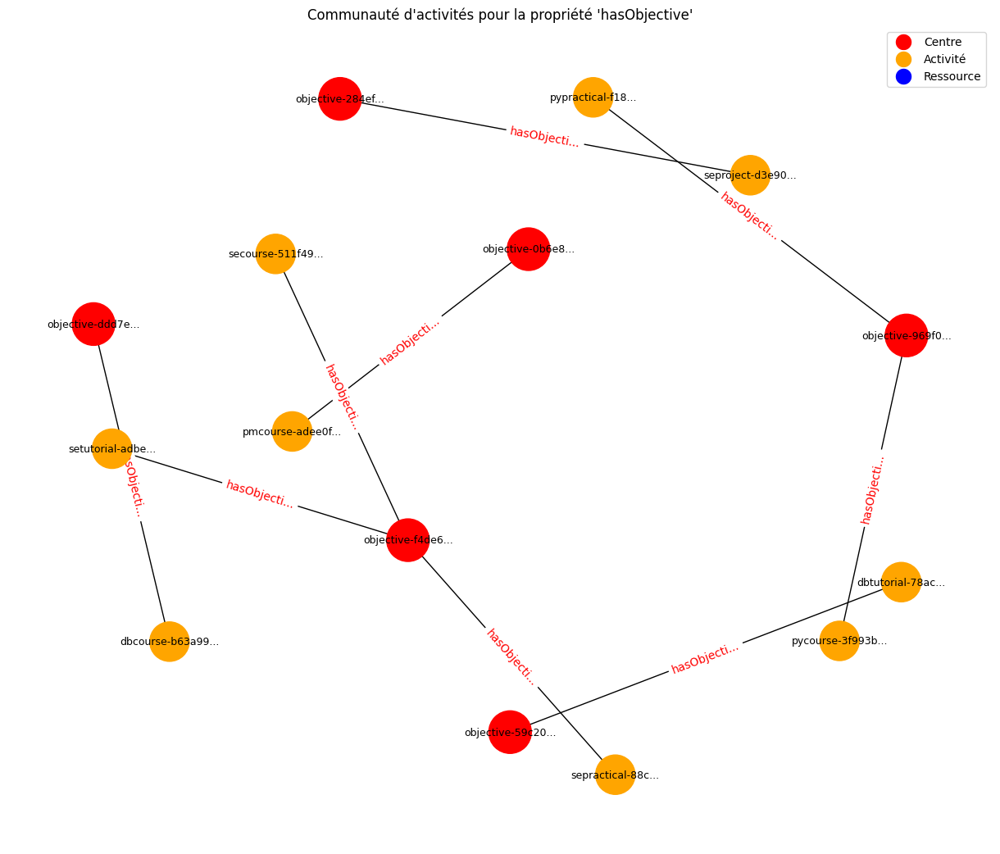

L'élément central 'objective-284ef78c-99f5-45f0-935a' est relié aux activités pour la propriété 'hasObjective'.
L'élément central 'objective-59c2099d-746e-4872-bbc1' est relié aux activités pour la propriété 'hasObjective'.
L'élément central 'objective-969f073e-1e01-4ad0-a0f0' est relié aux activités pour la propriété 'hasObjective'.
L'élément central 'objective-ddd7e420-9347-4a53-8f06' est relié aux activités pour la propriété 'hasObjective'.
L'élément central 'objective-f4de69e1-e2ba-41a6-a268' est relié aux activités pour la propriété 'hasObjective'.
L'élément central 'objective-0b6e8fa9-d03d-4636-ab9c' est relié aux activités pour la propriété 'hasObjective'.

Visualisation de la communauté pour la propriété 'activityDescription'


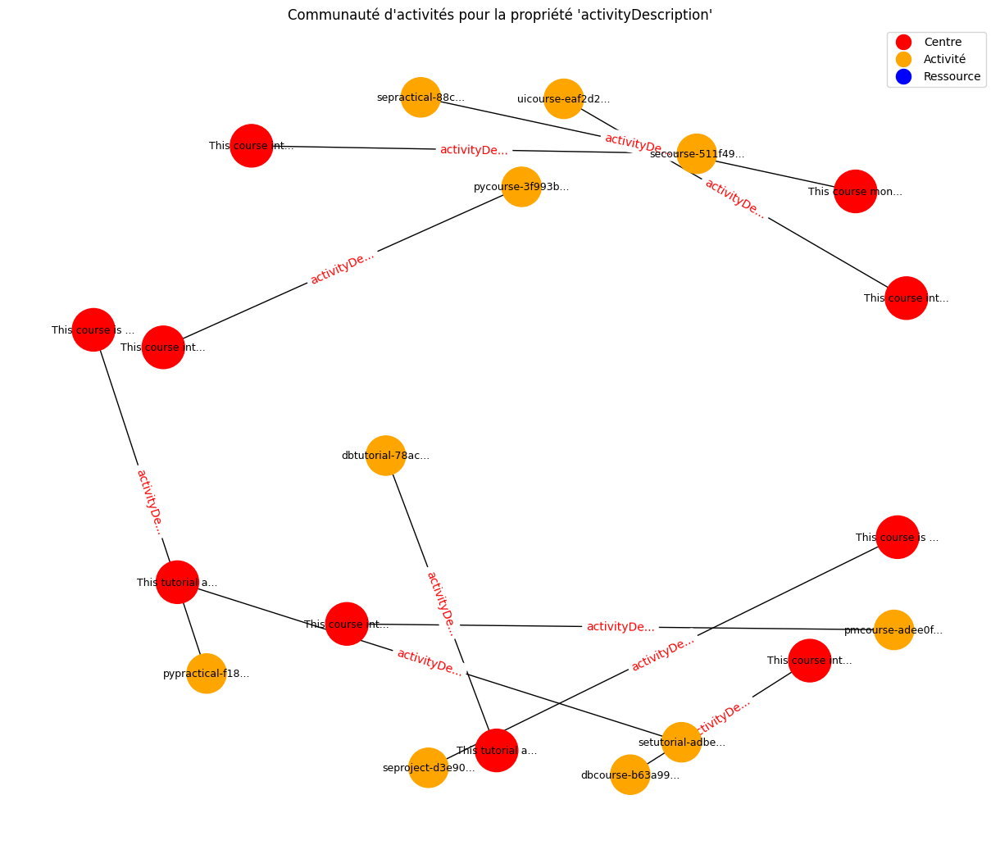

L'élément central 'This course introduces project management concepts to level 1 student' est relié aux activités pour la propriété 'activityDescription'.
L'élément central 'This course monitor software engineering practical questions for level 1 student' est relié aux activités pour la propriété 'activityDescription'.
L'élément central 'This course introduces software engineering to level 1 student' est relié aux activités pour la propriété 'activityDescription'.
L'élément central 'This tutorial answers level 1 student questions on software engineering' est relié aux activités pour la propriété 'activityDescription'.
L'élément central 'This course is for follow up of software engineering projects of level 1 student' est relié aux activités pour la propriété 'activityDescription'.
L'élément central 'This course introduces the python programming to level 1 student' est relié aux activités pour la propriété 'activityDescription'.
L'élément central 'This course introduces the database con

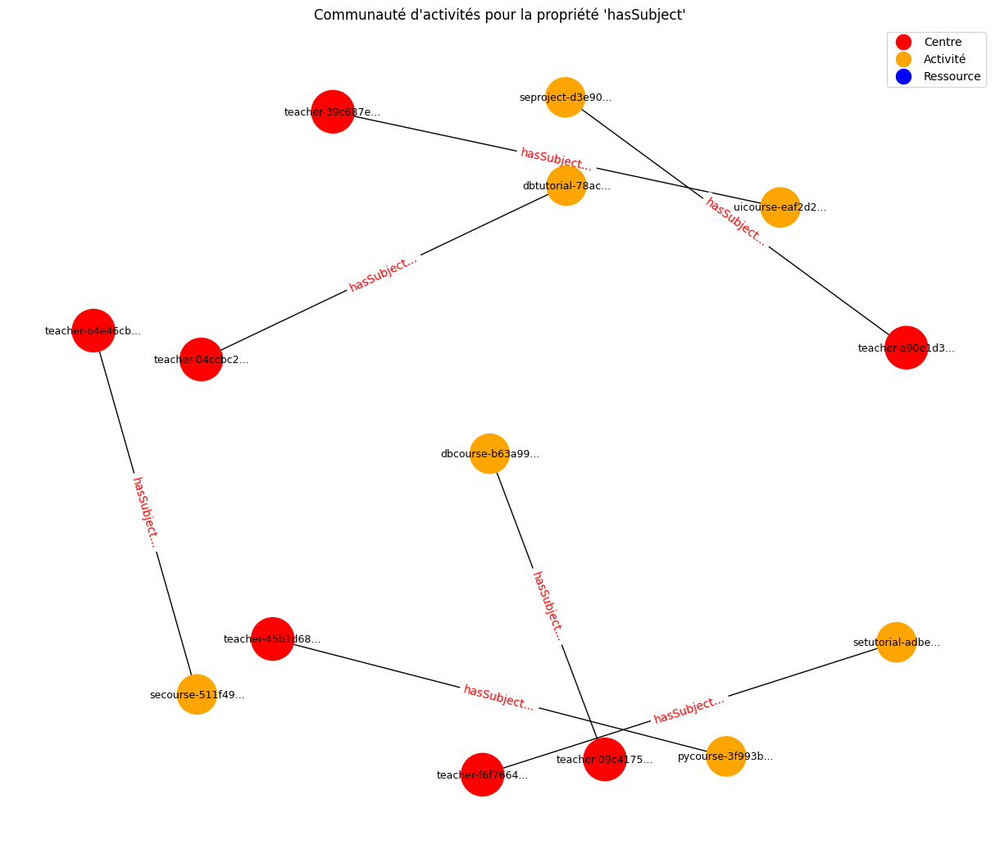

L'élément central 'teacher-39c687e2-5671-4ade-90b1' est relié aux activités pour la propriété 'hasSubject'.
L'élément central 'teacher-a90e1d36-c79f-47f1-a2b5' est relié aux activités pour la propriété 'hasSubject'.
L'élément central 'teacher-45b1d68b-d33c-4eaf-93af' est relié aux activités pour la propriété 'hasSubject'.
L'élément central 'teacher-04ccbc2a-0abe-4d78-90a4' est relié aux activités pour la propriété 'hasSubject'.
L'élément central 'teacher-b4e46cbe-e682-4132-a2d7' est relié aux activités pour la propriété 'hasSubject'.
L'élément central 'teacher-09c4175e-f119-4d66-ac53' est relié aux activités pour la propriété 'hasSubject'.
L'élément central 'teacher-f6f76647-ad40-4a4e-93c0' est relié aux activités pour la propriété 'hasSubject'.

Visualisation de la communauté pour la propriété 'hasName'


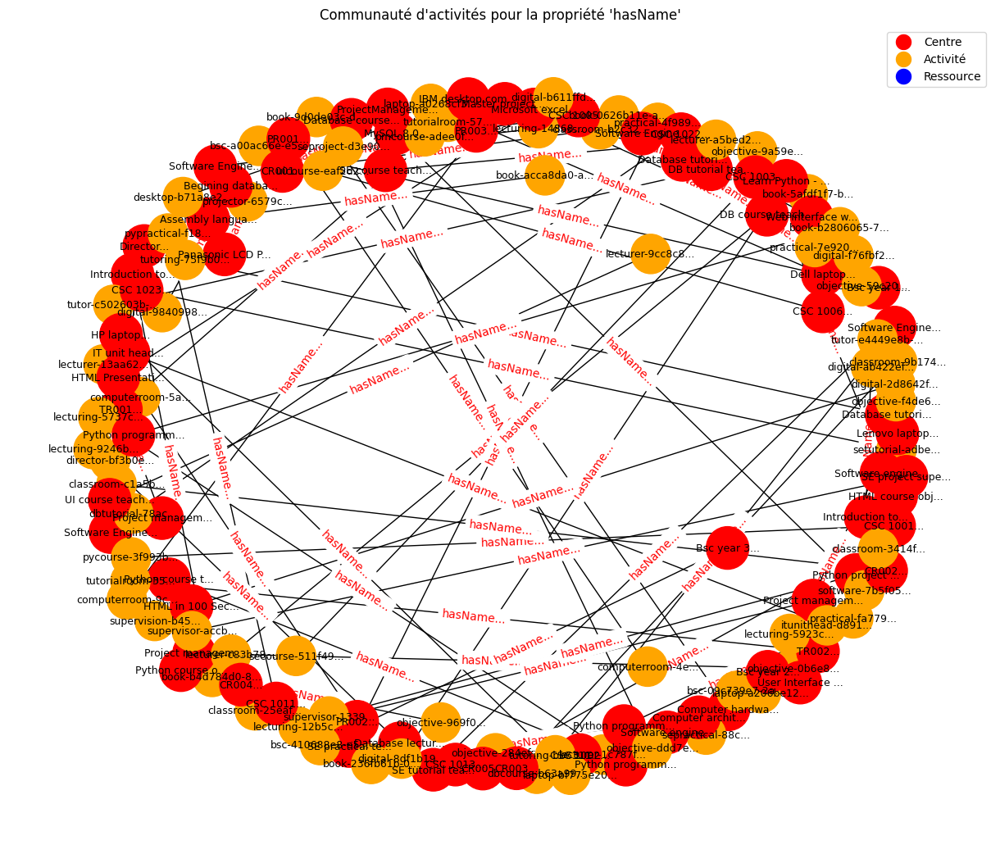

L'élément central 'DB tutorial teacher' est relié aux activités pour la propriété 'hasName'.
L'élément central 'Computer hardware' est relié aux activités pour la propriété 'hasName'.
L'élément central 'CSC 1002' est relié aux activités pour la propriété 'hasName'.
L'élément central 'Software engineering course objective' est relié aux activités pour la propriété 'hasName'.
L'élément central 'Project management course objective' est relié aux activités pour la propriété 'hasName'.
L'élément central 'PR002' est relié aux activités pour la propriété 'hasName'.
L'élément central 'CSC 1022' est relié aux activités pour la propriété 'hasName'.
L'élément central 'Computer architecture' est relié aux activités pour la propriété 'hasName'.
L'élément central 'Project management lecture' est relié aux activités pour la propriété 'hasName'.
L'élément central 'Software Engineering lecture' est relié aux activités pour la propriété 'hasName'.
L'élément central 'CSC 1011' est relié aux activités pou

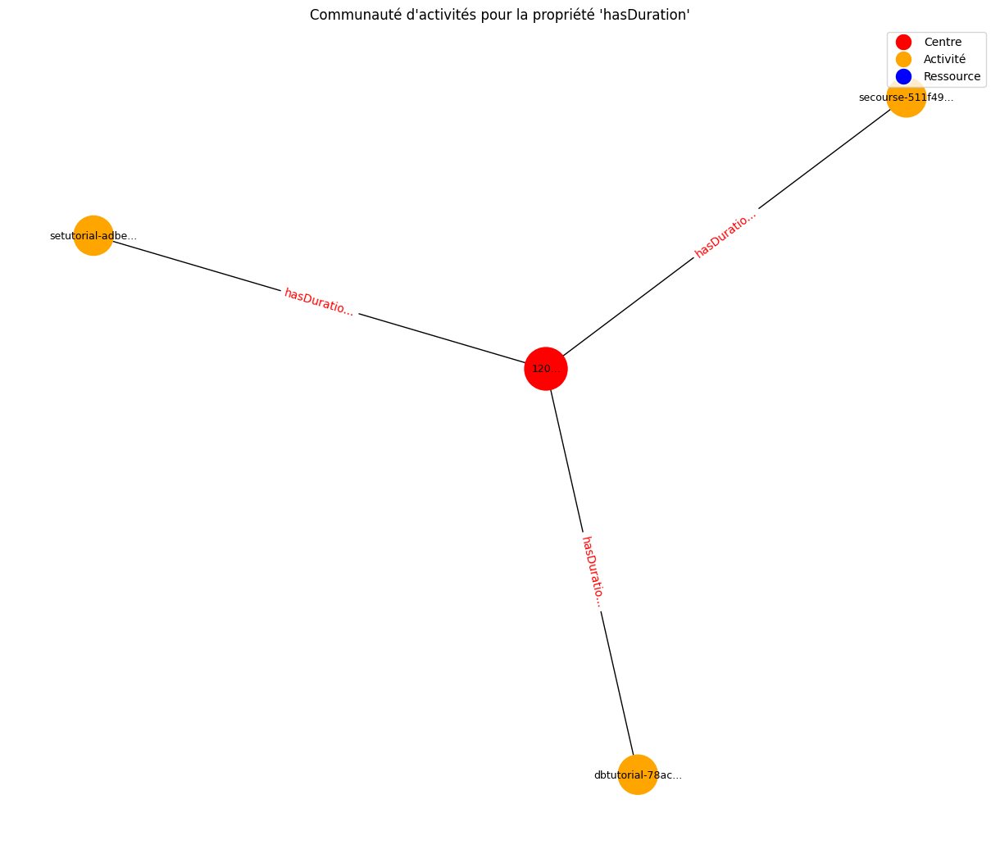

L'élément central '120' est relié aux activités pour la propriété 'hasDuration'.

Visualisation de la communauté pour la propriété 'hasBegeinTime'


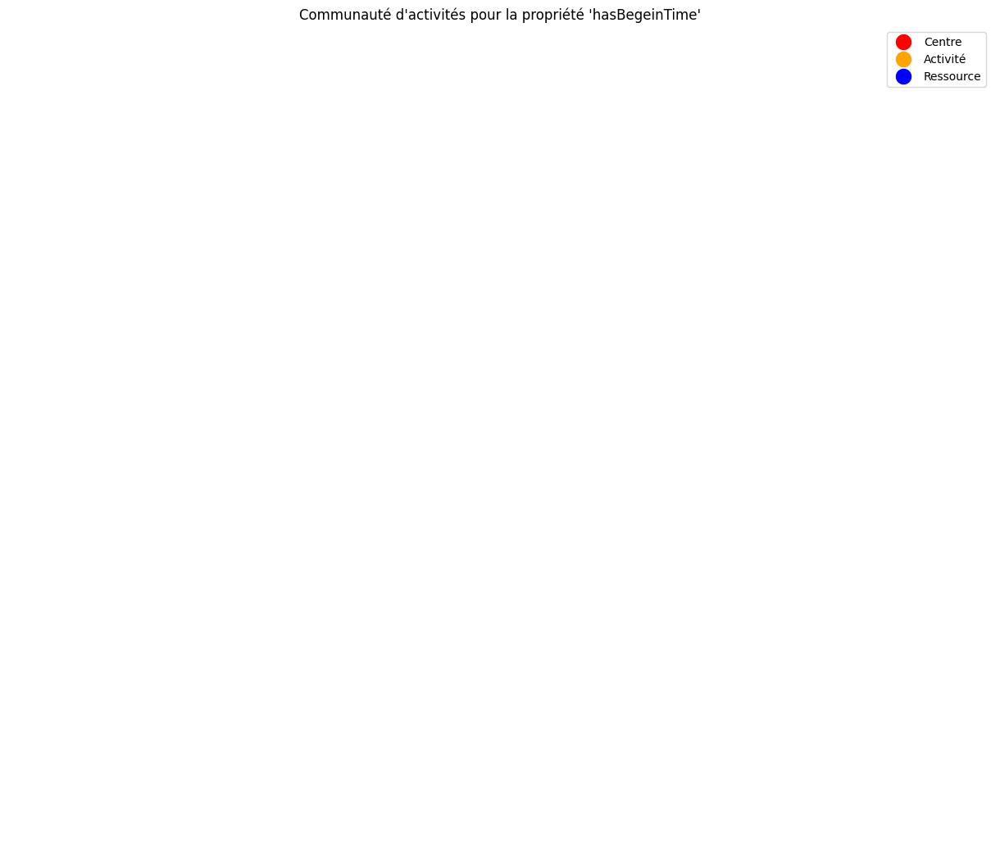


Visualisation de la communauté pour la propriété 'isComposedOf'


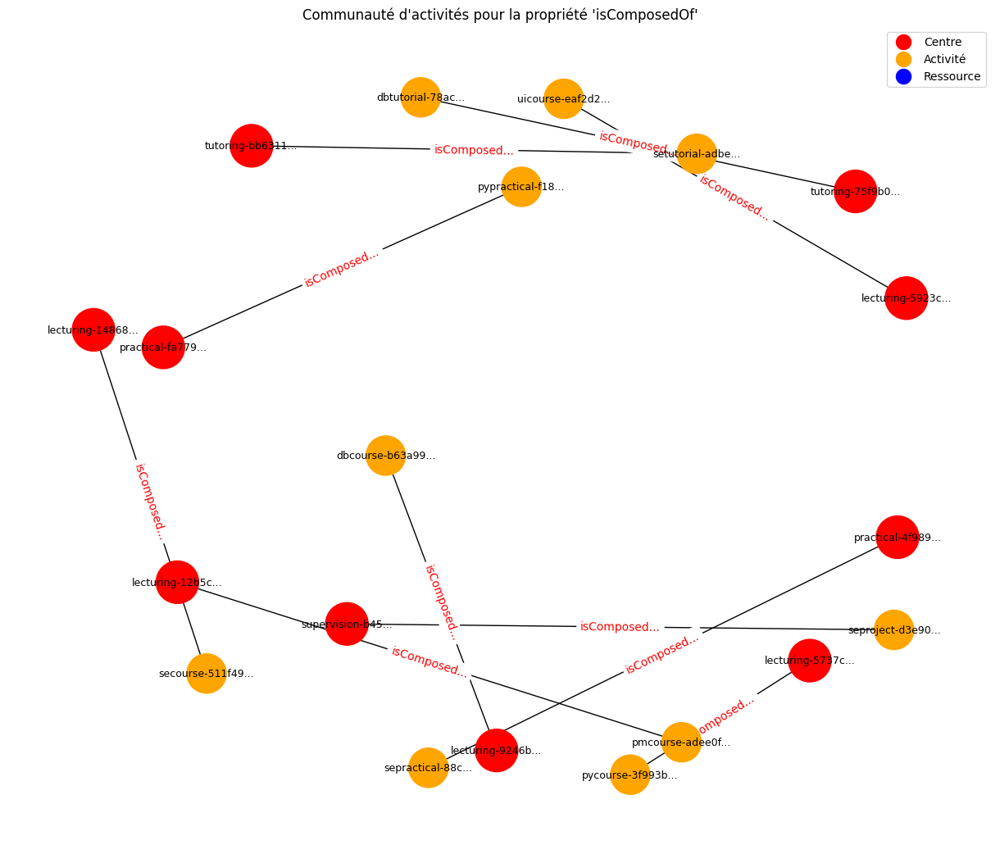

L'élément central 'practical-fa779b89-5ec8-48f1-b5c3' est relié aux activités pour la propriété 'isComposedOf'.
L'élément central 'practical-4f989887-eb53-431f-b188' est relié aux activités pour la propriété 'isComposedOf'.
L'élément central 'supervision-b45158d0-f812-4ee9-976b' est relié aux activités pour la propriété 'isComposedOf'.
L'élément central 'lecturing-14868c21-cca2-436b-9ccc' est relié aux activités pour la propriété 'isComposedOf'.
L'élément central 'lecturing-9246b9e2-d557-4869-885a' est relié aux activités pour la propriété 'isComposedOf'.
L'élément central 'lecturing-12b5c207-f470-4bf3-bb3d' est relié aux activités pour la propriété 'isComposedOf'.
L'élément central 'lecturing-5737c363-39a6-405a-87d1' est relié aux activités pour la propriété 'isComposedOf'.
L'élément central 'tutoring-bb6311ad-c7a3-412c-84f1' est relié aux activités pour la propriété 'isComposedOf'.
L'élément central 'tutoring-75f9b050-39ca-4751-83d0' est relié aux activités pour la propriété 'isCompo

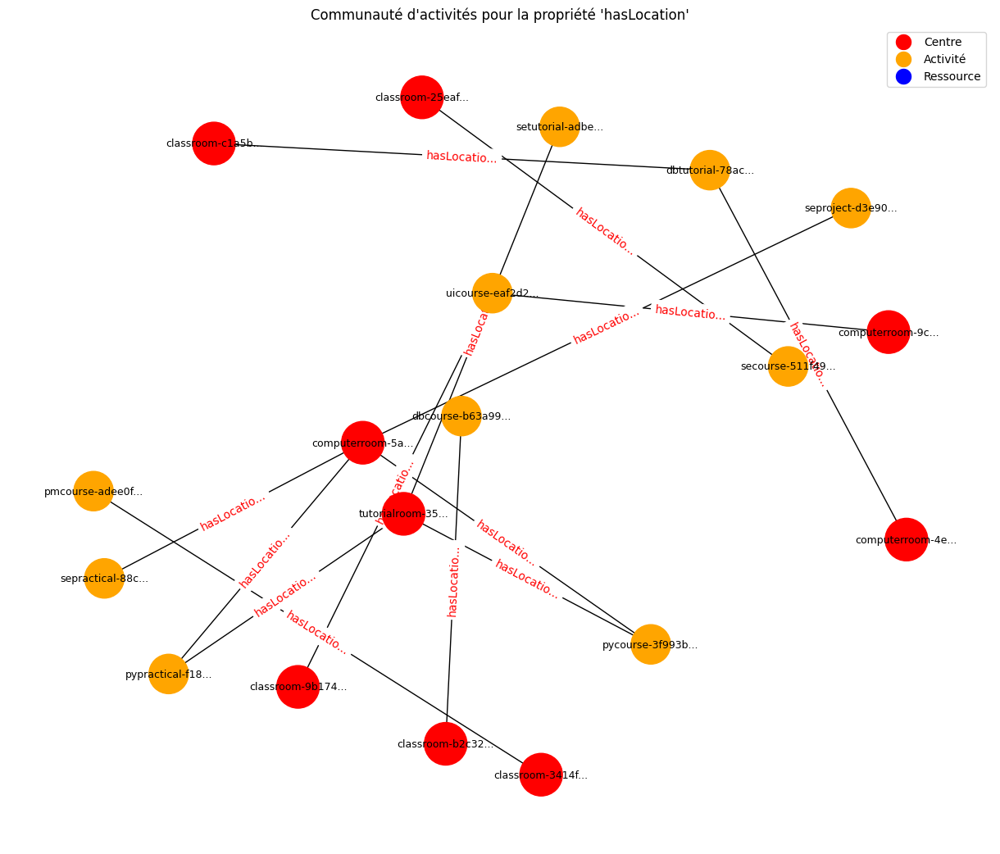

L'élément central 'classroom-25eafa60-5f87-4e1f-9609' est relié aux activités pour la propriété 'hasLocation'.
L'élément central 'computerroom-5a2454c8-c664-401c-86b7' est relié aux activités pour la propriété 'hasLocation'.
L'élément central 'classroom-9b1749fc-8ce7-42ce-89d6' est relié aux activités pour la propriété 'hasLocation'.
L'élément central 'computerroom-4ecbe47c-8f8e-4835-93ac' est relié aux activités pour la propriété 'hasLocation'.
L'élément central 'classroom-c1a5b39b-992c-49fb-9c7e' est relié aux activités pour la propriété 'hasLocation'.
L'élément central 'tutorialroom-351e99f6-c93b-4377-b987' est relié aux activités pour la propriété 'hasLocation'.
L'élément central 'computerroom-9cd6c49c-e52f-48ef-9d23' est relié aux activités pour la propriété 'hasLocation'.
L'élément central 'classroom-3414ff41-3e7a-44de-a679' est relié aux activités pour la propriété 'hasLocation'.
L'élément central 'classroom-b2c326d0-8551-41c4-aee5' est relié aux activités pour la propriété 'has

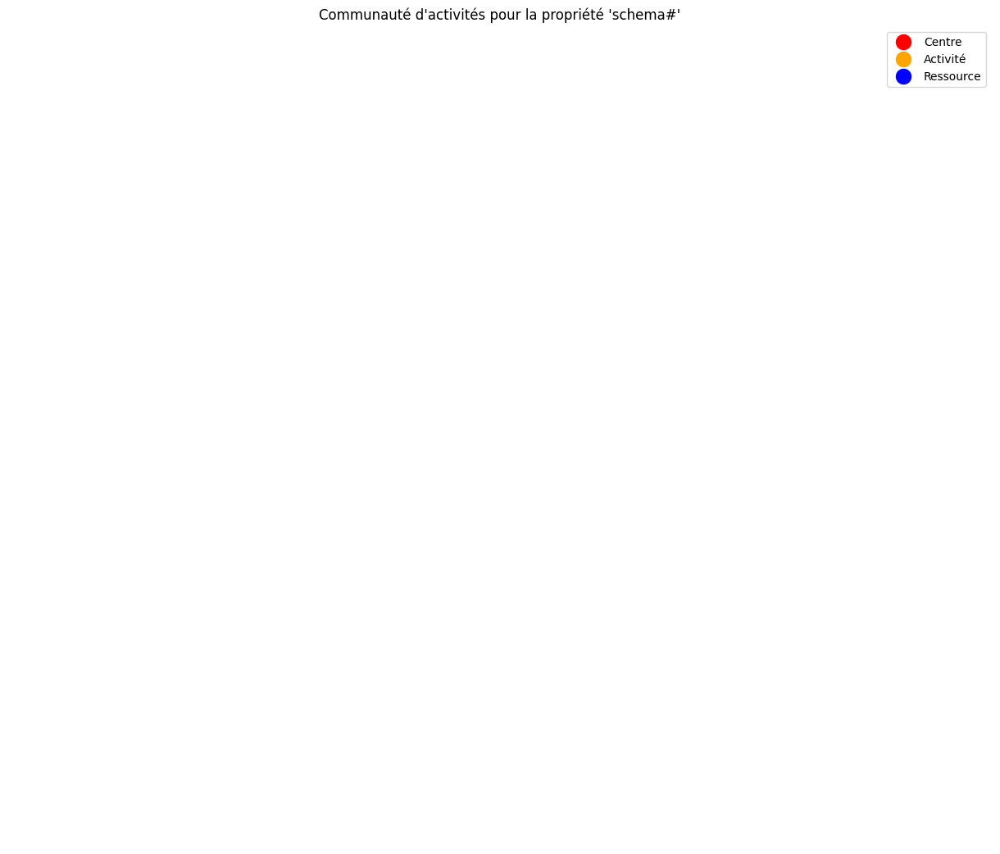


Visualisation de la communauté pour la propriété 'hasBeneficialTo'


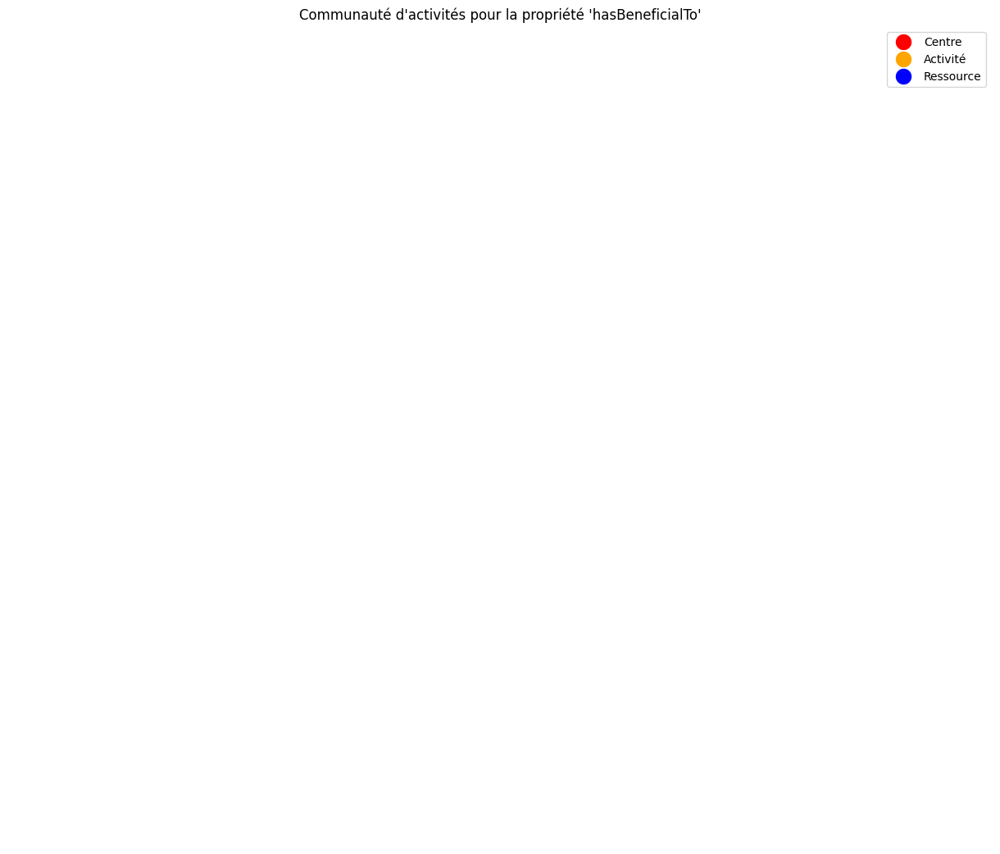


Visualisation de la communauté pour la propriété 'isCarriedOutWith'


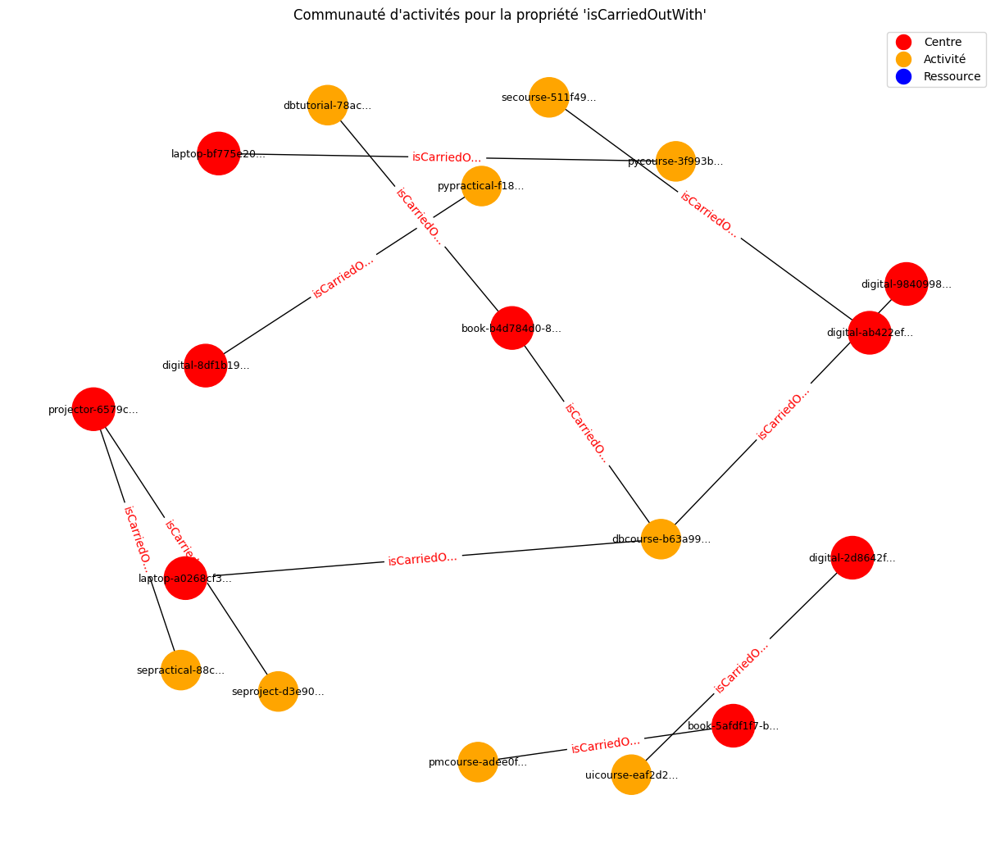

L'élément central 'digital-2d8642f5-f270-4d47-9d3c' est relié aux activités pour la propriété 'isCarriedOutWith'.
L'élément central 'digital-8df1b194-5e61-489b-ab31' est relié aux activités pour la propriété 'isCarriedOutWith'.
L'élément central 'digital-ab422ef5-9bd5-451f-8ab7' est relié aux activités pour la propriété 'isCarriedOutWith'.
L'élément central 'book-b4d784d0-8be6-473f-a4cc' est relié aux activités pour la propriété 'isCarriedOutWith'.
L'élément central 'projector-6579cf57-4d1d-498d-bd51' est relié aux activités pour la propriété 'isCarriedOutWith'.
L'élément central 'laptop-a0268cf3-8b2b-4f83-a467' est relié aux activités pour la propriété 'isCarriedOutWith'.
L'élément central 'laptop-bf775e20-71f6-4587-a518' est relié aux activités pour la propriété 'isCarriedOutWith'.
L'élément central 'digital-9840998a-2a10-46c4-a1d8' est relié aux activités pour la propriété 'isCarriedOutWith'.
L'élément central 'book-5afdf1f7-b15f-450b-be5f' est relié aux activités pour la propriété 

In [ ]:
# Imports nécessaires
from rdflib import Namespace, Graph, URIRef
from rdflib.namespace import RDF
import networkx as nx
import matplotlib.pyplot as plt
from community import community_louvain
import re

# Charger le fichier RDF et initialiser le graphe NetworkX
from google.colab import drive
drive.mount('/content/drive')

akg_file = "/content/drive/MyDrive/teaching_akg.ttl"  # Chemin du fichier TTL dans Google Drive

# Charger le fichier RDF et initialiser le graphe NetworkX
g = Graph()
g.parse(akg_file)

# Définir les namespaces
akg_namespace = Namespace("http://sonfack.com/2023/12/tao/")
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")

# Liste des propriétés spécifiques pour la détection des communautés
selected_properties = [
    "hasObjective", "activityDescription", "hasSubject", "hasName", "hasDuration",
    "hasBegeinTime", "isComposedOf", "hasLocation", "schema#", "hasBeneficialTo",
    "isCarriedOutWith"
]

# Fonction pour extraire et nettoyer les noms des URI
def extract_name(uri):
    name = re.sub(r'http://sonfack\.com/2023/12/(tao|cao)/', '', uri)
    name = re.sub(r'-\w+$', '', name)
    return name

# Fonction pour obtenir le graphe centré autour d'un élément pour une propriété spécifique
def get_property_community_graph(akg, property_name):
    G = nx.Graph()
    central_nodes = set()

    # Construire le graphe avec la propriété spécifique
    for subject, pred, obj in akg:
        pred_name = extract_name(str(pred))
        if pred_name == property_name:  # Filtrer par la propriété spécifique
            subject_name = extract_name(str(subject))
            obj_name = extract_name(str(obj))

            # Ajouter le centre et les activités autour
            G.add_node(subject_name, type="activité", color="orange")
            G.add_node(obj_name, type="centre", color="red")  # Centre de la communauté
            G.add_edge(obj_name, subject_name, label=pred_name)

            central_nodes.add(obj_name)

    return G, central_nodes

# Fonction pour appliquer l'algorithme de Louvain et obtenir des partitions
def apply_louvain_clustering(G):
    if G.number_of_edges() > 0:  # Vérifier que le graphe a des arêtes
        partition = community_louvain.best_partition(G)
        return partition
    else:
        return {}

# Visualisation d'une communauté d'activités centrée autour d'un élément pour une propriété donnée
def visualize_community_with_center(G, central_nodes, property_name):
    pos = nx.spring_layout(G, seed=42, k=1.5, scale=2)  # Augmentation de l'espacement
    plt.figure(figsize=(12, 10))
    node_colors = ["red" if node in central_nodes else ("orange" if G.nodes[node].get("type") == "activité" else "blue") for node in G]
    node_sizes = [1400 if node in central_nodes else (1200 if G.nodes[node].get("type") == "activité" else 600) for node in G]
    nx.draw(G, pos, with_labels=True, labels={node: extract_name(node)[:15] + '...' for node in G.nodes()},
            node_size=node_sizes, node_color=node_colors, font_size=9)
    edge_labels = nx.get_edge_attributes(G, 'label')
    simplified_edge_labels = {key: extract_name(label)[:10] + '...' for key, label in edge_labels.items()}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=simplified_edge_labels, font_color="red")
    plt.legend(handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='Centre', markersize=15, markerfacecolor='red'),
        plt.Line2D([0], [0], marker='o', color='w', label='Activité', markersize=15, markerfacecolor='orange'),
        plt.Line2D([0], [0], marker='o', color='w', label='Ressource', markersize=15, markerfacecolor='blue')
    ], loc='upper right')
    plt.title(f"Communauté d'activités pour la propriété '{property_name}'")
    plt.show()

    # Afficher le texte explicatif pour chaque nœud indiquant sa communauté
    for node in central_nodes:
        print(f"L'élément central '{node}' est relié aux activités pour la propriété '{property_name}'.")

# Fonction principale pour visualiser les graphes et les communautés pour chaque propriété spécifique
def visualize_all_property_communities(akg, properties):
    for property_name in properties:
        print(f"\nVisualisation de la communauté pour la propriété '{property_name}'")

        # Générer le graphe pour la propriété spécifique
        G, central_nodes = get_property_community_graph(akg, property_name)

        # Appliquer l'algorithme de Louvain pour détecter les communautés (facultatif ici)
        partition = apply_louvain_clustering(G)

        # Visualiser le graphe avec la communauté centrée et un texte explicatif
        visualize_community_with_center(G, central_nodes, property_name)

# Exécuter la visualisation pour toutes les propriétés
visualize_all_property_communities(g, selected_properties)


In [64]:
# Imports nécessaires
from rdflib import Namespace, Graph, URIRef
from rdflib.namespace import RDF
import networkx as nx
import matplotlib.pyplot as plt
import re
import numpy as np

# Charger le fichier RDF et initialiser le graphe NetworkX
from google.colab import drive
drive.mount('/content/drive')

akg_file = "teaching_akg.ttl"  # Chemin du fichier TTL dans Google Drive

# Charger le fichier RDF
g = Graph()
g.parse(akg_file)

# Définir les namespaces
akg_namespace = Namespace("http://sonfack.com/2023/12/tao/")
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")

# Liste des propriétés spécifiques pour la détection des communautés
selected_properties = [
    "hasObjective", "activityDescription", "hasSubject", "hasName", "hasDuration",
    "hasBegeinTime", "isComposedOf", "hasLocation", "schema#", "hasBeneficialTo",
    "isCarriedOutWith"
]

# Fonction pour extraire et nettoyer les noms des URI
def extract_name(uri):
    name = re.sub(r'http://sonfack\.com/2023/12/(tao|cao)/', '', uri)
    name = re.sub(r'-\w+$', '', name)
    return name[:12] + '...' if len(name) > 12 else name  # Troncature des noms longs

# Fonction pour créer une représentation en étoile pour une propriété spécifique
def create_star_graph(akg, property_name):
    G = nx.DiGraph()
    center = f"Centre-{property_name}"
    G.add_node(center, color="red")  # Ajouter le centre du graphe

    # Ajouter les activités et ressources liées à la propriété spécifique
    for subject, pred, obj in akg:
        pred_name = extract_name(str(pred))
        if pred_name == property_name:
            subject_name = extract_name(str(subject))
            obj_name = extract_name(str(obj))

            G.add_node(subject_name, color="orange")  # Activité
            G.add_edge(center, subject_name, label=property_name)  # Liaison vers l'activité

            # Ajouter les éléments liés à chaque activité (similaire à votre dessin)
            G.add_node(obj_name, color="blue")  # Élément
            G.add_edge(subject_name, obj_name, label="element")

    return G

# Fonction pour ajuster la disposition et appliquer les distances spécifiées
def custom_layout(G, center_node, activity_distance=15, element_distance=7):
    pos = {}
    pos[center_node] = (0, 0)  # Centre au point d'origine

    # Placer les activités à une distance de 15 unités autour du centre
    activities = [n for n in G.neighbors(center_node)]
    angle_between = 360 / max(len(activities), 1)  # Répartir les activités autour du centre

    for i, activity in enumerate(activities):
        angle_rad = (angle_between * i) * (np.pi / 180)  # Convertir en radians
        pos[activity] = (activity_distance * np.cos(angle_rad), activity_distance * np.sin(angle_rad))

        # Placer les éléments autour de chaque activité à une distance de 7 unités
        elements = list(G.neighbors(activity))
        for j, element in enumerate(elements):
            angle_element = angle_rad + (j + 1) * (np.pi / 180)
            pos[element] = (
                pos[activity][0] + element_distance * np.cos(angle_element),
                pos[activity][1] + element_distance * np.sin(angle_element)
            )

    return pos

# Fonction de visualisation
def visualize_star_graph(G, property_name, center_node):
    pos = custom_layout(G, center_node)
    plt.figure(figsize=(14, 12))
    node_colors = [G.nodes[node].get("color", "gray") for node in G]

    # Dessiner les nœuds et les étiquettes
    nx.draw(G, pos, with_labels=True, node_color=node_colors, font_size=8, node_size=1800)

    # Dessiner les étiquettes des arêtes avec une police plus petite
    edge_labels = nx.get_edge_attributes(G, 'label')
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color="red", font_size=6)

    plt.title(f"Communauté d'activités pour la propriété '{property_name}'")
    plt.show()

# Générer et visualiser chaque graphe pour les propriétés spécifiées
for property_name in selected_properties:
    G = create_star_graph(g, property_name)
    center_node = f"Centre-{property_name}"
    visualize_star_graph(G, property_name, center_node)


ModuleNotFoundError: No module named 'google.colab'

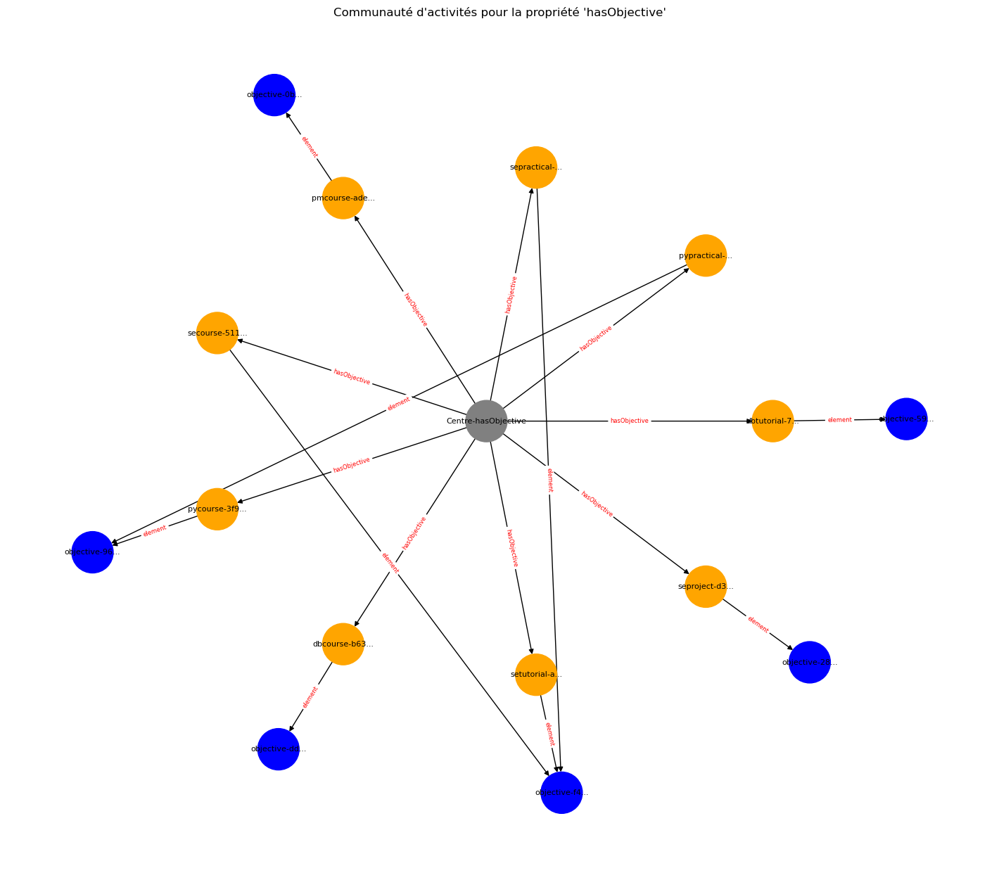

Aucune communauté trouvée pour la propriété 'activityDescription'.


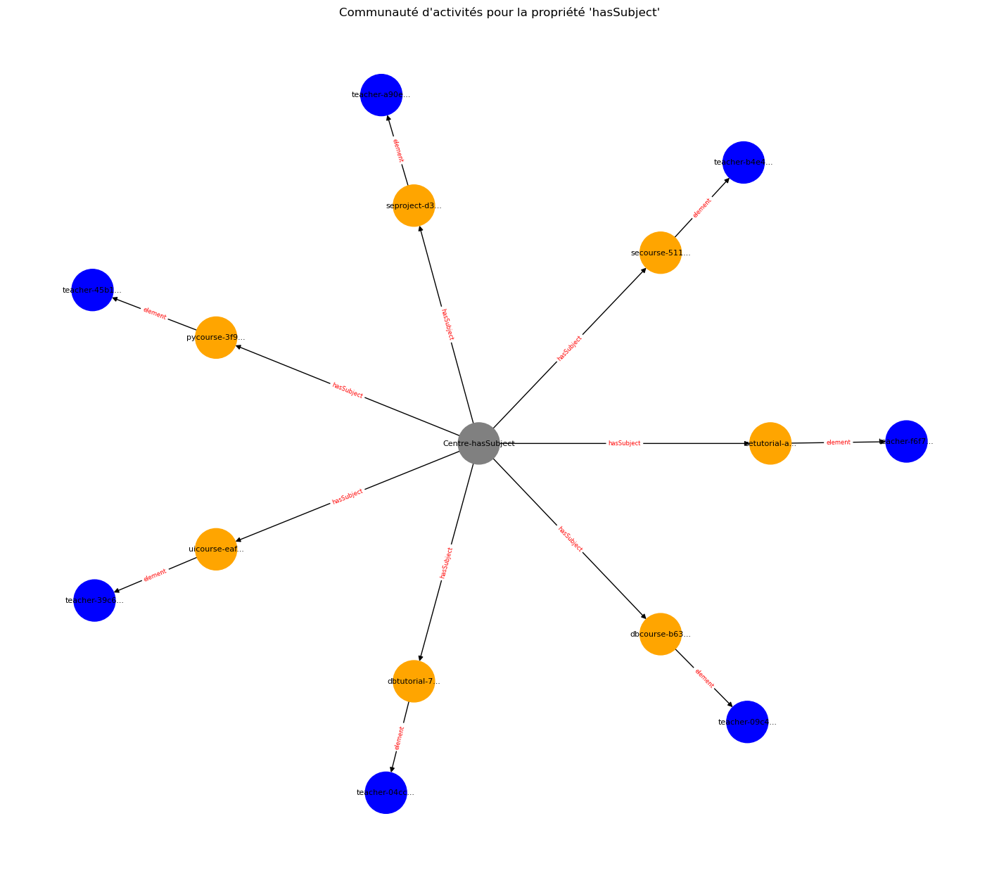

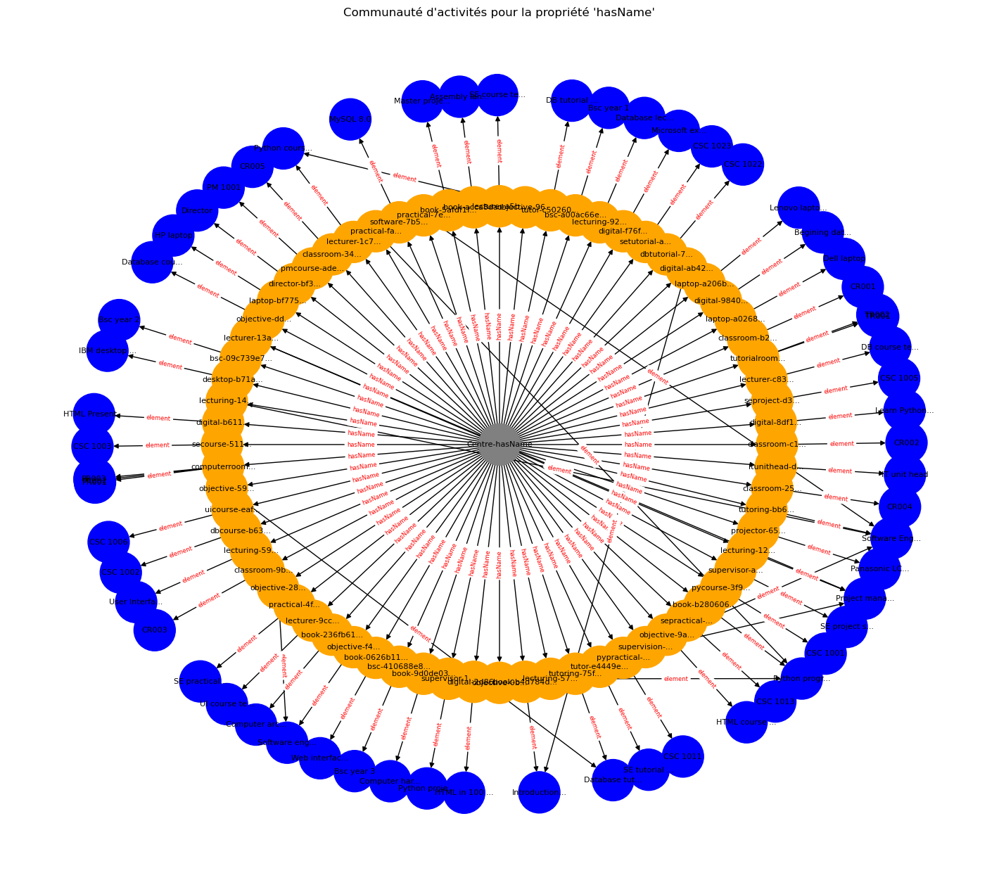

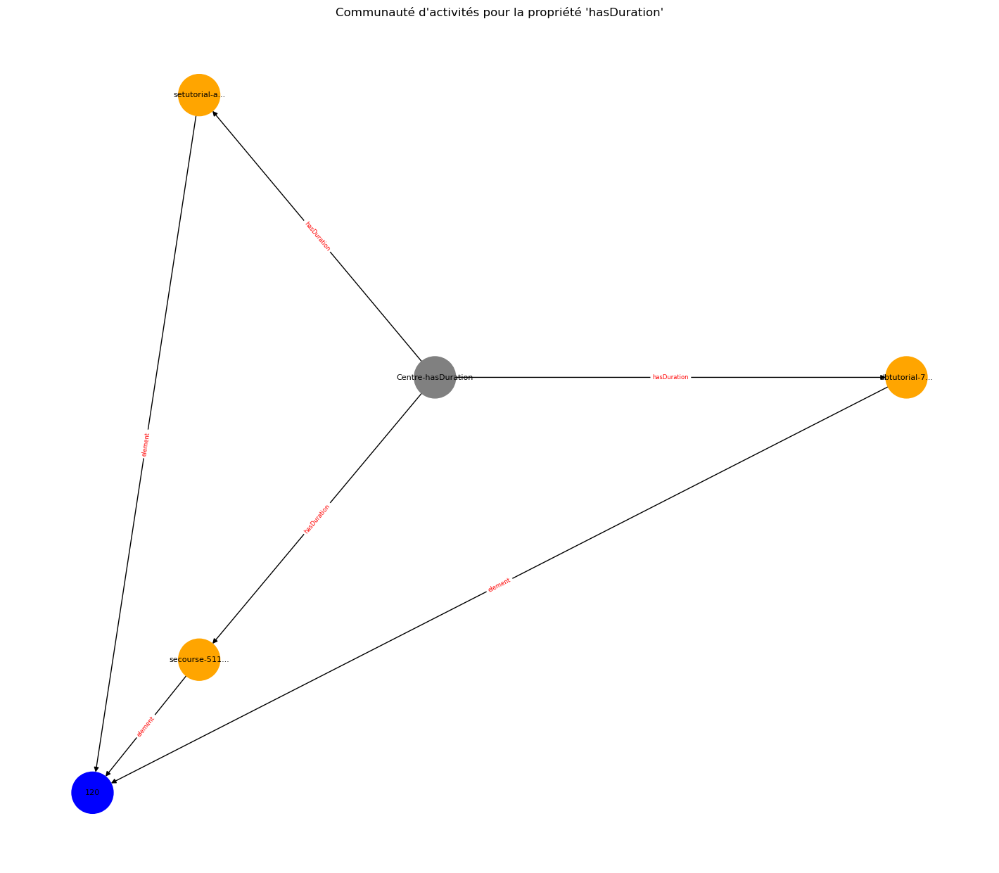

Aucune communauté trouvée pour la propriété 'hasBegeinTime'.


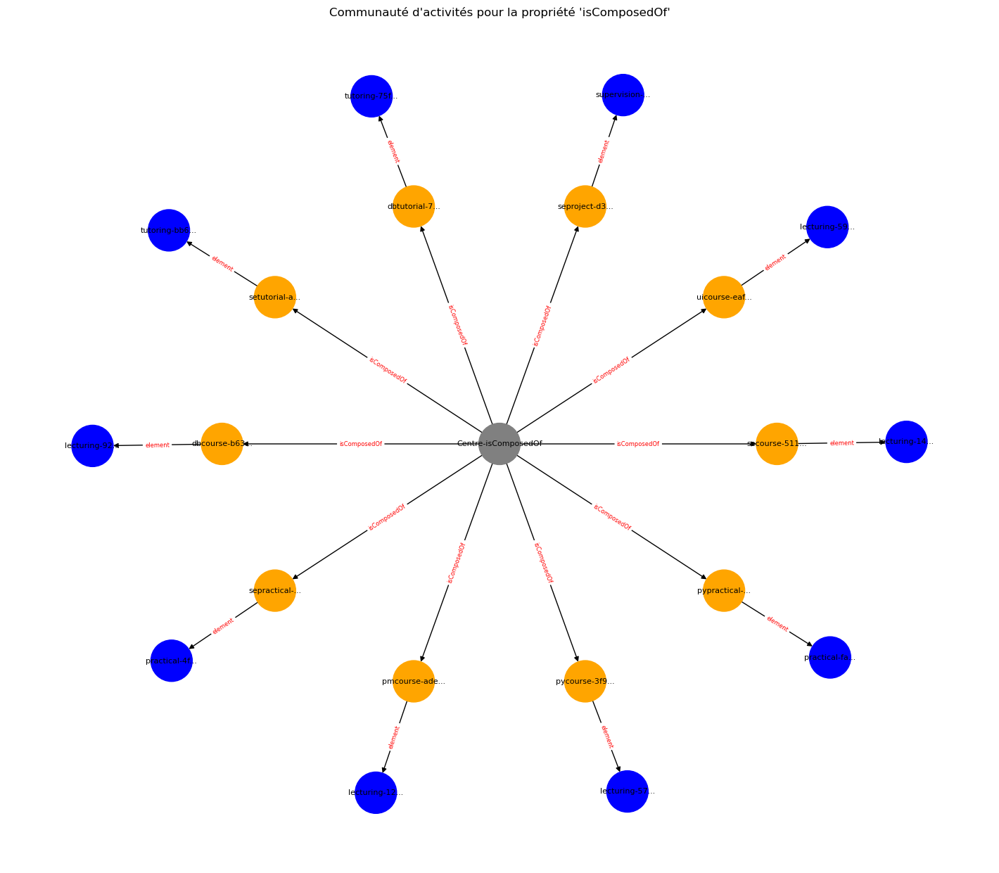

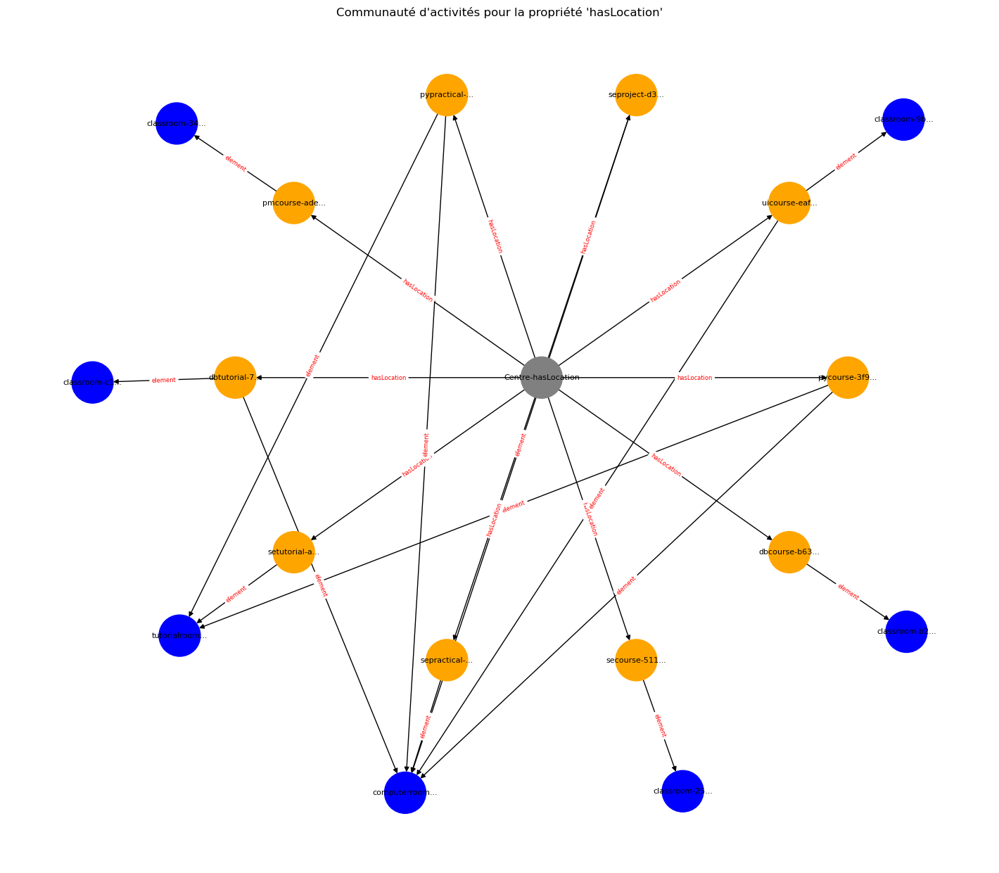

Aucune communauté trouvée pour la propriété 'hasBeneficialTo'.
Aucune communauté trouvée pour la propriété 'isCarriedOutWith'.


In [68]:
# Imports nécessaires
from rdflib import Namespace, Graph, URIRef
from rdflib.namespace import RDF
import networkx as nx
import matplotlib.pyplot as plt
import re
import numpy as np


akg_file = "teaching_akg.ttl"  # Chemin du fichier TTL dans Google Drive

# Charger le fichier RDF
g = Graph()
g.parse(akg_file)

# Définir les namespaces
akg_namespace = Namespace("http://sonfack.com/2023/12/tao/")
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")

# Liste des propriétés spécifiques pour la détection des communautés
selected_properties = [
    "hasObjective", "activityDescription", "hasSubject", "hasName", "hasDuration",
    "hasBegeinTime", "isComposedOf", "hasLocation", "hasBeneficialTo",
    "isCarriedOutWith"
]

# Fonction pour extraire et nettoyer les noms des URI
def extract_name(uri):
    name = re.sub(r'http://sonfack\.com/2023/12/(tao|cao)/', '', uri)
    name = re.sub(r'-\w+$', '', name)
    return name[:12] + '...' if len(name) > 12 else name  # Troncature des noms longs

# Fonction pour créer une représentation en étoile pour une propriété spécifique
def create_star_graph(akg, property_name):
    G = nx.DiGraph()
    center = f"Centre-{property_name}"

    # Ajouter les activités et ressources liées à la propriété spécifique
    connections_found = False
    for subject, pred, obj in akg:
        pred_name = extract_name(str(pred))
        if pred_name == property_name:
            subject_name = extract_name(str(subject))
            obj_name = extract_name(str(obj))
            connections_found = True

            # Ajouter le centre uniquement si des connexions existent
            if  pred_name != property_name:
                G.add_node(center, color="red")
                connections_found = False


            G.add_node(subject_name, color="orange")  # Activité
            G.add_edge(center, subject_name, label=property_name)  # Liaison vers l'activité

            G.add_node(obj_name, color="blue")  # Élément
            G.add_edge(subject_name, obj_name, label="element")  # Liaison entre activité et élément

    # Retirer les nœuds isolés sans connexions
    isolated_nodes = [node for node in G.nodes if G.degree(node) == 0]
    G.remove_nodes_from(isolated_nodes)

    return G, connections_found

# Fonction pour ajuster la disposition et appliquer les distances spécifiées
def custom_layout(G, center_node, activity_distance=15, element_distance=7):
    pos = {}
    pos[center_node] = (0, 0)  # Centre au point d'origine

    # Placer les activités à une distance de 15 unités autour du centre
    activities = [n for n in G.neighbors(center_node)]
    angle_between = 360 / max(len(activities), 1)  # Répartir les activités autour du centre

    for i, activity in enumerate(activities):
        angle_rad = (angle_between * i) * (np.pi / 180)  # Convertir en radians
        pos[activity] = (activity_distance * np.cos(angle_rad), activity_distance * np.sin(angle_rad))

        # Placer les éléments autour de chaque activité à une distance de 7 unités
        elements = list(G.neighbors(activity))
        for j, element in enumerate(elements):
            angle_element = angle_rad + (j + 1) * (np.pi / 180)
            pos[element] = (
                pos[activity][0] + element_distance * np.cos(angle_element),
                pos[activity][1] + element_distance * np.sin(angle_element)
            )

    return pos

# Fonction de visualisation
def visualize_star_graph(G, property_name , center_node):
    pos = custom_layout(G, center_node)
    plt.figure(figsize=(14, 12))
    node_colors = [G.nodes[node].get("color", "gray") for node in G]

    # Dessiner les nœuds et les étiquettes
    nx.draw(G, pos, with_labels=True, node_color=node_colors, font_size=8, node_size=1800)

    # Dessiner les étiquettes des arêtes avec une police plus petite
    edge_labels = nx.get_edge_attributes(G, 'label')
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color="red", font_size=6)

    plt.title(f"Communauté d'activités pour la propriété '{property_name}'")
    plt.show()

# Générer et visualiser chaque graphe pour les propriétés spécifiées
for property_name in selected_properties:
    G, connections_found = create_star_graph(g, property_name)
    if connections_found:  # Vérifier qu'il y a des connexions avant de visualiser
        center_node = f"Centre-{property_name}"
        visualize_star_graph(G, property_name, center_node)
    else:
        print(f"Aucune communauté trouvée pour la propriété '{property_name}'.")


In [ ]:
# Fonction de calcul de modularité avec l'algorithme de Louvain
def LouvainModularityCalc(G, partition):
    return community_louvain.modularity(partition, G)

# Étape d'optimisation de la modularité avec Louvain
def LouvainModularityStep(G):
    return community_louvain.best_partition(G)

# Optimisation par entropie (exemple simple)
def entropyOptimization(C):
    # Simuler une optimisation par entropie (ici on retourne C sans modification)
    return C

# Agrégation des communautés (pour simplifier, on n'effectue pas de modifications ici)
def communityAggregation(C):
    return C

# Fonction d'inférence de nouvelles connaissances (exemple)
def inferenceNewKnowledge(IAG):
    # Simuler une inférence des nouvelles connaissances
    print("Inférence de nouvelles connaissances effectuée.")

# Fonction de validation des communautés
def validateCommunities(PoVF):
    # Simuler une validation
    print(f"Validation des communautés avec PoVF: {PoVF}")

# Création d'un exemple de graphe NetworkX
G = nx.erdos_renyi_graph(100, 0.05)  # Graphe aléatoire

# Initialisation des paramètres
ε = 0.001
imax = 10
PoVF = 0.9
i = 0

# Initialisation des communautés
partition = LouvainModularityStep(G)  # Étape initiale avec Louvain
Qactual = LouvainModularityCalc(G, partition)
Qi = Qactual

# Optimisation par entropie
CH = entropyOptimization(partition)
C0 = CH

# Boucle principale de l'algorithme
while abs(Qactual - Qi) > ε and i < imax:
    partition = communityAggregation(partition)  # Agrégation des communautés
    Qactual = Qi  # Mise à jour de Qactual
    i += 1
    partition = LouvainModularityStep(G)  # Optimisation de la modularité
    Qi = LouvainModularityCalc(G, partition)  # Calcul de la nouvelle modularité

# Inférence de nouvelles connaissances
inferenceNewKnowledge(G)

# Validation des communautés
validateCommunities(PoVF)


Inférence de nouvelles connaissances effectuée.
Validation des communautés avec PoVF: 0.9


In [ ]:
from rdflib import Graph

# Charger le fichier RDF à partir de Google Drive
rdf_graph = Graph()
rdf_graph.parse("teaching_akg.ttl", format="ttl")

# Vérifier le chargement
print(f"Graph loaded with {len(rdf_graph)} triples.")


Graph loaded with 509 triples.


In [ ]:
for subj, pred, obj in rdf_graph:
    G.add_node(str(subj))
    G.add_node(str(obj))
    G.add_edge(str(subj), str(obj), label=str(pred))  # Ajoute une arête avec la relation comme étiquette

# Vérifier la taille du graphe
print(f"Graphe créé avec {G.number_of_nodes()} nœuds et {G.number_of_edges()} arêtes.")


Graphe créé avec 441 nœuds et 737 arêtes.


In [ ]:
from collections import Counter

# Compter la taille de chaque communauté
community_sizes = Counter(partition.values())

# Afficher les tailles des communautés
print("Taille des communautés :", community_sizes)


Taille des communautés : Counter({1: 17, 4: 16, 5: 16, 0: 11, 2: 11, 6: 10, 7: 9, 8: 9, 3: 1})


In [ ]:

from collections import defaultdict

# Créer un dictionnaire pour stocker les nœuds par communauté
communities = defaultdict(list)

# Parcourir la partition et organiser les nœuds par communauté
for node, comm in partition.items():
    communities[comm].append(node)

# Afficher les nœuds pour chaque communauté
for comm, nodes in communities.items():
    print(f"Communauté {comm} : {nodes}")


Communauté 0 : [0, 4, 17, 24, 28, 53, 59, 64, 77, 83, 84]
Communauté 1 : [1, 16, 21, 32, 36, 43, 55, 57, 74, 76, 81, 82, 86, 88, 89, 93, 94]
Communauté 2 : [2, 10, 15, 19, 29, 47, 54, 63, 91, 97, 98]
Communauté 4 : [3, 5, 6, 9, 25, 33, 34, 38, 60, 62, 66, 70, 79, 80, 92, 95]
Communauté 5 : [7, 13, 14, 37, 41, 42, 44, 45, 50, 51, 52, 56, 69, 73, 78, 87]
Communauté 6 : [8, 11, 12, 23, 27, 39, 48, 61, 72, 90]
Communauté 7 : [18, 20, 26, 30, 40, 46, 58, 65, 67]
Communauté 8 : [22, 31, 35, 49, 68, 71, 75, 96, 99]
Communauté 3 : [85]


In [ ]:
import community.community_louvain as community_louvain

# Appliquer l'algorithme de Louvain pour détecter les communautés
partition = community_louvain.best_partition(G)

# Calculer la modularité
modularity_value = community_louvain.modularity(partition, G)

# Afficher la modularité
print(f"Modularité du partitionnement : {modularity_value}")


Modularité du partitionnement : 0.4243360585423924


In [ ]:
import community.community_louvain as community_louvain

# Générer le dendrogramme (une structure de partitions hiérarchiques)
dendrogram = community_louvain.generate_dendrogram(G)

# Parcourir les niveaux du dendrogramme et afficher les partitions
for level in range(len(dendrogram)):
    partition = community_louvain.partition_at_level(dendrogram, level)
    print(f"Partition au niveau {level} :", partition)


Partition au niveau 0 : {0: 16, 1: 1, 2: 7, 3: 17, 4: 9, 5: 9, 6: 4, 7: 2, 8: 8, 9: 9, 10: 10, 11: 12, 12: 12, 13: 24, 14: 24, 15: 15, 16: 29, 17: 29, 18: 20, 19: 15, 20: 20, 21: 26, 22: 18, 23: 12, 24: 16, 25: 21, 26: 14, 27: 23, 28: 28, 29: 7, 30: 30, 31: 22, 32: 1, 33: 21, 34: 9, 35: 0, 36: 26, 37: 19, 38: 0, 39: 8, 40: 14, 41: 2, 42: 2, 43: 3, 44: 19, 45: 7, 46: 30, 47: 4, 48: 23, 49: 32, 50: 6, 51: 7, 52: 6, 53: 11, 54: 18, 55: 1, 56: 2, 57: 3, 58: 14, 59: 16, 60: 25, 61: 13, 62: 17, 63: 10, 64: 28, 65: 30, 66: 17, 67: 30, 68: 18, 69: 19, 70: 21, 71: 22, 72: 7, 73: 19, 74: 5, 75: 22, 76: 29, 77: 11, 78: 24, 79: 25, 80: 25, 81: 26, 82: 29, 83: 11, 84: 28, 85: 27, 86: 5, 87: 6, 88: 3, 89: 29, 90: 13, 91: 33, 92: 31, 93: 1, 94: 32, 95: 31, 96: 0, 97: 33, 98: 4, 99: 22}
Partition au niveau 1 : {0: 3, 1: 4, 2: 6, 3: 3, 4: 0, 5: 0, 6: 5, 7: 6, 8: 6, 9: 0, 10: 6, 11: 6, 12: 6, 13: 5, 14: 5, 15: 6, 16: 4, 17: 4, 18: 2, 19: 6, 20: 2, 21: 3, 22: 0, 23: 6, 24: 3, 25: 1, 26: 2, 27: 1, 28: 3, 

In [ ]:
!pip install scipy matplotlib


In [ ]:
for level in range(len(dendrogram)):
    partition = community_louvain.partition_at_level(dendrogram, level)
    modularity = community_louvain.modularity(partition, G)
    print(f"Modularité au niveau {level} : {modularity}")


Modularité au niveau 0 : 0.40894546632815937
Modularité au niveau 1 : 0.6438520975976169
Modularité au niveau 2 : 0.6992676312528882


In [ ]:
best_level = None
best_modularity = -1

# Parcourir tous les niveaux du dendrogramme pour trouver celui avec la meilleure modularité
for level in range(len(dendrogram)):
    partition = community_louvain.partition_at_level(dendrogram, level)
    modularity = community_louvain.modularity(partition, G)
    print(f"Modularité au niveau {level} : {modularity}")

    if modularity > best_modularity:
        best_modularity = modularity
        best_level = level

print(f"Le niveau optimal est {best_level} avec une modularité de {best_modularity}")


Modularité au niveau 0 : 0.29540799355753566
Modularité au niveau 1 : 0.43295810647572697
Le niveau optimal est 1 avec une modularité de 0.43295810647572697


In [ ]:
# Utiliser le meilleur niveau pour récupérer la meilleure partition
best_partition = community_louvain.partition_at_level(dendrogram, best_level)

# Afficher la partition optimale
print(f"Partition optimale au niveau {best_level} : {best_partition}")


Partition optimale au niveau 1 : {0: 3, 1: 4, 2: 6, 3: 3, 4: 0, 5: 0, 6: 5, 7: 6, 8: 6, 9: 0, 10: 6, 11: 6, 12: 6, 13: 5, 14: 5, 15: 6, 16: 4, 17: 4, 18: 2, 19: 6, 20: 2, 21: 3, 22: 0, 23: 6, 24: 3, 25: 1, 26: 2, 27: 1, 28: 3, 29: 6, 30: 2, 31: 0, 32: 4, 33: 1, 34: 0, 35: 0, 36: 3, 37: 6, 38: 0, 39: 6, 40: 2, 41: 6, 42: 6, 43: 2, 44: 6, 45: 6, 46: 2, 47: 5, 48: 1, 49: 0, 50: 6, 51: 6, 52: 6, 53: 1, 54: 0, 55: 4, 56: 6, 57: 2, 58: 2, 59: 3, 60: 0, 61: 4, 62: 3, 63: 6, 64: 3, 65: 2, 66: 3, 67: 2, 68: 0, 69: 6, 70: 1, 71: 0, 72: 6, 73: 6, 74: 0, 75: 0, 76: 4, 77: 1, 78: 5, 79: 0, 80: 0, 81: 3, 82: 4, 83: 1, 84: 3, 85: 7, 86: 0, 87: 6, 88: 2, 89: 4, 90: 4, 91: 5, 92: 1, 93: 4, 94: 0, 95: 1, 96: 0, 97: 5, 98: 5, 99: 0}


In [ ]:
# Identifier les arêtes entre les communautés
inter_community_edges = [(u, v) for u, v in G.edges() if best_partition[u] != best_partition[v]]

# Afficher le nombre d'arêtes entre les communautés
print(f"Nombre d'arêtes entre les communautés : {len(inter_community_edges)}")



Nombre d'arêtes entre les communautés : 95


In [ ]:
# Calculer la centralité des nœuds dans le sous-graphe d'une communauté
for community_id in set(best_partition.values()):
    subgraph_nodes = [node for node, comm in best_partition.items() if comm == community_id]
    H = G.subgraph(subgraph_nodes)
    degree_centrality = nx.degree_centrality(H)
    print(f"Centralité dans la communauté {community_id} :", degree_centrality)


Centralité dans la communauté 0 : {'Python course objective': 0.045454545454545456, 'http://sonfack.com/2023/12/tao/objective-9a59e20a-60f0-4798-8895-50f6b79621c5': 0.13636363636363635, 'CR005': 0.045454545454545456, 'PM course objective': 0.045454545454545456, 'This course is intended to introduce Web interface programming to level 02 students. It will enables them to designer and display elements such as text, images, forms and interactive functions in a web browser': 0.045454545454545456, 'http://sonfack.com/2023/12/tao/objective-0b6e8fa9-d03d-4636-ab9c-b34578b4ea45': 0.2272727272727273, 'Project management course objective': 0.045454545454545456, 'HTML course objective': 0.045454545454545456, 'teaching objective': 0.045454545454545456, 'http://sonfack.com/2023/12/tao/classroom-3414ff41-3e7a-44de-a679-baac1ab873c2': 0.09090909090909091, 'This course introduces project management concepts to level 1 student': 0.045454545454545456, 'Master project management': 0.045454545454545456, 'T

In [ ]:
import csv

with open('communities.csv', 'w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(['Node', 'Community'])
    for node, community in best_partition.items():
        writer.writerow([node, community])


La conductance d'une communauté 𝐶; C est définie comme le rapport entre le nombre d'arêtes coupées (les arêtes qui relient des nœuds de la communauté à des nœuds extérieurs à la communauté) et le volume de la communauté (le nombre total d'arêtes touchant des nœuds de la communauté), comparé au volume du complément du graphe.

In [ ]:
import networkx as nx

def conductance(G, subgraph_nodes):
    # Calculer le volume (somme des degrés des nœuds)
    subgraph_volume = sum(G.degree(n) for n in subgraph_nodes)

    # Complément de la communauté
    complement_nodes = set(G.nodes()) - set(subgraph_nodes)

    # Calculer le volume du complément
    complement_volume = sum(G.degree(n) for n in complement_nodes)

    # Calculer le nombre d'arêtes coupées (sortantes)
    cut_edges = 0
    for node in subgraph_nodes:
        for neighbor in G.neighbors(node):
            if neighbor in complement_nodes:
                cut_edges += 1

    # Vérifier les volumes pour éviter la division par zéro
    if subgraph_volume == 0 or complement_volume == 0:
        return 0  # Si l'un des volumes est nul, on retourne 0 pour éviter l'erreur

    # Calcul de la conductance
    return cut_edges / min(subgraph_volume, complement_volume)

# Calculer la conductance de chaque communauté
for community_id in set(best_partition.values()):
    subgraph_nodes = [node for node, comm in best_partition.items() if comm == community_id]
    conductance_value = conductance(G, subgraph_nodes)
    print(f"Conductance de la communauté {community_id} : {conductance_value:.4f}")


Conductance de la communauté 0 : 0.3535
Conductance de la communauté 1 : 0.4783
Conductance de la communauté 2 : 0.3929
Conductance de la communauté 3 : 0.4340
Conductance de la communauté 4 : 0.4915
Conductance de la communauté 5 : 0.5385
Conductance de la communauté 6 : 0.3016
Conductance de la communauté 7 : 0.0000


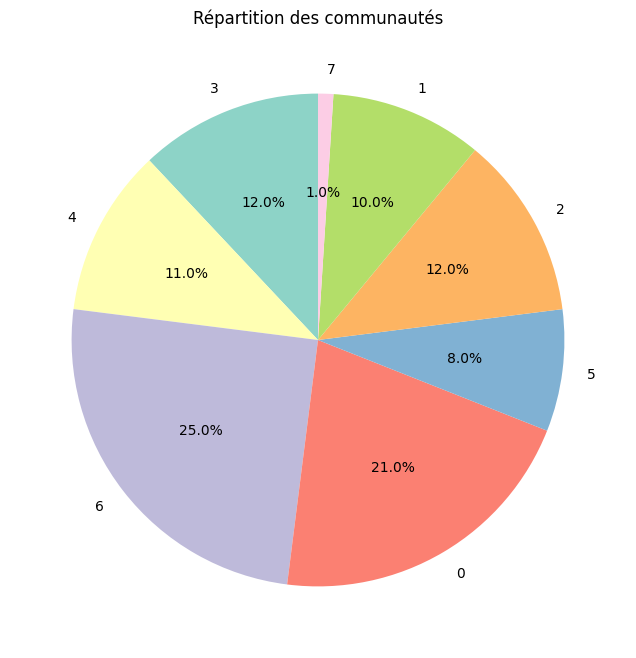

In [ ]:
from collections import Counter

# Compter le nombre de nœuds par communauté
community_sizes = Counter(best_partition.values())

# Créer un diagramme en camembert pour visualiser la répartition
labels = community_sizes.keys()
sizes = community_sizes.values()

plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=plt.cm.Set3.colors)
plt.title("Répartition des communautés")
plt.show()


In [ ]:
import plotly.graph_objects as go
import networkx as nx
import community.community_louvain as community_louvain

# Appliquer l'algorithme de Louvain pour détecter les communautés
partition = community_louvain.best_partition(G)

# Obtenir la position des nœuds
pos = nx.spring_layout(G, seed=42)

# Créer une visualisation interactive du graphe avec Plotly
edge_x = []
edge_y = []

# Ajouter les arêtes
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

fig = go.Figure(go.Scatter(x=edge_x, y=edge_y, mode='lines', line=dict(color='gray', width=1), hoverinfo='none'))

# Obtenir les couleurs des nœuds en fonction des communautés
node_color = [partition[node] for node in G.nodes()]

# Normaliser les couleurs des communautés (utilisation de 'Viridis' pour plus de variations de couleurs)
unique_communities = len(set(partition.values()))

# Ajouter les nœuds avec des couleurs basées sur les communautés
node_x = [pos[node][0] for node in G.nodes()]
node_y = [pos[node][1] for node in G.nodes()]

fig.add_trace(go.Scatter(
    x=node_x,
    y=node_y,
    mode='markers',
    marker=dict(size=10, color=node_color, colorscale='Viridis', showscale=True,
                colorbar=dict(title="Communautés")),
    text=[f'Node: {node}<br>Communauté: {partition[node]}' for node in G.nodes()],  # Infos au survol
    hoverinfo='text'
))

# Ajouter une légende et ajuster la mise en page
fig.update_layout(
    showlegend=False,
    title="Visualisation interactive des communautés (Algorithme de Louvain)",
    xaxis_showgrid=False, yaxis_showgrid=False, xaxis_zeroline=False, yaxis_zeroline=False
)

# Afficher la figure interactive
fig.show()


In [ ]:
for community_id in set(partition.values()):
    subgraph_nodes = [node for node, comm in partition.items() if comm == community_id]
    H = G.subgraph(subgraph_nodes)
    degree_centrality = nx.degree_centrality(H)

    # Trier les nœuds par centralité décroissante
    sorted_nodes = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

    print(f"\nCommunauté {community_id} :")
    print(f"Nombre de nœuds : {len(subgraph_nodes)}")

    # Afficher les 5 nœuds avec la plus haute centralité
    print("Top 5 des nœuds avec la plus haute centralité :")
    for i, (node, centrality) in enumerate(sorted_nodes[:5], 1):
        print(f"{i}. Nœud : {node}, Centralité : {centrality:.4f}")

    # Afficher le nœud avec la plus faible centralité pour plus de perspective
    bottom_node = sorted_nodes[-1][0]
    print(f"Nœud avec la plus faible centralité : {bottom_node}, Centralité : {degree_centrality[bottom_node]:.4f}")



Communauté 0 :
Nombre de nœuds : 1
Top 5 des nœuds avec la plus haute centralité :
1. Nœud : 85, Centralité : 1.0000
Nœud avec la plus faible centralité : 85, Centralité : 1.0000

Communauté 1 :
Nombre de nœuds : 25
Top 5 des nœuds avec la plus haute centralité :
1. Nœud : 21, Centralité : 0.2500
2. Nœud : 36, Centralité : 0.2500
3. Nœud : 55, Centralité : 0.2083
4. Nœud : 64, Centralité : 0.2083
5. Nœud : 83, Centralité : 0.2083
Nœud avec la plus faible centralité : 58, Centralité : 0.0417

Communauté 2 :
Nombre de nœuds : 16
Top 5 des nœuds avec la plus haute centralité :
1. Nœud : 47, Centralité : 0.4667
2. Nœud : 78, Centralité : 0.3333
3. Nœud : 76, Centralité : 0.2000
4. Nœud : 13, Centralité : 0.2000
5. Nœud : 14, Centralité : 0.2000
Nœud avec la plus faible centralité : 98, Centralité : 0.0667

Communauté 3 :
Nombre de nœuds : 24
Top 5 des nœuds avec la plus haute centralité :
1. Nœud : 75, Centralité : 0.2609
2. Nœud : 22, Centralité : 0.2174
3. Nœud : 31, Centralité : 0.2174

In [ ]:
# Calculer la densité de chaque communauté
from networkx.algorithms.community import modularity

for community_id in set(partition.values()):
    subgraph_nodes = [node for node, comm in partition.items() if comm == community_id]
    H = G.subgraph(subgraph_nodes)
    density = nx.density(H)
    print(f"Densité de la communauté {community_id} : {density}")


Densité de la communauté 0 : 0
Densité de la communauté 1 : 0.13666666666666666
Densité de la communauté 2 : 0.18333333333333332
Densité de la communauté 3 : 0.13405797101449277
Densité de la communauté 4 : 0.3111111111111111
Densité de la communauté 5 : 0.14855072463768115


In [ ]:
# Calculer la modularité de la partition
modularity_value = community_louvain.modularity(partition, G)
print(f"Modularité globale : {modularity_value}")


Modularité globale : 0.4281175049456417


In [ ]:
# Calculer la centralité des degrés pour les nœuds dans chaque communauté
for community_id in set(partition.values()):
    subgraph_nodes = [node for node, comm in partition.items() if comm == community_id]
    H = G.subgraph(subgraph_nodes)
    degree_centrality = nx.degree_centrality(H)
    top_node = max(degree_centrality, key=degree_centrality.get)
    print(f"Nœud avec la plus haute centralité dans la communauté {community_id} : {top_node}, Centralité : {degree_centrality[top_node]}")


Nœud avec la plus haute centralité dans la communauté 0 : 85, Centralité : 1
Nœud avec la plus haute centralité dans la communauté 1 : 21, Centralité : 0.25
Nœud avec la plus haute centralité dans la communauté 2 : 47, Centralité : 0.4666666666666667
Nœud avec la plus haute centralité dans la communauté 3 : 75, Centralité : 0.2608695652173913
Nœud avec la plus haute centralité dans la communauté 4 : 30, Centralité : 0.4444444444444444
Nœud avec la plus haute centralité dans la communauté 5 : 11, Centralité : 0.2608695652173913


input

In [ ]:
import pandas as pd
from rdflib import Graph, Namespace, URIRef

# Définir les namespaces
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")

# Créer un graphe RDF
G = Graph()

# Charger les données RDF dans le graphe
# Remplace "path_to_your_ttl_file.ttl" par le chemin de ton fichier TTL
G.parse("/content/drive/MyDrive/teaching_akg.ttl", format="ttl")



for className in G.subjects(RDF.type,OWL.Class):
    #print(className)
    for instance in G.subjects(RDF.type,className):
        print(instance)

http://sonfack.com/2023/12/tao/objective-969f073e-1e01-4ad0-a0f0-fb806ba5a50e
http://sonfack.com/2023/12/tao/objective-ddd7e420-9347-4a53-8f06-d30d3efd8398
http://sonfack.com/2023/12/tao/objective-9a59e20a-60f0-4798-8895-50f6b79621c5
http://sonfack.com/2023/12/tao/objective-f4de69e1-e2ba-41a6-a268-803293e73080
http://sonfack.com/2023/12/tao/objective-0b6e8fa9-d03d-4636-ab9c-b34578b4ea45
http://sonfack.com/2023/12/tao/objective-59c2099d-746e-4872-bbc1-ea0891430f47
http://sonfack.com/2023/12/tao/objective-284ef78c-99f5-45f0-935a-553678664616
http://sonfack.com/2023/12/tao/classroom-b2c326d0-8551-41c4-aee5-11365e117523
http://sonfack.com/2023/12/tao/classroom-c1a5b39b-992c-49fb-9c7e-a1ffaa92e884
http://sonfack.com/2023/12/tao/classroom-9b1749fc-8ce7-42ce-89d6-4e7ff8b826c7
http://sonfack.com/2023/12/tao/classroom-25eafa60-5f87-4e1f-9609-93bcdcfbb0c9
http://sonfack.com/2023/12/tao/classroom-3414ff41-3e7a-44de-a679-baac1ab873c2
http://sonfack.com/2023/12/tao/tutorialroom-57179062-99d4-4da0-8

In [ ]:
import pandas as pd
from rdflib import Graph, Namespace, RDF, OWL

# Définir les namespaces
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")

# Créer un graphe RDF
G = Graph()

# Charger les données RDF dans le graphe
G.parse("/content/drive/MyDrive/teaching_akg.ttl", format="ttl")

# Créer une liste pour stocker les classes et instances
datas = []

# Parcourir les classes dans le graphe et leurs instances
for className in G.subjects(RDF.type, OWL.Class):
   datas.append(className)

for className in G.subjects(RDF.type, OWL.Class):
    for instance in G.subjects(RDF.type, className):
        # Ajouter la classe et l'instance dans la liste
        datas.append(instance)



# Afficher le tableau
for d in datas:
  print(d)


print("")

http://sonfack.com/2023/12/tao/teachingObject
http://sonfack.com/2023/12/tao/tutorialObject
http://sonfack.com/2023/12/tao/projectObject
http://sonfack.com/2023/12/tao/Building
http://sonfack.com/2023/12/tao/ClassRoom
http://sonfack.com/2023/12/tao/TutorialRoom
http://sonfack.com/2023/12/tao/PracticalRoom
http://sonfack.com/2023/12/tao/Physical
http://sonfack.com/2023/12/tao/Human
http://sonfack.com/2023/12/tao/Automaton
http://sonfack.com/2023/12/tao/Moral
http://sonfack.com/2023/12/tao/Organization
http://sonfack.com/2023/12/tao/Community
http://sonfack.com/2023/12/tao/AdministrativeStaff
http://sonfack.com/2023/12/tao/Students
http://sonfack.com/2023/12/tao/TeachingStaff
http://sonfack.com/2023/12/tao/DigitalResource
http://sonfack.com/2023/12/tao/Software
http://sonfack.com/2023/12/tao/SoftDocument
http://sonfack.com/2023/12/tao/Video
http://sonfack.com/2023/12/tao/Communication
http://sonfack.com/2023/12/tao/TeachingMaterial
http://sonfack.com/2023/12/tao/Electronic
http://sonfack

In [ ]:

dt = input("Entrez le nom de votre entité : ")


print("votre entité est, " + dt + "!")


for d in datas:
  if d.split("/")[-1] == dt:
    print(d)

In [ ]:

# Définir les namespaces
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")

# Fonction pour construire l'URL à partir du namespace et de la référence
def build_url_from_namespace(reference):
    return str(tao_namespace[reference])

# Entrée utilisateur
dt = input("Entrez la référence de votre entité : ")

# Recherche de toutes les URLs qui contiennent le mot-clé
matching_urls = [url for url in datas if dt in url]

# Afficher les résultats
if matching_urls:
    print("\nURLs trouvées contenant le mot-clé '" + dt + "' :")
    for url in matching_urls:
        print(url)
else:
    # Si aucune URL n'est trouvée avec le mot-clé, on essaie avec la référence complète
    constructed_url = build_url_from_namespace(dt)
    found_url = next((url for url in datas if url.strip() == constructed_url.strip()), None)

    if found_url:
        print("\nURL trouvée :")
        print(found_url)
    else:
        print("\nAucune URL trouvée avec cet identifiant ou ce mot-clé.")

print("\nVotre entité est : " + dt + " !")


In [ ]:
print(df.columns)


Index(['Nœud', 'Communauté'], dtype='object')


In [ ]:
def find_entities_by_name(name):
    matching_entities = df[df['entity_name'].str.contains(name, case=False, na=False)]
    return matching_entities


In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from rdflib import Graph, Namespace
from networkx.algorithms import community

# Initialisation du graphe RDF
graph = Graph()
graph.parse("/content/drive/MyDrive/enseignant_akg.ttl", format="ttl")

# Définir les namespaces
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")

# Charger les triplets du graphe RDF dans un DataFrame
def load_graph_to_dataframe(graph):
    rows = []
    for s, p, o in graph:
        rows.append({
            'subject': s,
            'predicate': p,
            'object': o
        })
    return pd.DataFrame(rows)

# Charger les triplets RDF dans un DataFrame
df = load_graph_to_dataframe(graph)

# Nettoyer les noms pour qu'ils soient plus lisibles
def get_clean_name(uri):
    """Extrait un nom propre d'un URI pour l'affichage."""
    if '#' in uri:
        return uri.split('#')[-1]
    return uri.split('/')[-1]

# Fonction pour récupérer les informations d'une activité
def read_akg_node(node_uri, graph):
    """Récupère toutes les relations pour un nœud RDF donné."""
    node_info = {}
    for s, p, o in graph.triples((node_uri, None, None)):
        if p not in node_info:
            node_info[p] = []
        node_info[p].append(o)
    return node_info

# Fonction pour ajouter les activités et leurs relations dans NetworkX
def add_activity_to_nxgraph(G, activity_uri, activity_info):
    """Ajoute les activités et leurs relations au graphe NetworkX."""
    # Essayer de récupérer le nom (hasName)
    has_name = activity_info.get('http://sonfack.com/2023/12/tao/hasName', [None])[0]
    if has_name:
        central_node = get_clean_name(has_name)  # Utiliser le nom nettoyé
    else:
        central_node = get_clean_name(activity_uri)  # Utiliser l'URI nettoyée si hasName n'existe pas

    for pred, obj_list in activity_info.items():
        pred_label = pred.split('/')[-1]
        if '#' in pred_label:
            pred_label = pred_label.split('#')[1]

        for obj in obj_list:
            obj_label = get_clean_name(obj)  # Nettoyer également les objets
            node_info = read_akg_node(obj_label, graph)

            if node_info:
                obj_label = node_info.get('http://sonfack.com/2023/12/tao/hasName', [None])[0]
                if obj_label is None:
                    continue
                obj_label = get_clean_name(obj_label)

            G.add_node(central_node)
            G.add_node(obj_label)
            G.add_edge(central_node, obj_label, label=pred_label)

# Fonction pour rechercher des entités par nom du sujet ou de l'objet
def find_entities_by_name(name):
    try:
        # Rechercher des correspondances dans les colonnes 'subject' et 'object'
        matching_entities = df[(df['subject'].astype(str).str.contains(name, case=False, na=False)) |
                               (df['object'].astype(str).str.contains(name, case=False, na=False))]
        return matching_entities
    except KeyError:
        print("Les colonnes 'subject' ou 'object' sont introuvables dans les données. Veuillez vérifier le fichier.")
        return pd.DataFrame()  # Renvoie un DataFrame vide en cas d'erreur

# Fonction pour afficher les entités et demander une sélection par nom d'objet
def choose_entity_by_object_name(entities):
    print("\nEntités trouvées :")
    for i, row in entities.iterrows():
        print(f"{i}: URI: {row['subject']} - Objet: {row['object']}")

    # Validation de l'entrée utilisateur pour éviter les erreurs
    while True:
        try:
            choice = input("\nEntrez le nom de l'objet que vous souhaitez sélectionner: ")
            # Rechercher l'objet choisi dans les entités trouvées
            matched_entity = entities[entities['object'].astype(str).str.contains(choice, case=False, na=False)]

            if not matched_entity.empty:
                return matched_entity.iloc[0]  # Retourner la première entité trouvée
            else:
                print("Objet non trouvé, veuillez réessayer.")
        except ValueError:
            print("Entrée invalide, veuillez entrer un nom valide.")

# Fonction pour visualiser tout le graphe avec les communautés
def visualize_graph_with_communities(G, partition):
    """Visualiser tout le graphe avec les communautés détectées."""
    plt.figure(figsize=(12, 12))

    # Utiliser une palette de couleurs pour les différentes communautés
    community_colors = [f"C{community_id % 10}" for community_id in partition.values()]

    # Positionner les nœuds
    pos = nx.spring_layout(G, seed=42)  # Utiliser le même layout pour avoir une cohérence visuelle

    # Dessiner les nœuds avec les couleurs de la communauté
    nx.draw_networkx_nodes(G, pos, node_color=community_colors, node_size=300, cmap=plt.cm.Set1)

    # Dessiner les arêtes
    nx.draw_networkx_edges(G, pos, edge_color="gray", alpha=0.5)

    # Afficher les labels des nœuds
    node_labels = {node: get_clean_name(node) for node in G.nodes()}  # Utiliser les noms nettoyés
    nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8, font_weight="bold", font_color="black")

    # Afficher les labels des arêtes
    edge_labels = nx.get_edge_attributes(G, 'label')
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red', font_size=10)

    plt.title("Visualisation des communautés dans le Graphe de Connaissances")
    plt.show()

# Fonction pour détecter les communautés avec l'algorithme de Louvain
def detect_communities(G):
    """Détecte les communautés dans le graphe en utilisant l'algorithme de Louvain."""
    # Utiliser l'algorithme de Louvain pour détecter les communautés
    communities_generator = community.louvain_communities(G, seed=42)

    # Créer une partition sous forme de dictionnaire {node: community_id}
    partition = {}
    for i, comm in enumerate(communities_generator):
        for node in comm:
            partition[node] = i  # Assigner l'ID de la communauté

    return partition

# Fonction pour visualiser l'activité et détecter les communautés
def visualize_activity_with_communities(activity_uri, graph):
    """Crée un graphe NetworkX pour une activité et détecte les communautés."""
    G = nx.Graph()  # Créer un graphe vide

    # Récupérer les informations de l'activité depuis le graphe RDF
    activity_info = read_akg_node(activity_uri, graph)

    # Ajouter l'activité et ses relations dans le graphe NetworkX
    add_activity_to_nxgraph(G, activity_uri, activity_info)

    # Détecter les communautés
    partition = detect_communities(G)

    # Visualiser tout le graphe avec les communautés
    visualize_graph_with_communities(G, partition)

# Recherche des entités correspondant au nom entré dans 'subject' ou 'object'
entity_name_input = input("\nEntrez un mot pour rechercher dans les sujets ou objets : ")
matching_entities = find_entities_by_name(entity_name_input)

# Si des entités sont trouvées, permettre à l'utilisateur de choisir
if not matching_entities.empty:
    chosen_entity = choose_entity_by_object_name(matching_entities)

    # Visualiser l'activité sélectionnée et détecter les communautés
    visualize_activity_with_communities(chosen_entity['subject'], graph)
else:
    print("Aucune entité trouvée avec ce mot-clé.")



Entrez un mot pour rechercher dans les sujets ou objets : bsc

Entités trouvées :
5: URI: http://sonfack.com/2023/12/tao/bsc-410688e8-e5d3-4e9c-9ca4-c28bf92827af - Objet: http://sonfack.com/2023/12/tao/Students
22: URI: http://sonfack.com/2023/12/tao/secourse-511f491d-ea2b-428f-900e-604ea778dab5 - Objet: http://sonfack.com/2023/12/tao/bsc-410688e8-e5d3-4e9c-9ca4-c28bf92827af
39: URI: http://sonfack.com/2023/12/tao/bsc-410688e8-e5d3-4e9c-9ca4-c28bf92827af - Objet: Bsc year 3
42: URI: http://sonfack.com/2023/12/tao/pycourse-3f993bf5-1c2f-4f58-b85a-7b6b92bcf64b - Objet: http://sonfack.com/2023/12/tao/bsc-09c739e7-2a77-4b4c-9197-cdba96c340dd
96: URI: http://sonfack.com/2023/12/tao/dbtutorial-78aca3f8-53fd-4f47-9406-414b493efe19 - Objet: http://sonfack.com/2023/12/tao/bsc-09c739e7-2a77-4b4c-9197-cdba96c340dd
180: URI: http://sonfack.com/2023/12/tao/uicourse-eaf2d283-4eb8-4024-a2c5-539984984fdd - Objet: http://sonfack.com/2023/12/tao/bsc-a00ac66e-e5df-4a66-9691-42d318700616
194: URI: http:/

test2

In [ ]:
from rdflib import Graph
import pandas as pd

# Charger les données RDF dans le graphe
graph = Graph()
graph.parse("/content/drive/MyDrive/teaching_akg.ttl", format="ttl")

def find_entity_info_by_value(search_value, graph):
    """
    Chercher une entité dans le graphe RDF par son sujet, prédicat ou objet.
    :param search_value: Le mot-clé ou élément à rechercher dans le graphe.
    :param graph: Le graphe RDF où rechercher.
    :return: Liste des triplets RDF contenant la valeur recherchée.
    """
    entity_info = []

    # Parcourir tous les triplets du graphe (sujet, prédicat, objet)
    for subj, pred, obj in graph:
        # Vérifier si la valeur recherchée est présente dans le sujet, prédicat ou objet
        if search_value.lower() in str(subj).lower() or search_value.lower() in str(pred).lower() or search_value.lower() in str(obj).lower():
            entity_info.append([str(subj), str(pred), str(obj)])

    return entity_info

def display_entity_info_as_table(search_value, graph):
    """
    Afficher les informations RDF d'une entité en fonction d'un mot-clé (sujet, prédicat ou objet) sous forme de tableau.
    """
    # Récupérer les informations en fonction de la valeur recherchée
    entity_info = find_entity_info_by_value(search_value, graph)

    # Créer un DataFrame pour afficher les résultats sous forme de tableau
    if entity_info:
        df = pd.DataFrame(entity_info, columns=["Sujet", "Propriété", "Objet"])
        return df
    else:
        return pd.DataFrame([], columns=["Sujet", "Propriété", "Objet"])

# Demander à l'utilisateur d'entrer un mot-clé à rechercher
search_value = input("\nEntrez un mot pour rechercher dans les sujets, prédicats ou objets : ")

# Afficher les résultats sous forme de tableau
df_entity_info = display_entity_info_as_table(search_value, graph)

# Afficher le tableau s'il contient des données
if not df_entity_info.empty:
    print(df_entity_info.to_string(index=False))
else:
    print("Aucune entité trouvée pour le mot-clé spécifié.")

# Si vous êtes dans un environnement Jupyter/Colab, cela affichera le tableau directement :
df_entity_info  # Affichage du DataFrame dans Colab ou Jupyter


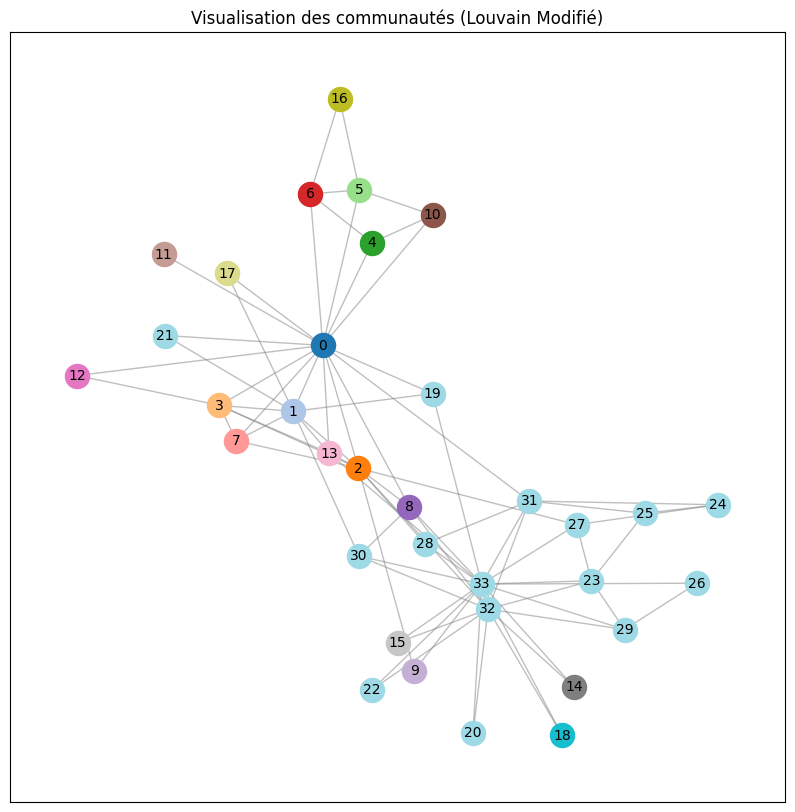

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import random

def modified_louvain_algorithm(G):
    # Initialisation : Chaque sommet forme sa propre communauté
    partition = {node: i for i, node in enumerate(G.nodes())}

    # Créer une liste initiale de communautés, chaque nœud est dans sa propre communauté
    initial_communities = [{v} for v in G.nodes()]
    Q = nx.algorithms.community.modularity(G, initial_communities)

    # Pour chaque sommet v, commencer la fusion
    for v in G.nodes():
        # Créer une liste triée aléatoirement des voisins de v
        L = list(G.neighbors(v))
        random.shuffle(L)

        # Pour chaque sommet voisin de v
        for n in L:
            # Initialisation de la variable de comparaison
            q_max = -float('inf')
            best_neighbor = None

            # Calculer la partition actuelle
            current_partition = [set() for _ in range(len(set(partition.values())))]
            for node, comm in partition.items():
                current_partition[comm].add(node)

            # Calculer la modularité avant la fusion
            q = nx.algorithms.community.modularity(G, current_partition)

            # Si la modularité après fusion est meilleure
            if q > q_max:
                best_neighbor = n
                q_max = q

            # Si la meilleure modularité après fusion est supérieure à Q
            if q_max > Q:
                # Fusionner les deux sommets dans la même communauté
                partition[v] = partition[best_neighbor]
                Q = q_max  # Mettre à jour la modularité courante
                break

    # Transformer le dictionnaire en liste de communautés
    communities = {}
    for node, comm in partition.items():
        if comm not in communities:
            communities[comm] = set()
        communities[comm].add(node)

    # Créer la liste des communautés
    final_partition = list(communities.values())

    # Créer un dictionnaire à partir de la partition pour que chaque nœud ait une communauté
    partition_dict = {}
    for i, community in enumerate(final_partition):
        for node in community:
            partition_dict[node] = i

    # Calculer la modularité finale avec la partition obtenue
    modularity_finale = nx.algorithms.community.modularity(G, final_partition)

    return partition_dict, modularity_finale

def visualize_graph_with_communities(G, partition):
    """Visualiser tout le graphe avec les communautés détectées."""
    plt.figure(figsize=(10, 10))

    pos = nx.spring_layout(G, seed=42)  # Positionnement des nœuds

    # Générer une palette de couleurs pour chaque communauté
    unique_communities = len(set(partition.values()))
    color_map = [plt.cm.tab20(i) for i in range(unique_communities)]

    # Affichage des arêtes
    nx.draw_networkx_edges(G, pos, alpha=0.5, edge_color='gray')

    # Dessiner les nœuds en fonction de leurs communautés
    for i, community in enumerate(set(partition.values())):
        nodes_in_community = [node for node in G.nodes() if partition[node] == community]
        nx.draw_networkx_nodes(G, pos, nodelist=nodes_in_community, node_color=[color_map[i]], node_size=300)

    # Afficher les labels des nœuds
    nx.draw_networkx_labels(G, pos, font_size=10, font_color='black')

    plt.title("Visualisation des communautés (Louvain Modifié)")
    plt.show()

# Exemple d'utilisation avec un graphe
G = nx.karate_club_graph()  # Exemple de graphe

# Appliquer l'algorithme de Louvain modifié
partition, modularity = modified_louvain_algorithm(G)

# Visualiser le graphe avec les communautés détectées
visualize_graph_with_communities(G, partition)


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import random

def get_clean_name(uri):
    """Fonction pour nettoyer l'URI et extraire un nom simplifié."""
    return uri.split('/')[-1]  # Garde uniquement la dernière partie de l'URI

def modified_louvain_algorithm(G, graph):
    # Initialisation : Chaque sommet forme sa propre communauté
    partition = {node: i for i, node in enumerate(G.nodes())}

    # Créer une liste initiale de communautés, chaque nœud est dans sa propre communauté
    initial_communities = [{v} for v in G.nodes()]
    Q = nx.algorithms.community.modularity(G, initial_communities)

    # Pour chaque sommet v, commencer la fusion
    for v in G.nodes():
        # Créer une liste triée aléatoirement des voisins de v
        L = list(G.neighbors(v))
        random.shuffle(L)

        # Pour chaque sommet voisin de v
        for n in L:
            # Initialisation de la variable de comparaison
            q_max = -float('inf')
            best_neighbor = None

            # Calculer la partition actuelle
            current_partition = [set() for _ in range(len(set(partition.values())))]
            for node, comm in partition.items():
                current_partition[comm].add(node)

            # Calculer la modularité avant la fusion
            q = nx.algorithms.community.modularity(G, current_partition)

            # Si la modularité après fusion est meilleure
            if q > q_max:
                best_neighbor = n
                q_max = q

            # Si la meilleure modularité après fusion est supérieure à Q
            if q_max > Q:
                # Fusionner les deux sommets dans la même communauté
                partition[v] = partition[best_neighbor]
                Q = q_max  # Mettre à jour la modularité courante
                break

    # Transformer le dictionnaire en liste de communautés
    communities = {}
    for node, comm in partition.items():
        if comm not in communities:
            communities[comm] = set()
        communities[comm].add(node)

    # Créer la liste des communautés
    final_partition = list(communities.values())

    # Créer un dictionnaire à partir de la partition pour que chaque nœud ait une communauté
    partition_dict = {}
    for i, community in enumerate(final_partition):
        for node in community:
            partition_dict[node] = i

    # Calculer la modularité finale avec la partition obtenue
    modularity_finale = nx.algorithms.community.modularity(G, final_partition)

    return partition_dict, modularity_finale

def extract_and_clean_labels(activity_info, activity_uri, graph):
    """Extraire et nettoyer les noms des nœuds en fonction de l'URI ou de hasName."""
    has_name = activity_info.get('http://sonfack.com/2023/12/tao/hasName', [None])[0]
    if has_name:
        central_node = has_name  # Utiliser le nom hasName
    else:
        central_node = get_clean_name(activity_uri)  # Utiliser l'URI nettoyée

    return central_node

def visualize_graph_with_communities(G, partition, graph):
    """Visualiser tout le graphe avec les communautés détectées et afficher les noms nettoyés ou hasName."""
    plt.figure(figsize=(10, 10))

    pos = nx.spring_layout(G, seed=42)  # Positionnement des nœuds

    # Générer une palette de couleurs pour chaque communauté
    unique_communities = len(set(partition.values()))
    color_map = [plt.cm.tab20(i) for i in range(unique_communities)]

    # Affichage des arêtes
    nx.draw_networkx_edges(G, pos, alpha=0.5, edge_color='gray')

    # Dessiner les nœuds en fonction de leurs communautés
    for i, community in enumerate(set(partition.values())):
        nodes_in_community = [node for node in G.nodes() if partition[node] == community]
        nx.draw_networkx_nodes(G, pos, nodelist=nodes_in_community, node_color=[color_map[i]], node_size=300)

    # Ajouter les labels des nœuds avec le nom (soit hasName soit l'URI nettoyée)
    labels = {}
    for node in G.nodes():
        activity_info = read_akg_node(node, graph)  # Récupère les informations de chaque nœud
        labels[node] = extract_and_clean_labels(activity_info, node, graph) + f"\nComm {partition[node]}"

    nx.draw_networkx_labels(G, pos, labels=labels, font_size=10, font_color='black')

    plt.title("Visualisation des communautés (Louvain Modifié) avec nom et numéro de communauté")
    plt.show()

# Exemple d'utilisation avec un graphe
G = nx.karate_club_graph()  # Exemple de graphe
graph = Graph()  # Remplacer avec le graphe RDF si nécessaire

# Appliquer l'algorithme de Louvain modifié
partition, modularity = modified_louvain_algorithm(G, graph)

# Visualiser le graphe avec les communautés détectées
visualize_graph_with_communities(G, partition, graph)


In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

# Générer un graphe exemple
G = nx.karate_club_graph()  # Exemple avec un graphe pré-défini, remplacez par G = (V, E) si vous avez un graphe personnalisé

# Étape 1 : Créer une matrice de dissimilarité (peut être basée sur la distance entre les nœuds, par exemple)
def create_dissimilarity_matrix(G):
    nodes = list(G.nodes())
    dissimilarity_matrix = np.zeros((len(nodes), len(nodes)))

    for i in range(len(nodes)):
        for j in range(i + 1, len(nodes)):
            try:
                dissimilarity_matrix[i][j] = nx.shortest_path_length(G, nodes[i], nodes[j])
            except nx.NetworkXNoPath:
                dissimilarity_matrix[i][j] = float('inf')  # Si pas de chemin entre i et j
            dissimilarity_matrix[j][i] = dissimilarity_matrix[i][j]

    return dissimilarity_matrix, nodes

# Étape 2 : Appliquer l'algorithme de classification ascendante hiérarchique
def simple_linkage_clustering(G):
    dissimilarity_matrix, nodes = create_dissimilarity_matrix(G)
    clusters = [[n] for n in nodes]  # Chaque nœud est initialement un cluster

    while len(clusters) > 1:
        # Trouver la paire de clusters avec la dissimilarité minimale
        min_dist = float('inf')
        to_merge = (None, None)

        for i in range(len(clusters)):
            for j in range(i + 1, len(clusters)):
                min_dissimilarity = min(
                    dissimilarity_matrix[nodes.index(a)][nodes.index(b)]
                    for a in clusters[i] for b in clusters[j]
                )
                if min_dissimilarity < min_dist:
                    min_dist = min_dissimilarity
                    to_merge = (i, j)

        # Fusionner les clusters
        if to_merge[0] is not None and to_merge[1] is not None:
            clusters[to_merge[0]] += clusters[to_merge[1]]
            del clusters[to_merge[1]]

        print(f"Fusion des clusters : {clusters}")

    return clusters

# Exécution de l'algorithme
final_clusters = simple_linkage_clustering(G)
print("Clusters finaux :", final_clusters)

# Étape 3 : Visualiser le résultat
def plot_graph(G, clusters):
    pos = nx.spring_layout(G)
    colors = ['#%06X' % np.random.randint(0, 0xFFFFFF) for _ in range(len(clusters))]

    plt.figure(figsize=(8, 6))

    for i, cluster in enumerate(clusters):
        nx.draw_networkx_nodes(G, pos, nodelist=cluster, node_color=colors[i], node_size=300)

    nx.draw_networkx_edges(G, pos, alpha=0.5)
    nx.draw_networkx_labels(G, pos)

    plt.title("Clustering par lien simple")
    plt.show()

# Visualiser les clusters
plot_graph(G, final_clusters)


In [ ]:
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt

# Utiliser la matrice de dissimilarité pour créer un dendrogramme
dissimilarity_matrix, _ = create_dissimilarity_matrix(G)
Z = sch.linkage(dissimilarity_matrix, method='single')

# Créer un dendrogramme
plt.figure(figsize=(10, 8))
sch.dendrogram(Z)
plt.title('Dendrogramme des communautés')
plt.xlabel('Nœuds')
plt.ylabel('Dissimilarité')
plt.show()


In [ ]:
from rdflib import Graph, URIRef
import pandas as pd

# Charger les données RDF dans le graphe
graph = Graph()
graph.parse("/content/drive/MyDrive/teaching_akg.ttl", format="ttl")

def get_entity_info(entity_uri, graph):
    """
    Interroger le graphe RDF pour obtenir les informations d'une entité spécifique.
    """
    entity_info = []

    # Parcourir les triplets où l'entité est le sujet
    for pred, obj in graph.predicate_objects(subject=URIRef(entity_uri)):
        entity_info.append([str(entity_uri), str(pred), str(obj)])

    return entity_info

def display_entity_info_as_table(entity_uri, graph):
    """
    Afficher les informations RDF d'une entité sous forme de tableau.
    """
    # Récupérer les informations de l'entité
    entity_info = get_entity_info(entity_uri, graph)

    # Créer un DataFrame pour afficher les résultats sous forme de tableau
    df = pd.DataFrame(entity_info, columns=["Sujet", "Propriété", "Objet"])

    return df

# Interroger une entité spécifique
entity_uri = "http://sonfack.com/2023/12/tao/Automaton"  # Remplacez par l'URI de votre choix

# Recherche des entités correspondant au nom entré dans 'subject' ou 'object'
entity_name_input = input("\nEntrez un mot pour rechercher dans les sujets ou objets : ")
matching_entities = find_entities_by_name(entity_name_input)

# Si des entités sont trouvées, permettre à l'utilisateur de choisir
if not matching_entities.empty:
    chosen_entity = choose_entity_by_object_name(matching_entities)
df_entity_info = display_entity_info_as_table(entity_uri, graph)

# Afficher le tableau
print(df_entity_info)

# Si vous êtes dans un environnement Jupyter/Colab, cela affichera le tableau directement :
df_entity_info  # Affichage du DataFrame dans Colab ou Jupyter


In [ ]:
import pandas as pd
from rdflib import Graph, Namespace, URIRef

# Définir les namespaces
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")

# Créer un graphe RDF
G = Graph()

# Charger les données RDF dans le graphe
# Remplace "path_to_your_ttl_file.ttl" par le chemin de ton fichier TTL
G.parse("/content/drive/MyDrive/teaching_akg.ttl", format="ttl")

def get_entity_info(entity_uri, graph):
    """
    Interroger le graphe RDF pour obtenir les informations d'une entité spécifique.
    """
    entity_info = []

    # Parcourir les triplets où l'entité est le sujet
    for pred, obj in graph.predicate_objects(subject=URIRef(entity_uri)):
        entity_info.append([entity_uri, pred, obj])

    return entity_info

def display_entity_info_as_table(entity_uri, graph):
    """
    Afficher les informations RDF d'une entité sous forme de tableau.
    """
    # Récupérer les informations de l'entité
    entity_info = get_entity_info(entity_uri, graph)

    # Créer un DataFrame pour afficher les résultats sous forme de tableau
    df = pd.DataFrame(entity_info, columns=["Sujet", "Propriété", "Objet"])

    return df

# Exemple : Interroger le système pour obtenir les informations liées à une entité spécifique
entity_uri = "http://sonfack.com/2023/12/tao/Automaton"  # Remplacer par l'URI de l'entité à interroger
df_entity_info = display_entity_info_as_table(entity_uri, G)

# Afficher le tableau sous forme textuelle dans Colab
df_entity_info  # Cette ligne affiche le DataFrame directement dans Colab


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from rdflib import Graph, Namespace

# Définir les namespaces
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")

# Créer un graphe RDF
rdf_graph = Graph()

# Charger les données RDF dans le graphe
rdf_graph.parse("/content/drive/MyDrive/teaching_akg.ttl", format="ttl")

# Convertir le graphe RDF en un graphe NetworkX
G = nx.DiGraph()

for subj, pred, obj in rdf_graph:
    G.add_edge(subj, obj, predicate=pred)

# Fonction pour dessiner un graphe centré sur un nœud particulier
def draw_centered_graph(G, center_node_label):
    # Trouver le nœud qui correspond à l'activité donnée (en URI ou en label)
    center_node = None
    for node in G.nodes:
        if center_node_label in str(node):
            center_node = node
            break

    if not center_node:
        print(f"Nœud avec le label {center_node_label} non trouvé dans le graphe.")
        return

    # Calculer la disposition en centrant le nœud choisi
    pos = nx.spring_layout(G)
    pos[center_node] = [0, 0]  # Centrer le nœud sur (0, 0)

    # Dessiner les nœuds et arêtes
    plt.figure(figsize=(10, 10))

    # Dessiner les autres nœuds
    nx.draw_networkx_nodes(G, pos, node_size=300, nodelist=[n for n in G if n != center_node], node_color='lightblue')

    # Dessiner le nœud centré avec une couleur différente
    nx.draw_networkx_nodes(G, pos, node_size=500, nodelist=[center_node], node_color='red')

    # Dessiner les arêtes
    nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)

    # Ajouter les étiquettes des nœuds
    nx.draw_networkx_labels(G, pos, font_size=10)

    # Titre du graphe
    plt.title(f"Graphe centré sur l'activité {center_node_label}")
    plt.show()

# Exemple : centrer sur une activité spécifique, ici remplace 'Activity_X' par l'activité souhaitée
activity_node_label = "Activity_X"  # Remplacer par l'URI ou le label de l'activité dans votre graphe RDF

# Dessiner le graphe centré sur l'activité
draw_centered_graph(G, activity_node_label)


In [92]:
# Installer ipywidgets
%pip install ipywidgets

# Activer l'extension des widgets pour Jupyter Notebook classique
!jupyter nbextension enable --py widgetsnbextension --sys-prefix

# Activer l'extension pour JupyterLab (si vous utilisez JupyterLab)
!jupyter labextension install @jupyter-widgets/jupyterlab-manager


usage: jupyter [-h] [--version] [--config-dir] [--data-dir] [--runtime-dir]
               [--paths] [--json] [--debug]
               [subcommand]

Jupyter: Interactive Computing

positional arguments:
  subcommand     the subcommand to launch

options:
  -h, --help     show this help message and exit
  --version      show the versions of core jupyter packages and exit
  --config-dir   show Jupyter config dir
  --data-dir     show Jupyter data dir
  --runtime-dir  show Jupyter runtime dir
  --paths        show all Jupyter paths. Add --json for machine-readable
                 format.
  --json         output paths as machine-readable json
  --debug        output debug information about paths

Available subcommands: console dejavu events execute kernel kernelspec lab
labextension labhub migrate nbconvert notebook qtconsole run script server
troubleshoot trust

Jupyter command `jupyter-nbextension` not found.
(Deprecated) Installing extensions with the jupyter labextension install comma

In [96]:
import os
print(os.getcwd())  # Affiche le répertoire de travail actuel


C:\Users\Nael_Gaizka\Documents\projet_tpe


In [ ]:
import ipywidgets as widgets
from IPython.display import display
from rdflib import Graph, Namespace

# Zone de sortie pour afficher les résultats
output_area = widgets.Output()

# Création d'un conteneur d'interface
ui = widgets.VBox([widgets.Label("Résultats des assertions pertinentes du fichier RDF :"), output_area])
display(ui)

def parse_rdf(file_path):
    """
    Parse le fichier RDF et retourne les assertions pertinentes
    """
    graph = Graph()
    graph.parse(file_path, format="ttl")
    
    # Namespace défini (à adapter à votre cas)
    TAO = Namespace("http://sonfack.com/2024/01/tao#")
    
    relevant_assertions = []
    for subj, pred, obj in graph:
        if not str(pred).startswith(str(TAO) + "has") and not str(pred).startswith(str(TAO) + "is"):
            relevant_assertions.append((subj, pred, obj))
    
    return relevant_assertions

# Chemin du fichier TTL (veuillez ajuster ce chemin en fonction de l'emplacement du fichier dans votre Drive)
file_path = "C:/Users/Nael_Gaizka/Documents/projet_tpe/teaching_akg.ttl"

# Charger le fichier RDF et afficher les assertions pertinentes
def load_and_display_rdf():
    with output_area:
        output_area.clear_output()  # Clear previous output
        try:
            relevant_assertions = parse_rdf(file_path)
            for subj, pred, obj in relevant_assertions:
                output_area.append_stdout(f"Subject: {subj.split('#')[-1]}\n")
                output_area.append_stdout(f"Predicate: {pred.split('#')[-1]}\n")
                output_area.append_stdout(f"Object: {obj.split('#')[-1]}\n\n")
        except Exception as e:
            output_area.append_stdout(f"Erreur lors du chargement du fichier RDF : {e}\n")

# Appeler la fonction pour charger et afficher les données
load_and_display_rdf()
